# 1. Introduction

## **Problem Statement**

Accurate prediction of health insurance costs is a critical challenge for insurers, as traditional actuarial methods often rely on generalized assumptions and historical averages that fail to capture individual risk factors.

This leads to premium mispricing, financial risks for insurers, and dissatisfaction among policyholders. Leveraging machine learning and data-driven approaches can enable more precise, personalized, and fair premium estimation based on individual health and demographic attributes, thereby improving competitiveness, risk assessment, and customer trust.

---

## **Aim**

To develop and deploy a machine learning-based predictive model that accurately estimates individual health insurance premiums by analyzing demographic and medical risk factors, thereby enhancing pricing precision, customer satisfaction, and insurer competitiveness.

---

## **Objectives**

1. **Data Exploration & Preparation** – Perform exploratory data analysis (EDA) and hypothesis testing to identify key predictors of insurance costs, handle outliers, and engineer meaningful features (e.g., BMI).

2. **Model Development** – Implement and compare multiple machine learning models (Linear Regression, Decision Trees, Random Forests, Gradient Boosting, Neural Networks) to identify the most accurate and interpretable model.

3. **Model Evaluation** – Validate model performance using appropriate metrics (R², RMSE, MAE) and cross-validation techniques to ensure reliability and robustness.

4. **Interpretability & Insights** – Use feature importance and explainability techniques (e.g., SHAP, correlation analysis) to derive actionable insights on how health and demographic factors influence insurance premiums.

5. **Visualization & Reporting** – Develop interactive dashboards (Tableau/Matplotlib/Seaborn) to visualize relationships between health conditions and insurance costs for deeper business insights.

6. **Deployment** – Create a user-friendly web application (using Streamlit or Flask) that allows insurers, agents, or customers to estimate premiums in real-time based on individual inputs.

7. **Strategic Impact** – Demonstrate how predictive analytics can support insurers in fairer pricing, personalized offerings, improved risk assessment, and enhanced customer engagement.

In [128]:
# Importing Libraries

# 🔹 Standard Library

import os
import pickle
import warnings


# 🔹 Data Analysis & Visualization

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn Style
sns.set(style="whitegrid")


# 🔹 Statistical Analysis & Hypothesis Testing

from scipy import stats
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.outliers_influence import variance_inflation_factor


# 🔹 Machine Learning - Preprocessing & Utilities

from sklearn.model_selection import (
    train_test_split,
    KFold,
    cross_val_score,
    GridSearchCV,
    RandomizedSearchCV,
)
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.utils import resample
from sklearn.exceptions import ConvergenceWarning
from sklearn.inspection import permutation_importance


# 🔹 Machine Learning - Models

# Linear Models
from sklearn.linear_model import (
    LinearRegression,
    Ridge, RidgeCV,
    Lasso, LassoCV,
    ElasticNet, ElasticNetCV,
)

# Tree-Based Models
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    RandomForestRegressor,
    BaggingRegressor,
    AdaBoostRegressor,
    GradientBoostingRegressor,
)

# Other Models
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans


# 🔹 Machine Learning - Metrics

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
)


# 🔹 Advanced ML / Gradient Boosting Libraries

from xgboost import XGBRegressor
import lightgbm as lgb


# 🔹 Deep Learning (TensorFlow / Keras)

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
# from tensorflow.keras.wrappers.scikit_learn import KerasRegressor   # OLD
from scikeras.wrappers import KerasRegressor   # NEW


# 🔹 Explainable AI / Feature Importance

import shap


# 🔹 Warnings Configuration

warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# 2. Exploratory Data Analysis (EDA)

## 2.1 - Data Overview

In [129]:
# Load the Dataset

df = pd.read_csv(r"M:\Module - 19 - DSML Portfolio Project\1 - Insurance Cost Prediction\Jupyter Notebooks\Question & Data\insurance.csv")

In [130]:
df.head()

,Age,Diabetes,BloodPressureProblems,AnyTransplants,AnyChronicDiseases,Height,Weight,KnownAllergies,HistoryOfCancerInFamily,NumberOfMajorSurgeries,PremiumPrice
0,45,0,0,0,0,155,57,0,0,0,25000
1,60,1,0,0,0,180,73,0,0,0,29000
2,36,1,1,0,0,158,59,0,0,1,23000
3,52,1,1,0,1,183,93,0,0,2,28000
4,38,0,0,0,1,166,88,0,0,1,23000


In [131]:
df.shape

(986, 11)

In [132]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 986 entries, 0 to 985
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Age                      986 non-null    int64
 1   Diabetes                 986 non-null    int64
 2   BloodPressureProblems    986 non-null    int64
 3   AnyTransplants           986 non-null    int64
 4   AnyChronicDiseases       986 non-null    int64
 5   Height                   986 non-null    int64
 6   Weight                   986 non-null    int64
 7   KnownAllergies           986 non-null    int64
 8   HistoryOfCancerInFamily  986 non-null    int64
 9   NumberOfMajorSurgeries   986 non-null    int64
 10  PremiumPrice             986 non-null    int64
dtypes: int64(11)
memory usage: 84.9 KB


In [133]:
# Missing Values

df.isnull().sum()

Age                        0
Diabetes                   0
BloodPressureProblems      0
AnyTransplants             0
AnyChronicDiseases         0
Height                     0
Weight                     0
KnownAllergies             0
HistoryOfCancerInFamily    0
NumberOfMajorSurgeries     0
PremiumPrice               0
dtype: int64

#### 🔎 Insights

- No Missing Values in the Dataset.

In [134]:
# Renaming a Few Columns 

df = df.rename(columns={
    "PremiumPrice":"Premium_Price",
    "BloodPressureProblems":"Blood_Pressure_Problems",
    "AnyChronicDiseases":"Any_Chronic_Diseases",
    "AnyTransplants":"Any_Transplants",
    "HistoryOfCancerInFamily":"History_of_Cancer_in_Family",
    "KnownAllergies":"Known_Allergies",
    "NumberOfMajorSurgeries":"Number_of_Major_Surgeries"
})

In [135]:
# Identifying Columns

TARGET = "Premium_Price"

binary_cols = [c for c in df.columns if set(df[c].dropna().unique()).issubset({0,1})]
cont_cols = [c for c in df.columns if c not in binary_cols]

In [136]:
df.columns

Index(['Age', 'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
       'Any_Chronic_Diseases', 'Height', 'Weight', 'Known_Allergies',
       'History_of_Cancer_in_Family', 'Number_of_Major_Surgeries',
       'Premium_Price'],
      dtype='object')

In [137]:
binary_cols

['Diabetes',
 'Blood_Pressure_Problems',
 'Any_Transplants',
 'Any_Chronic_Diseases',
 'Known_Allergies',
 'History_of_Cancer_in_Family']

In [138]:
cont_cols

['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

### 2.1.1 - Summary Statistics

In [139]:
# Summary Statistics

def num_summary(frame, cols):

    out = frame[cols].agg(['count','mean','std','min','median','max']).T
    out['missing%'] = 100 * (1 - out['count']/len(frame))
    out['skew'] = frame[cols].skew()
    out['kurtosis'] = frame[cols].kurtosis()
    return out.round(3)

summary_cont = num_summary(df, cont_cols)
summary_bin = df[binary_cols].sum().to_frame(name="Yes") #* `Yes` is Count of 1s
summary_bin["No"] = len(df) - summary_bin["Yes"] #* `No` is Count of 0s


print("Continuous Variables Summary:")
display(summary_cont)

print("\nBinary Variables Summary:")
display(summary_bin)

Continuous Variables Summary:


,count,mean,std,min,median,max,missing%,skew,kurtosis
Age,986.00,41.74,13.96,18.00,42.00,66.00,0.00,0.03,-1.13
Height,986.00,168.18,10.10,145.00,168.00,188.00,0.00,-0.18,-0.76
Weight,986.00,76.95,14.27,51.00,75.00,132.00,0.00,0.67,0.61
Number_of_Major_Surgeries,986.00,0.67,0.75,0.00,1.00,3.00,0.00,0.86,0.07
Premium_Price,986.00,24336.71,6248.18,15000.00,23000.00,40000.00,0.00,0.10,-0.45



Binary Variables Summary:


,Yes,No
Diabetes,414,572
Blood_Pressure_Problems,462,524
Any_Transplants,55,931
Any_Chronic_Diseases,178,808
Known_Allergies,212,774
History_of_Cancer_in_Family,116,870


#### 🔎 Insights

##### 📊 Continuous Variables

**Age**

* Average age is around 42, with a balanced spread (18–66) and no strong skew.
* This indicates a representative adult population with both younger and older insured individuals.
* Since premiums typically rise with age, the wide coverage ensures age remains an important predictor for risk segmentation.

**Height**

* Heights center around 168 cm with little skew, spanning from 145 cm to 188 cm.
* Height on its own is less meaningful, but in combination with weight it helps calculate BMI.
* BMI can reveal obesity risks, which directly influence health outcomes and hence premiums.

**Weight**

* Average weight is \~77 kg, moderately right-skewed, with some heavier outliers up to 132 kg.
* This suggests a portion of the population is overweight/obese, which may correlate with lifestyle diseases.
* Higher weight relative to height (BMI) should be treated as a health risk driver in premium pricing.

**Number of Major Surgeries**

* Most people have 0–1 surgeries, but a few report up to 3, with a skew toward fewer surgeries.
* This distribution reflects that surgeries are relatively rare but highly impactful.
* Prior surgeries indicate higher medical risk, so this variable likely adds strong weight in premium adjustments.

**Premium Price**

* Average premium is \~₹24,300, ranging from ₹15,000 to ₹40,000, with slight right skew.
* This shows a structured pricing band with no extreme outliers, reflecting standard underwriting rules.
* Premium is sensitive to medical history and demographics, so this distribution provides the baseline cost for prediction.

---

##### ⚖️ Binary Variables

**Diabetes**

* Around 42% of the insured population has diabetes.
* This is a significant portion, showing diabetes is common in the dataset.
* Since diabetes is a chronic condition, it adds substantial long-term cost, raising premium risk.

**Blood Pressure Problems**

* Nearly 47% report hypertension issues.
* This high prevalence indicates cardiovascular risks are widespread.
* Strong predictor of claims, so critical for premium modeling.

**Any Transplants**

* Only about 6% have undergone transplants.
* Rare but very high-risk cases.
* Even though the sample is small, transplant history justifies very high premium loadings.

**Any Chronic Diseases**

* About 18% report chronic diseases other than diabetes/BP.
* Reflects a smaller but costly subset of policyholders.
* Inclusion of this variable sharpens risk categorization for sustained medical expenses.

**Known Allergies**

* 21% report allergies.
* Allergies can range from minor to severe, but in aggregate they suggest higher medical sensitivity.
* May serve as a secondary risk factor, moderately influencing premium.

**History of Cancer in Family**

* Around 12% have family cancer history.
* This indicates potential genetic predisposition to high-cost illnesses.
* Even as a family history (not diagnosis), insurers may treat this as an early-warning risk flag.

In [140]:
df.describe(include='all')

,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,Premium_Price
count,986.00,986.00,986.00,986.00,986.00,986.00,986.00,986.00,986.00,986.00,986.00
mean,41.75,0.42,0.47,0.06,0.18,168.18,76.95,0.22,0.12,0.67,24336.71
std,13.96,0.49,0.50,0.23,0.38,10.10,14.27,0.41,0.32,0.75,6248.18
min,18.00,0.00,0.00,0.00,0.00,145.00,51.00,0.00,0.00,0.00,15000.00
25%,30.00,0.00,0.00,0.00,0.00,161.00,67.00,0.00,0.00,0.00,21000.00
50%,42.00,0.00,0.00,0.00,0.00,168.00,75.00,0.00,0.00,1.00,23000.00
75%,53.00,1.00,1.00,0.00,0.00,176.00,87.00,0.00,0.00,1.00,28000.00
max,66.00,1.00,1.00,1.00,1.00,188.00,132.00,1.00,1.00,3.00,40000.00


## 2.2 - Distribution Analysis

Here we are Going to Perform - 

- Histograms, KDE plots for continuous vars

- Bar plots for binary vars

### 2.2.1 - Continuous Variables

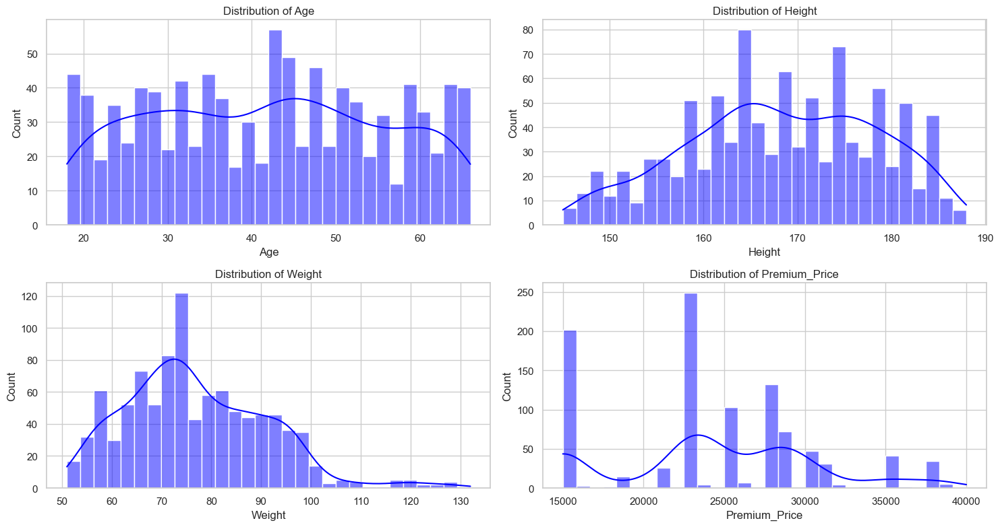

In [141]:
# Histograms for Continuous Variables

temp_cont_cols = ["Age", "Height", "Weight", "Premium_Price"]

def plot_continuous_distributions(data, cols):
    n = len(cols)
    rows = int(np.ceil(n/3))
    plt.figure(figsize=(15, 4*rows))

    for i, col in enumerate(cols, 1):
        plt.subplot(rows, 2, i)
        sns.histplot(data[col], kde=True, bins=30, color="blue")
        plt.title(f"Distribution of {col}")
    
    plt.tight_layout()
    plt.show()

plot_continuous_distributions(df, temp_cont_cols)

#### 🔎 Insights

- Age is evenly spread across adulthood, with no extreme skew, indicating balanced representation of young and older individuals.

- Height follows a near-normal spread around 168 cm.

- Weight shows right skew, reflecting a notable overweight/obese subset.

- Premium prices cluster between ₹15k–₹30k, with a few higher outliers, showing standard pricing with risk-based adjustments.

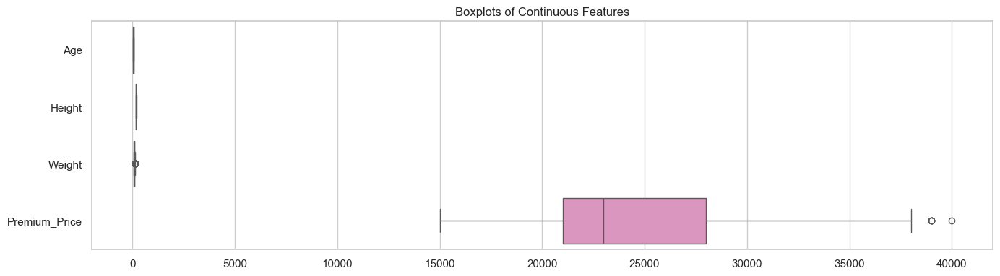

In [142]:
# Boxplot for Continuous Variables

def plot_boxplots(data, cols):
    plt.figure(figsize=(14, max(4, 0.5*len(cols))))
    sns.boxplot(data=data[cols], orient="h", palette="Set2")
    plt.title("Boxplots of Continuous Features")
    plt.tight_layout()
    plt.show()

plot_boxplots(df, temp_cont_cols)

#### 🔎 Insights

* Age, height, and weight are fairly compact with few visible outliers.

* Premium prices show a wide range, with several higher-end outliers beyond ₹35k.

* This suggests that while demographics are stable, premiums vary more due to health conditions.

* Outliers in premium highlight customers with higher risk profiles driving up costs.

### 2.2.2 - Binary Variables

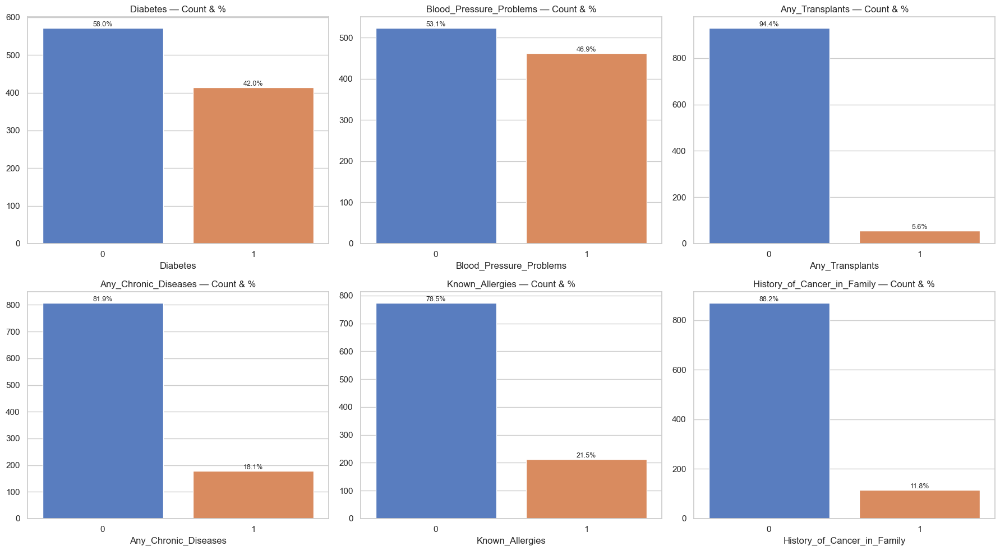

In [143]:
# Binary Variable Bar Plots

def plot_binary_distribution(data, col, ax):
    counts = data[col].value_counts().sort_index()
    pct = 100 * counts / counts.sum()

    sns.barplot(x=counts.index.astype(str), y=counts.values, palette="muted", ax=ax)
    ax.set_title(f"{col} — Count & %")
    for i, v in enumerate(counts.values):
        ax.text(i, v, f"{pct.iloc[i]:.1f}%", ha='center', va='bottom', fontsize=9)

# Create subplots grid
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through columns and axes
for i, col in enumerate(binary_cols):
    plot_binary_distribution(df, col, axes[i])

# Hide any unused subplots (if binary_cols < 6)
for j in range(len(binary_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### 🔎 Insights

* Diabetes and blood pressure problems affect a large share of the population (40–45%).

* Transplants are rare (\~6%) but critical for cost implications.

* Allergies and chronic diseases affect about 20%, while family cancer history is at 12%.

* These conditions add significant heterogeneity in health risk, influencing premium differentiation.

### 2.2.3 - Categorical Variable

In [144]:
# Barplot for Categorical Variables

# Function for Categorical Distribution
def plot_categorical_distribution(data, col, palette="muted", figsize=(7, 5)):
    counts = data[col].value_counts().sort_index()
    pct = 100 * counts / counts.sum()

    fig, ax = plt.subplots(figsize=figsize)
    sns.barplot(x=counts.index.astype(str), y=counts.values, palette=palette, ax=ax)
    ax.set_title(f"{col} — Count & %")

    for i, v in enumerate(counts.values):
        ax.text(i, v, f"{pct.iloc[i]:.1f}%", ha='center', va='bottom', fontsize=9)

    plt.show()

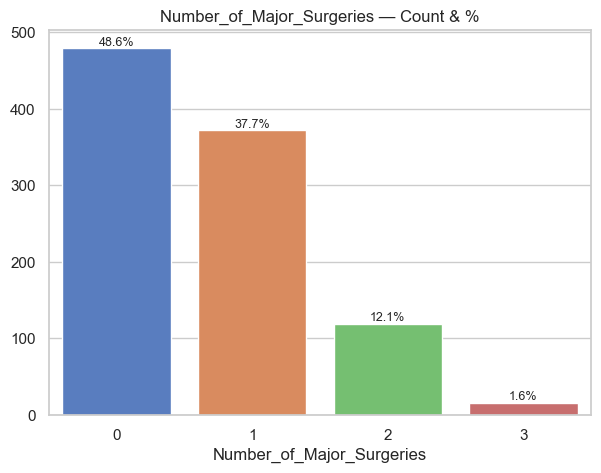

In [145]:
plot_categorical_distribution(df, "Number_of_Major_Surgeries")

#### 🔎 Insights

* Nearly half have no surgeries, and \~38% report exactly one.

* Multiple surgeries (2–3) are rare but indicate high medical risk.

* This reflects that surgeries are infrequent events but carry heavy cost weight.

* The skew suggests the variable is important for identifying high-cost outliers.

### 2.2.4 - Engineered features (BMI, Age Groups)

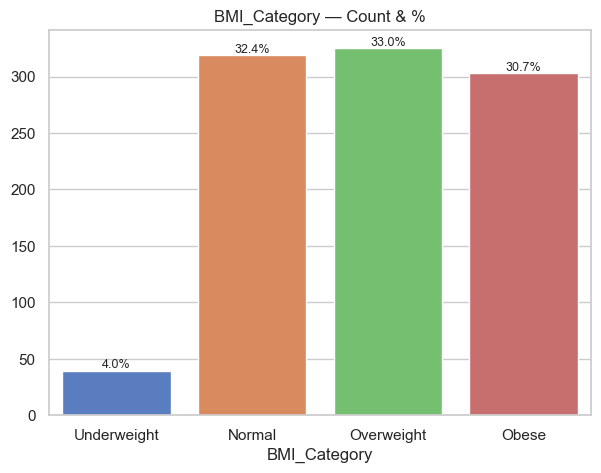

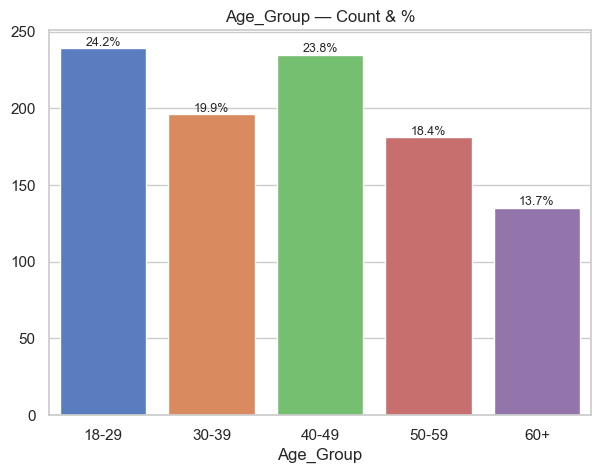

In [146]:
# Engineered Values

# ✅ BMI
df['BMI'] = df['Weight'] / ((df['Height']/100)**2)
bmi_bins = [0, 18.5, 25, 30, np.inf]
bmi_labels = ['Underweight','Normal','Overweight','Obese']
df['BMI_Category'] = pd.cut(df['BMI'], bins=bmi_bins, labels=bmi_labels, right=False)

plot_categorical_distribution(df, "BMI_Category")

# ✅ Age groups
age_bins = [18, 30, 40, 50, 60, np.inf]
age_labels = ['18-29','30-39','40-49','50-59','60+']
df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

plot_categorical_distribution(df, "Age_Group")

#### 🔎 Insights

##### BMI Categories

* Distribution is well spread, with \~32% normal, 33% overweight, and 31% obese.

* Very few fall under the underweight group (4%).

* High overweight/obesity rates suggest lifestyle-related risks are common.

* Since BMI strongly correlates with chronic diseases, it is a major premium driver.



##### Age Groups

* Largest share of insured falls in the 18–29 and 40–49 ranges (\~24% each).

* Older groups (50–59 and 60+) are smaller in count (\~32% combined).

* This suggests a balanced pool with both young, low-risk customers and older, high-risk customers.

* The age group spread ensures premiums must adjust strongly with age bands.

In [147]:
# Add BMI to Continuous Columns
cont_cols.append('BMI')

In [148]:
cont_cols

['Age',
 'Height',
 'Weight',
 'Number_of_Major_Surgeries',
 'Premium_Price',
 'BMI']

Premium Summary by Age Group


,Age_Group,count,mean,median,std
0,18-29,239,16443.51,15000.00,4509.09
1,30-39,196,24142.86,23000.00,3940.58
2,40-49,235,26638.30,25000.00,4596.66
3,50-59,181,28607.73,28000.00,3388.83
4,60+,135,28859.26,28000.00,3197.86


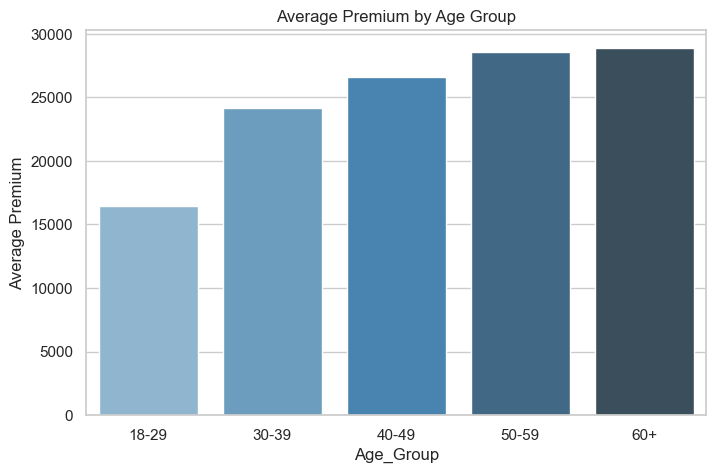

In [149]:
# Average Premium by Age Group
age_group_summary = df.groupby("Age_Group")["Premium_Price"].agg(["count", "mean", "median", "std"]).reset_index()

print("Premium Summary by Age Group")
display(age_group_summary)

# Plot
plt.figure(figsize=(8,5))
sns.barplot(x="Age_Group", y="mean", data=age_group_summary, palette="Blues_d")
plt.title("Average Premium by Age Group")
plt.ylabel("Average Premium")
plt.show()

#### 🔎 Insights

* Premiums rise steadily with age, starting from an average of \~₹16.4k in the 18–29 group to \~₹28.8k in the 60+ group.

* This shows a strong positive relationship between age and insurance cost, reflecting that older individuals are considered riskier due to higher likelihood of health issues.

* It highlights age as one of the most powerful predictors in premium estimation, making age-group-based pricing essential for accurate risk adjustment.

Premium Summary by Chronic Disease Presence


,Any_Chronic_Diseases,count,mean,median,std
0,0,808,23725.25,23000.00,6322.11
1,1,178,27112.36,28000.00,5056.60


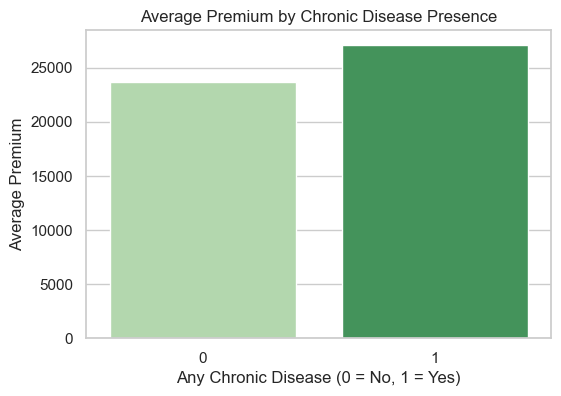

In [150]:
# Premium grouped by chronic diseases
chronic_summary = df.groupby("Any_Chronic_Diseases")["Premium_Price"].agg(["count", "mean", "median", "std"]).reset_index()

print("Premium Summary by Chronic Disease Presence")
display(chronic_summary)

# Plot
plt.figure(figsize=(6,4))
sns.barplot(x="Any_Chronic_Diseases", y="mean", data=chronic_summary, palette="Greens")
plt.title("Average Premium by Chronic Disease Presence")
plt.ylabel("Average Premium")
plt.xlabel("Any Chronic Disease (0 = No, 1 = Yes)")
plt.show()


#### 🔎 Insights

* Individuals without chronic diseases pay lower average premiums (~₹23.7k) compared to those with chronic conditions (~₹27.1k).

* This indicates that chronic illnesses significantly increase perceived health risk, leading insurers to charge higher premiums.

* It reinforces the importance of medical history in premium pricing, as chronic conditions signal sustained long-term healthcare costs.


## 2.3 - Correlation Analysis

### 2.3.1 - Crosstab of Chronic Diseases vs Cancer History (Categorical vs Categorical)

Crosstab of Chronic Diseases vs Cancer History


History_of_Cancer_in_Family,0,1,All
Any_Chronic_Diseases,,,
0,714,94,808
1,156,22,178
All,870,116,986


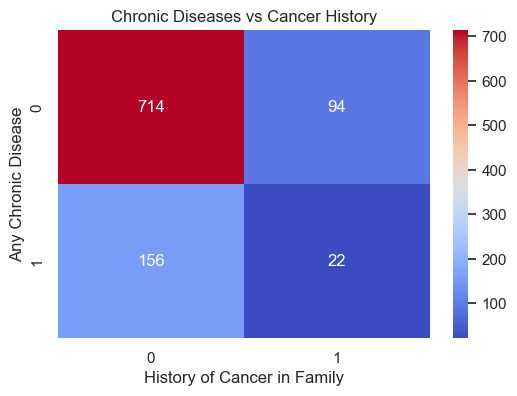

In [151]:
# Crosstab of Chronic Diseases vs Cancer History
crosstab = pd.crosstab(df["Any_Chronic_Diseases"], df["History_of_Cancer_in_Family"], margins=True)
print("Crosstab of Chronic Diseases vs Cancer History")
display(crosstab)

# Heatmap visualization
plt.figure(figsize=(6,4))
sns.heatmap(pd.crosstab(df["Any_Chronic_Diseases"], df["History_of_Cancer_in_Family"]), annot=True, cmap="coolwarm", fmt="d")
plt.title("Chronic Diseases vs Cancer History")
plt.xlabel("History of Cancer in Family")
plt.ylabel("Any Chronic Disease")
plt.show()

#### 🔎 Insights

* Most individuals with chronic diseases (156 out of 178) do not report a family cancer history, while only 22 report both risk factors together.

* This shows that chronic conditions and family cancer history are largely independent, with limited overlap in the dataset.

* From a premium perspective, the small group having both factors represents a concentrated high-risk segment that could justify significantly higher pricing adjustments.


### 2.3.2 - Correlation Heatmap (Numeric) & Correlation Ranking

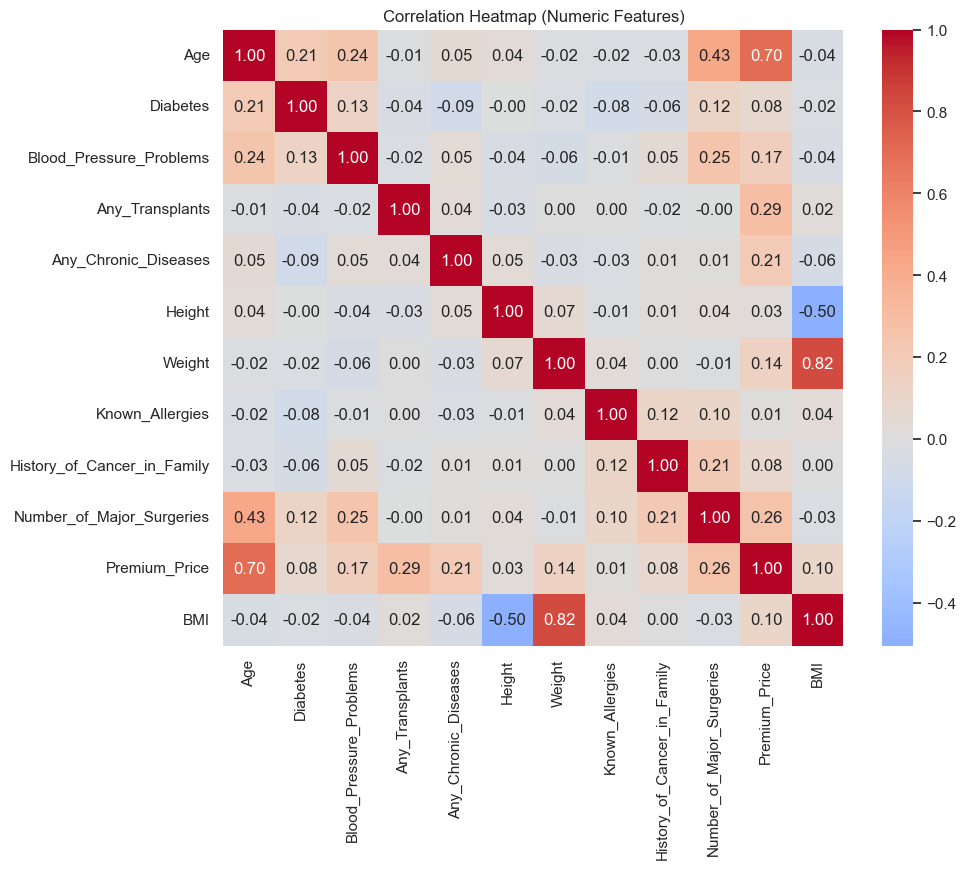

🔎 Correlation of Features with Premium_Price:


Age                           0.70
Any_Transplants               0.29
Number_of_Major_Surgeries     0.26
Any_Chronic_Diseases          0.21
Blood_Pressure_Problems       0.17
Weight                        0.14
BMI                           0.10
History_of_Cancer_in_Family   0.08
Diabetes                      0.08
Height                        0.03
Known_Allergies               0.01
Name: Premium_Price, dtype: float64

In [152]:
# Heatmap of Correlation

def plot_corr_heatmap(data, target=TARGET):
    corr = data.corr(numeric_only=True)
    
    plt.figure(figsize=(10,8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0)
    plt.title("Correlation Heatmap (Numeric Features)")
    plt.show()
    
    # Sort features by correlation with target
    target_corr = corr[target].drop(target).sort_values(ascending=False)
    print("🔎 Correlation of Features with Premium_Price:")
    display(target_corr)

plot_corr_heatmap(df)

#### 🔎 Insights

* Age shows the strongest correlation with premium (0.70), confirming it as the dominant driver of insurance pricing.

* Medical risk factors such as transplants (0.29), number of surgeries (0.26), and chronic diseases (0.21) also have notable positive relationships, indicating higher health burdens push premiums upward.

* Lifestyle and genetic indicators like weight, BMI, blood pressure, and family cancer history show weaker correlations, but still contribute incremental risk signals.

* Allergies and height have almost no impact, suggesting they are not meaningful for premium prediction.

### 2.3.2 - Scatter Plots for Top Variables

In [153]:
cont_cols

['Age',
 'Height',
 'Weight',
 'Number_of_Major_Surgeries',
 'Premium_Price',
 'BMI']

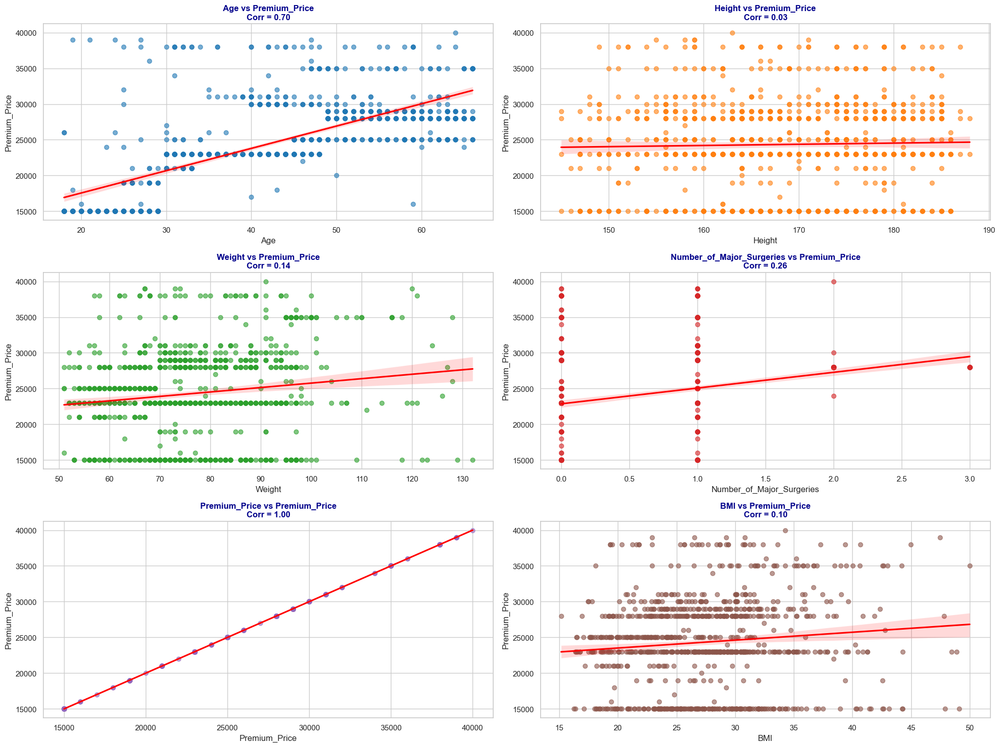

In [154]:
# Premium vs Continuous Features (Scatterplots + Correlation Annotations)

# Custom Colors
Colors_Palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# ---- Continuous Features ----
# cont_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries']

# Plot regression scatter plots with CI
plt.figure(figsize=(20, 15))

for idx, col in enumerate(cont_cols, 1):
    plt.subplot(3, 2, idx)
    sns.regplot(
        x=df[col],
        y=df['Premium_Price'],
        color=Colors_Palette[idx-1],
        scatter_kws={'alpha':0.6, 's':40},  # show all points clearly
        line_kws={'color':'red'}, ci=95
    )

    # --- Correlation Annotation ---
    corr = df[col].corr(df['Premium_Price'])
    plt.title(f"{col} vs Premium_Price\nCorr = {corr:.2f}", fontsize=12, fontweight="bold", color="darkblue")

plt.tight_layout()
plt.show()

#### 🔎 Insights

* Scatter plots show that Age has the strongest positive correlation with Premium Price.

  * Premiums steadily rise with age, highlighting its dominant role in pricing.
  * This aligns with insurers’ risk assessment, as older individuals typically face higher health risks.

* Height, Weight, and BMI display only weak relationships with Premium Price.

  * These attributes add minor variability but are not strong standalone predictors.
  * Their effect is overshadowed by direct medical risk indicators.

* The Number of Major Surgeries shows a moderate upward trend with Premium Price.

  * Customers with more surgeries generally face higher premiums.
  * This reinforces the importance of medical history in driving costs.

**Overall, Age and medical history are the strongest predictors of premiums, while body metrics contribute only marginally.**

### 2.3.3 - Boxplot for Top Variables

In [155]:
binary_cols

['Diabetes',
 'Blood_Pressure_Problems',
 'Any_Transplants',
 'Any_Chronic_Diseases',
 'Known_Allergies',
 'History_of_Cancer_in_Family']

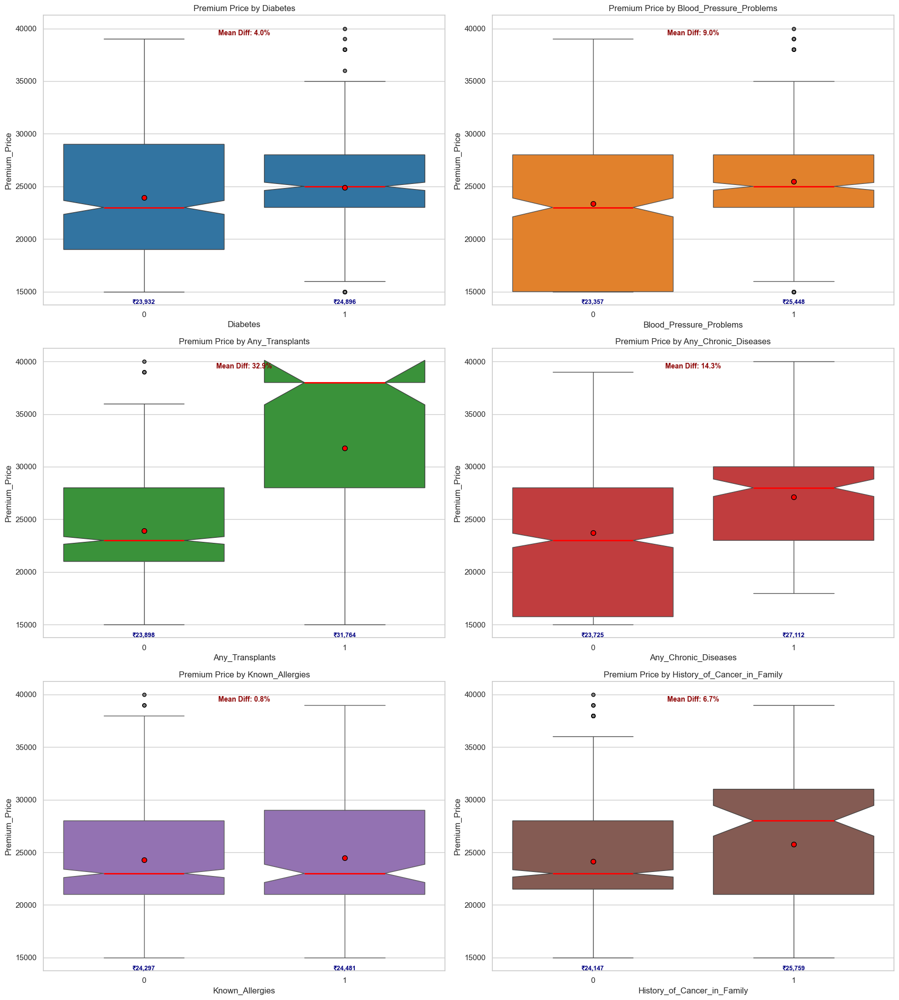

In [156]:
# Premium vs Binary Features (Boxplots + % Difference)

# Custom Colors
Colors_Palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Boxplots for Binary Features vs Premium Price
plt.figure(figsize=(18, 20))

for idx, col in enumerate(binary_cols, 1):
    plt.subplot(3, 2, idx)
    sns.boxplot(
        x=df[col],
        y=df['Premium_Price'],
        color=Colors_Palette[idx-1],
        notch=True,
        showmeans=True,
        meanprops={'marker': 'o','markerfacecolor': 'red',
                   'markeredgecolor': 'black','markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o','markersize': 5,
                    'markerfacecolor': 'gray','markeredgecolor': 'black'}
    )

    # calculate means for both groups
    means = df.groupby(col)['Premium_Price'].mean()
    if len(means) == 2:  
        diff_pct = ((means[1] - means[0]) / means[0]) * 100

        # annotate percentage difference at the top
        plt.text(
            0.5, max(df['Premium_Price']) * 0.98,
            f"Mean Diff: {diff_pct:.1f}%",
            ha='center', va='bottom', fontsize=10, color='darkred', weight='bold'
        )

        # annotate actual mean values under each box
        for x_pos, val in enumerate(means):
            plt.text(
                x_pos, df['Premium_Price'].min() * 0.95,
                f"₹{val:,.0f}",  # formatted with commas
                ha='center', va='top', fontsize=9, color='navy', weight='bold'
            )

    plt.title(f"Premium Price by {col}", fontsize=12)

plt.tight_layout()
plt.show()

#### 🔎 Insights

* Health conditions such as **Diabetes, Blood Pressure Problems, Allergies, and Cancer History** show only modest differences in premium prices (4–9%).

  * These conditions raise premiums slightly but do not drastically alter pricing.
  * This indicates they are considered moderate risk factors in premium calculation.

* **Chronic Diseases** lead to a much higher premium impact (\~14.3%).

  * Customers with chronic illnesses consistently face elevated costs.
  * This reflects insurers’ recognition of ongoing medical expenses and higher long-term risks.

* **Organ Transplants** stand out with the largest effect (\~32%).

  * Premiums are significantly higher for customers with transplant history.
  * This condition represents a critical health risk, strongly influencing pricing decisions.

**Overall, severe and long-term health risks such as transplants and chronic diseases drive the largest premium differences, while moderate conditions show only incremental effects.**

### 2.3.4 - Pairplots for Top Variables

Generating Pairplot for: Diabetes...


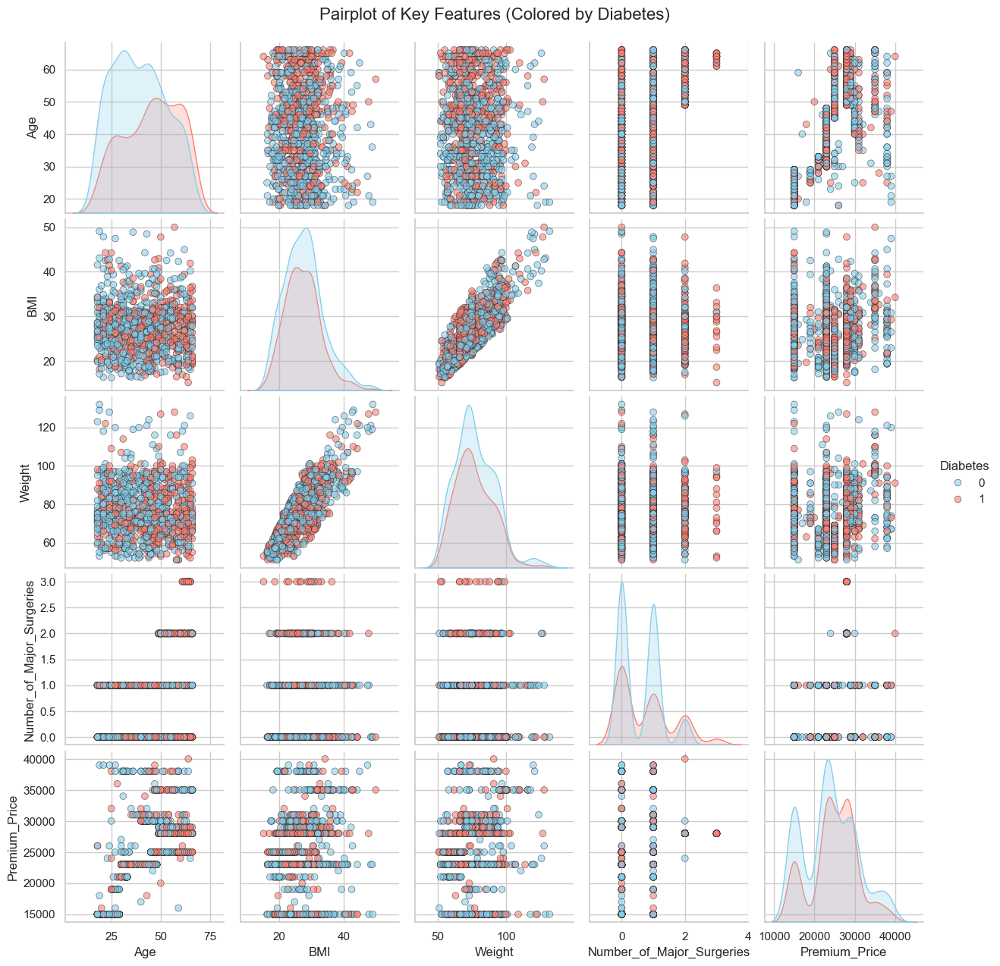

Generating Pairplot for: Blood_Pressure_Problems...


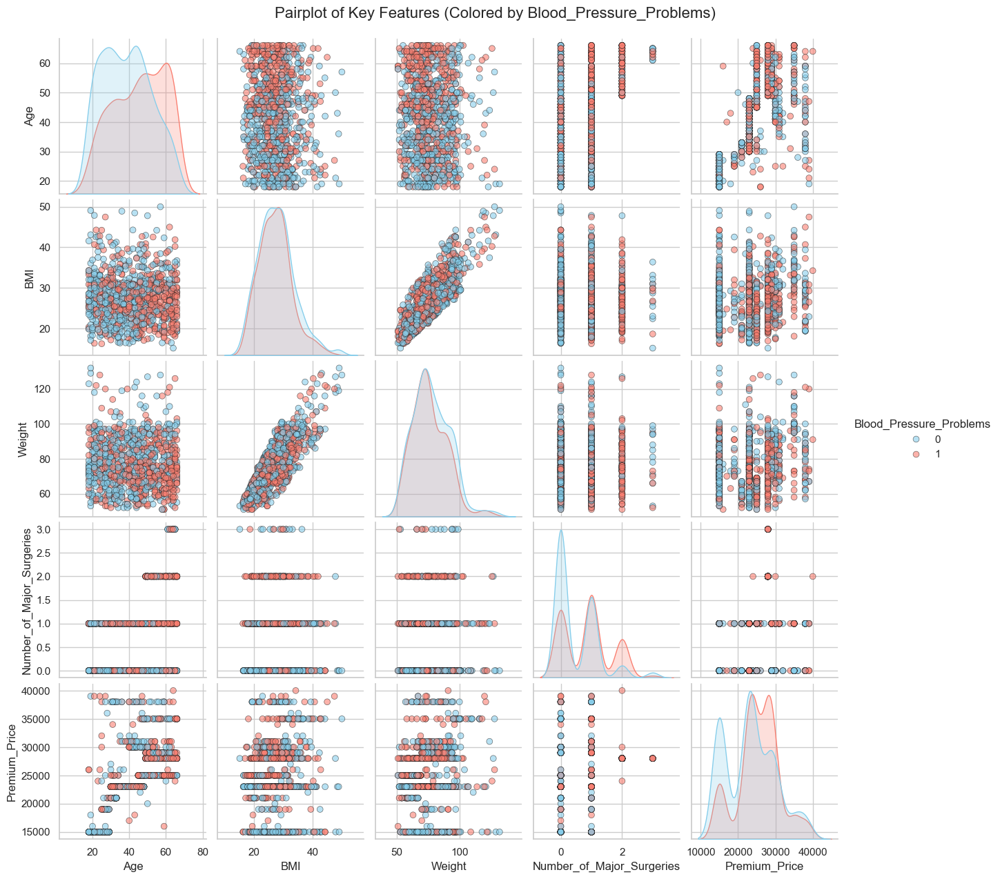

Generating Pairplot for: Any_Transplants...


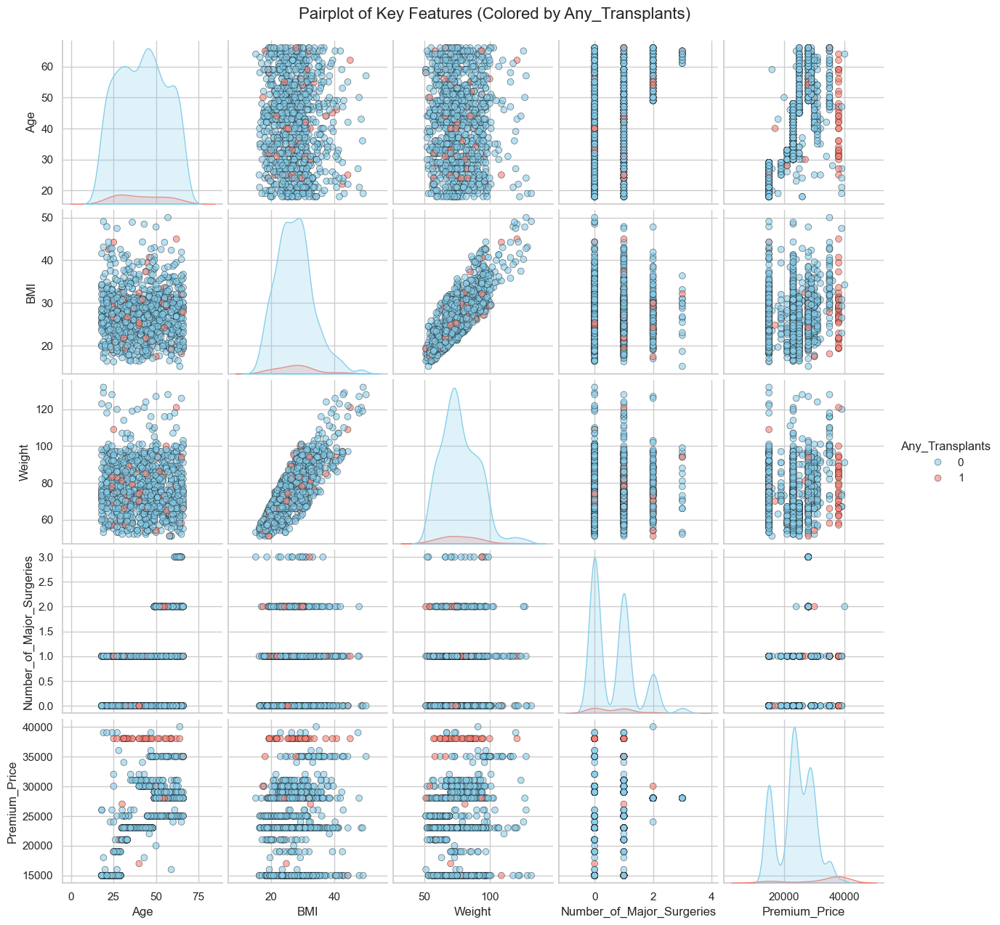

Generating Pairplot for: Any_Chronic_Diseases...


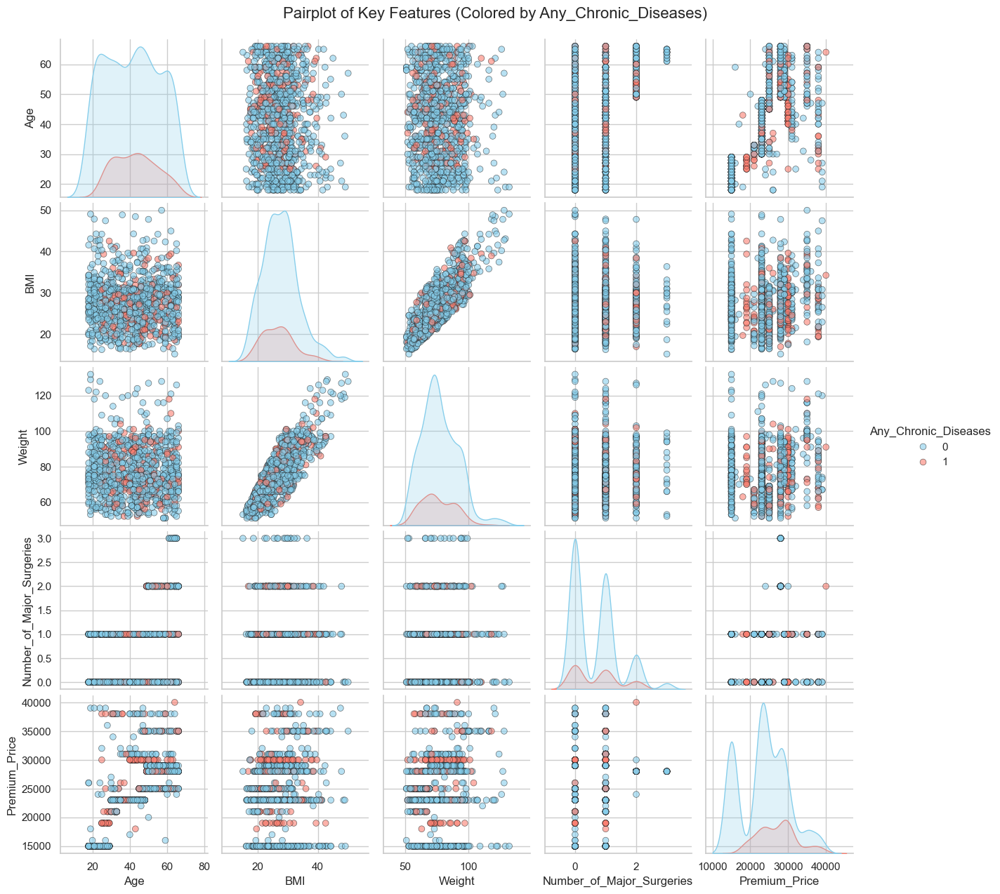

Generating Pairplot for: Known_Allergies...


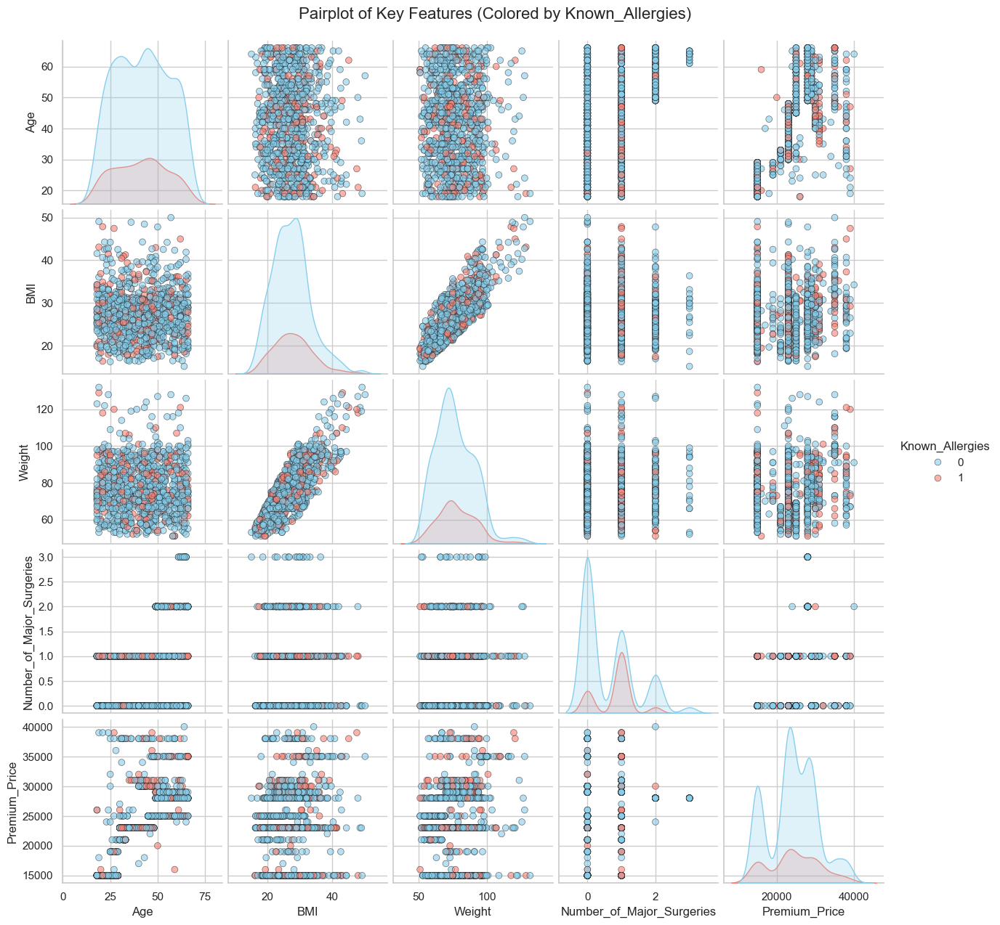

Generating Pairplot for: History_of_Cancer_in_Family...


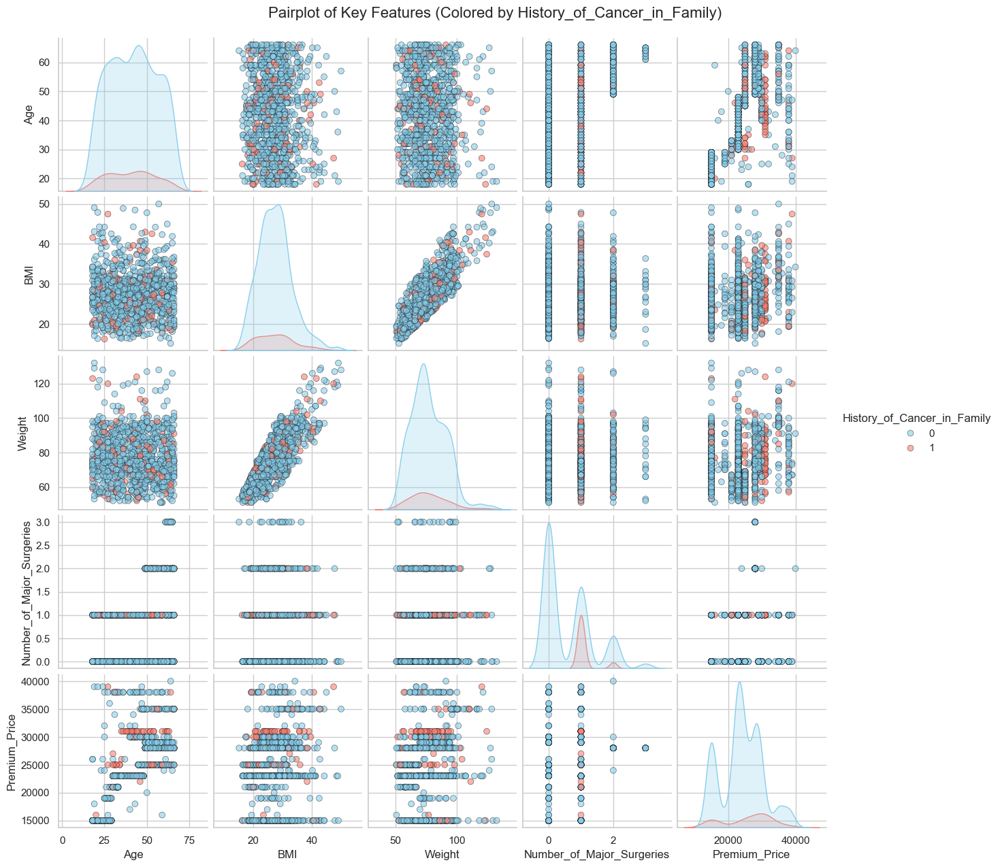

In [157]:
# Pairplots for Key Features (with all binary columns)

# numeric features for pairplot
pairplot_cols = ['Age', 'BMI', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

# binary columns (all except Premium_Price, Age, Height, Weight, BMI, Surgeries)
binary_cols = ['Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
               'Any_Chronic_Diseases', 'Known_Allergies', 'History_of_Cancer_in_Family']

def save_pairplots(df, num_cols, bin_cols, save_path="pairplots"):
    import os
    os.makedirs(save_path, exist_ok=True)  # create folder if not exists

    for col in bin_cols:
        print(f"Generating Pairplot for: {col}...")

        g = sns.pairplot(
            df[num_cols + [col]],
            hue=col,
            diag_kind="kde",
            palette={0: "skyblue", 1: "salmon"},
            plot_kws={'alpha':0.6, 's':40, 'edgecolor':'k'}
        )

        g.fig.suptitle(f"Pairplot of Key Features (Colored by {col})", y=1.02, fontsize=16)

        # save plot
        filename = f"{save_path}/pairplot_{col}.png"
        g.savefig(filename, dpi=150, bbox_inches='tight')
        plt.show()  # also display inline
        plt.close()

# Run the function
save_pairplots(df, pairplot_cols, binary_cols)


#### 🔎 Insights

* Individuals with diabetes show slightly higher BMI and weight clustering compared to non-diabetics.

  * This suggests a link between metabolic risk factors and diabetes occurrence.
  * Higher BMI-driven health risks can increase premium pricing, requiring insurers to account for obesity-related conditions.

* Blood pressure problems are more common in older age groups, but BMI and weight overlap heavily across both groups.

  * This indicates that age is a stronger differentiator than body composition for hypertension.
  * Premium adjustments for blood pressure should emphasize age-related risk rather than BMI alone.

* Transplants are rare but associated with very high premium clusters regardless of age or weight.

  * This highlights that the medical event itself, rather than lifestyle factors, drives premium costs.
  * Models should treat transplant history as a categorical high-risk driver, even if sample frequency is low.

* Chronic diseases are spread across all age groups but tend to align with higher premium bands.

  * This indicates a broad impact on insurance pricing irrespective of BMI or weight.
  * Chronic disease indicators should be prioritized as consistent premium escalators.

* Known allergies show minimal separation across age, BMI, or premium bands.

  * This suggests allergies alone may not significantly alter health risk or pricing.
  * They may only add predictive value when combined with other comorbidities.

* Family history of cancer shows moderate overlap with higher premiums but without strong clustering by BMI or weight.

  * This reflects genetic risk being independent of lifestyle variables.
  * Insurers may use family history as an additive but not dominant pricing factor.

---

**Overall, major health events like transplants and chronic diseases are the most consistent premium escalators, while lifestyle risks (BMI, weight) primarily act as amplifiers for diabetes and hypertension.**

## 2.4 - Outlier Analysis

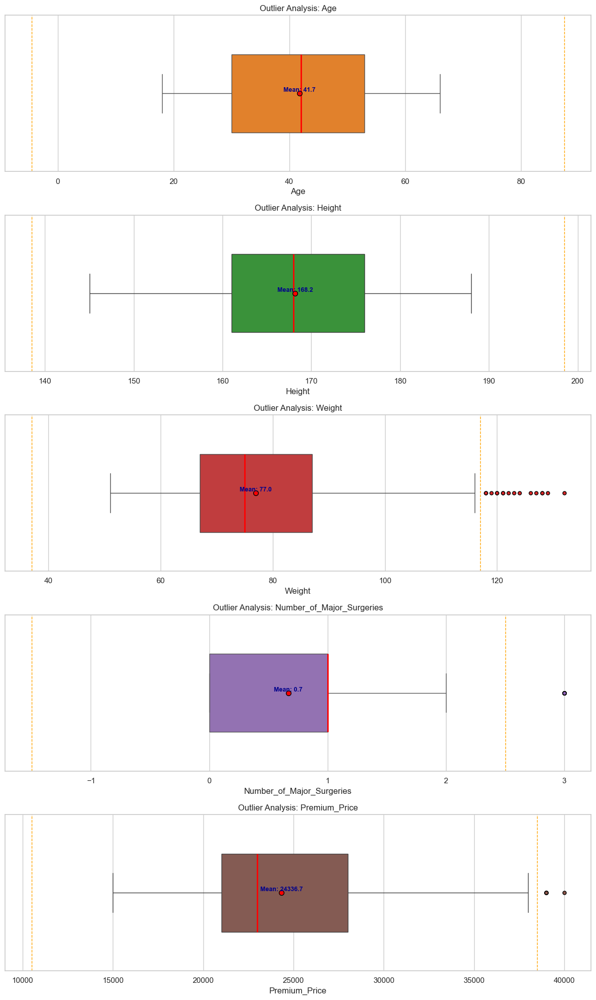

,Lower Bound,Mean Value,Upper Bound,Outlier Count
Age,-4.50,41.75,87.50,0.00
Height,138.50,168.18,198.50,0.00
Weight,37.00,76.95,117.00,16.00
Number_of_Major_Surgeries,-1.50,0.67,2.50,16.00
Premium_Price,10500.00,24336.71,38500.00,6.00


In [158]:
# Outlier Analysis

# Continuous variables
cont_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

# Custom Colors
Colors_Palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Dictionary to store outlier counts
outlier_summary = {}

plt.figure(figsize=(12, 4*len(cont_cols)))  # one row per boxplot

for i, col in enumerate(cont_cols, 1):
    plt.subplot(len(cont_cols), 1, i)
    plt.title(f"Outlier Analysis: {col}", fontsize=12)

    # Boxplot (horizontal)
    sns.boxplot(
        data=df,
        x=col,
        color=Colors_Palette[i % len(Colors_Palette)],
        width=0.5,
        fliersize=5,
        #notch=True,
        showcaps=True,
        linewidth=1,
        showmeans=True,
        meanprops={'marker': 'o',
                   'markerfacecolor': 'red',
                   'markeredgecolor': 'black',
                   'markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o',
                    'markersize': 5,
                    'markerfacecolor': Colors_Palette[i % len(Colors_Palette)],
                    'markeredgecolor': 'black',
                    "linewidth": 1.5}
    )
    
    # --- Add Mean Value Annotation ---
    mean_val = df[col].mean()
    plt.text(mean_val, 0, f"Mean: {mean_val:.1f}", ha='center', va='bottom',
             fontsize=9, fontweight="bold", color="darkblue")

    # --- Outlier Detection ---
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound, upper_bound = Q1 - 1.5*IQR, Q3 + 1.5*IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
    outlier_summary[col] = {
        "Lower Bound": lower_bound,
        "Mean Value": mean_val,
        "Upper Bound": upper_bound,
        "Outlier Count": outliers.shape[0]
    }

    # Add IQR lines
    plt.axvline(lower_bound, color="orange", linestyle="--", lw=1)
    plt.axvline(upper_bound, color="orange", linestyle="--", lw=1)

plt.tight_layout()
plt.show()

# Convert outlier summary into a nice DataFrame
outlier_df = pd.DataFrame(outlier_summary).T
display(outlier_df)


#### 🔎 Insights

* Age and height show no outliers, indicating a clean and consistent distribution across the dataset.

* Weight has 16 outliers above the upper bound, suggesting a subset of individuals with significantly higher body mass, potentially reflecting obesity risks.

* Number of major surgeries also has 16 outliers, highlighting a small group with unusually high surgical history, which signals elevated health risks.

* Premium price has 6 outliers above ₹38.5k, representing customers with extreme risk profiles where insurers impose substantially higher charges.


## 2.5 - Z-Score & IQR

In [159]:
# --- Z-Score Method ---
def z_score_outliers(df, vars, threshold=3, min_percent=5):
    results = {}
    for var in vars:
        if var in df.columns:
            mean = df[var].mean()
            std_dev = df[var].std()
            z_scores = np.abs(stats.zscore(df[var]))
            outliers = len(df[z_scores > threshold])
            total = len(df[var])
            percent_outliers = (outliers / total) * 100
            
            value_at_z_plus = mean + threshold * std_dev
            value_at_z_minus = mean - threshold * std_dev
            
            verdict = "Remove" if percent_outliers >= min_percent else "Keep"
            
            results[var] = {
                "Method": "Z-Score",
                "Lower Threshold": round(value_at_z_minus, 2),
                "Upper Threshold": round(value_at_z_plus, 2),
                "Outliers": outliers,
                "Percent Outliers": round(percent_outliers, 2),
                "Verdict": verdict
            }
    return pd.DataFrame(results).T


# --- IQR Method ---
def iqr_outliers(df, vars, min_percent=5):
    results = {}
    for var in vars:
        if var in df.columns:
            Q1 = df[var].quantile(0.25)
            Q3 = df[var].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            outliers = len(df[(df[var] < lower_bound) | (df[var] > upper_bound)])
            total = len(df[var])
            percent_outliers = (outliers / total) * 100
            
            verdict = "Remove" if percent_outliers >= min_percent else "Keep"
            
            results[var] = {
                "Method": "IQR",
                "Lower Threshold": round(lower_bound, 2),
                "Upper Threshold": round(upper_bound, 2),
                "Outliers": outliers,
                "Percent Outliers": round(percent_outliers, 2),
                "Verdict": verdict
            }
    return pd.DataFrame(results).T


# --- Example Usage ---
num_vars = ["Age", "BMI", "Weight", "Height", "Premium_Price"]  # update with your numeric cols
z_results = z_score_outliers(df, num_vars, threshold=3, min_percent=5)
iqr_results = iqr_outliers(df, num_vars, min_percent=5)

print("🔹 Z-Score Outlier Report")
display(z_results)

print("\n🔹 IQR Outlier Report")
display(iqr_results)


🔹 Z-Score Outlier Report


,Method,Lower Threshold,Upper Threshold,Outliers,Percent Outliers,Verdict
Age,Z-Score,-0.14,83.64,0,0.00,Keep
BMI,Z-Score,9.82,45.10,7,0.71,Keep
Weight,Z-Score,34.16,119.75,13,1.32,Keep
Height,Z-Score,137.89,198.48,0,0.00,Keep
Premium_Price,Z-Score,5592.16,43081.27,0,0.00,Keep



🔹 IQR Outlier Report


,Method,Lower Threshold,Upper Threshold,Outliers,Percent Outliers,Verdict
Age,IQR,-4.50,87.50,0,0.00,Keep
BMI,IQR,12.34,41.81,22,2.23,Keep
Weight,IQR,37.00,117.00,16,1.62,Keep
Height,IQR,138.50,198.50,0,0.00,Keep
Premium_Price,IQR,10500.00,38500.00,6,0.61,Keep


#### 🔎 Insights

* Both methods agree that age and height are clean with no significant outliers, showing stable distributions.

* Weight and BMI emerge as the main sources of outliers, with IQR detecting more (22 BMI vs 7 in Z-Score), suggesting sensitivity to heavier tails in BMI distribution.

* Premium price shows a few high-end outliers (6 via IQR) but none flagged by Z-Score, indicating extreme premiums are still within statistical bounds when using standard deviation–based thresholds.

* Overall, the dataset has a very low percentage of outliers (<3%), all retained for modeling since they represent meaningful high-risk individuals rather than data errors.


In [160]:
# --- Function to detect outliers using both methods ---
def outlier_summary(df, vars, z_threshold=3, min_percent=5):
    results = []
    
    for var in vars:
        if var in df.columns:
            total = len(df[var])
            
            # --- Z-Score Method ---
            mean = df[var].mean()
            std_dev = df[var].std()
            z_scores = np.abs(stats.zscore(df[var]))
            z_outliers = len(df[z_scores > z_threshold])
            z_percent = (z_outliers / total) * 100
            z_lower = mean - z_threshold * std_dev
            z_upper = mean + z_threshold * std_dev
            z_verdict = "Remove" if z_percent >= min_percent else "Keep"
            
            # --- IQR Method ---
            Q1 = df[var].quantile(0.25)
            Q3 = df[var].quantile(0.75)
            IQR = Q3 - Q1
            iqr_lower = Q1 - 1.5 * IQR
            iqr_upper = Q3 + 1.5 * IQR
            iqr_outliers = len(df[(df[var] < iqr_lower) | (df[var] > iqr_upper)])
            iqr_percent = (iqr_outliers / total) * 100
            iqr_verdict = "Remove" if iqr_percent >= min_percent else "Keep"
            
            results.append({
                "Variable": var,
                "Z_Lower": round(z_lower, 2),
                "Z_Upper": round(z_upper, 2),
                "Z_Outliers": z_outliers,
                "Z_%": round(z_percent, 2),
                "Z_Verdict": z_verdict,
                "IQR_Lower": round(iqr_lower, 2),
                "IQR_Upper": round(iqr_upper, 2),
                "IQR_Outliers": iqr_outliers,
                "IQR_%": round(iqr_percent, 2),
                "IQR_Verdict": iqr_verdict
            })
    
    return pd.DataFrame(results)


# --- Example Usage ---
num_vars = ["Age", "BMI", "Weight", "Height", "Premium_Price"]  # update with your numeric cols
outlier_report = outlier_summary(df, num_vars, z_threshold=3, min_percent=5)

print("📊 Combined Outlier Report")
display(outlier_report)


📊 Combined Outlier Report


,Variable,Z_Lower,Z_Upper,Z_Outliers,Z_%,Z_Verdict,IQR_Lower,IQR_Upper,IQR_Outliers,IQR_%,IQR_Verdict
0,Age,-0.14,83.64,0,0.00,Keep,-4.50,87.50,0,0.00,Keep
1,BMI,9.82,45.10,7,0.71,Keep,12.34,41.81,22,2.23,Keep
2,Weight,34.16,119.75,13,1.32,Keep,37.00,117.00,16,1.62,Keep
3,Height,137.89,198.48,0,0.00,Keep,138.50,198.50,0,0.00,Keep
4,Premium_Price,5592.16,43081.27,0,0.00,Keep,10500.00,38500.00,6,0.61,Keep


# 3. Hypothesis Testing

### Hypothesis Testing Framework

***Step - 1:*** Define Hypotheses

- `Null Hypothesis (H0)`: The feature has NO SIGNIFICANT effect on Premium_Price.

- `Alternate Hypothesis (Ha)`: The feature DOES AFFECT Premium_Price.


📌 Examples:

- **For binary features** (e.g., `Diabetes`):


    - H0: Premiums are the same for people with/without diabetes.

    - Ha: Premiums differ for people with/without diabetes.


- **For categorical features** (e.g., `Number_of_Surgeries`):


    - H0: Average premium is the same across all surgery groups.

    - Ha: At least one group differs significantly.


- **For numerical features** (e.g., `Age`, `BMI`):

    - H0: No correlation between the feature and Premium.

    - Ha: A significant correlation exists.



***Step - 2:*** Check Assumptions

- **Normality**: Use Shapiro-Wilk Test and `Q-Q plots` to test if data is normally distributed.

- **Homogeneity of Variances** (for group comparisons): Use `Levene’s Test`.



***Step - 3:*** Choose Appropriate Test Statistic

- **Binary Features:**


    - If normal + equal variance → `Independent T-test`

    - If normal + unequal variance → `Welch’s T-test`

    - If not normal → `Mann–Whitney U test`


- **Categorical Features (3+ groups):**

    - If normal + equal variance → `ANOVA`

    - If normal + unequal variance → `Welch’s ANOVA (approx.)`

    - If not normal → `Kruskal–Wallis Test`


- **Numerical Features (continuous):**

    - If normal → `Pearson Correlation`

    - If not normal → `Spearman Rank Correlation`



***Step - 4:*** Set `Significance Level (α)`

- Chosen as 0.05.

    - If `p-value < α` → Reject NULL **(Feature Significantly Impacts Premium)**.

    - If `p-value ≥ α` → Fail to Reject NULL **(No Significant Effect)**.



***Step - 5:*** Decision & Interpretation

- Summarize results in a decision table with:

- Feature testedH0

- Test used

- Test statistic value

- p-value

- Final decision (Reject/Fail to Reject NULL)

- Notes (e.g., “Normality failed → Used Mann–Whitney U test”).


In [161]:
results_summary = []   # global list to collect results

## 3.1 - Binary Features (0/1 variables)

In [162]:
def binary_hypothesis(data, feature, target="Premium_Price"):
    
    print(f"\n{'='*60}\nFeature: {feature} vs {target}\n{'='*60}")
    print(f"H0: {feature} has no significant effect on {target}")
    print(f"Ha: {feature} DOES have a significant effect on {target}\n")

    group0 = data[data[feature]==0][target]
    group1 = data[data[feature]==1][target]

    # --- Boxplot ---
    plt.figure(figsize=(6,4))
    sns.boxplot(x=feature, y=target, data=data, palette="Set3")
    plt.title(f"{target} by {feature}")
    plt.show()

    # --- Histogram + Q-Q Plots ---
    fig, axes = plt.subplots(2, 2, figsize=(10,6))
    sns.histplot(group0, kde=True, ax=axes[0,0], color="skyblue")
    axes[0,0].set_title(f"Histogram: {feature}=0")
    sm.qqplot(group0, line='s', ax=axes[0,1])
    axes[0,1].set_title(f"Q-Q Plot: {feature}=0")
    sns.histplot(group1, kde=True, ax=axes[1,0], color="salmon")
    axes[1,0].set_title(f"Histogram: {feature}=1")
    sm.qqplot(group1, line='s', ax=axes[1,1])
    axes[1,1].set_title(f"Q-Q Plot: {feature}=1")
    plt.tight_layout()
    plt.show()

    # --- Shapiro-Wilk Test ---
    stat0, p0 = stats.shapiro(group0)
    stat1, p1 = stats.shapiro(group1)
    print(f"Shapiro Test -> {feature}=0: stat={stat0:.3f}, p={p0:.5f}")
    print(f"Shapiro Test -> {feature}=1: stat={stat1:.3f}, p={p1:.5f}")

    normality = (p0 > 0.05) and (p1 > 0.05)
    if not normality:
        print("❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.\n")
    else:
        print("✅ Normality assumption holds for both groups.\n")

    # --- Levene’s Test for Equal Variances ---
    lev_stat, lev_p = stats.levene(group0, group1)
    print(f"Levene’s Test: stat={lev_stat:.3f}, p={lev_p:.5f}")
    equal_var = lev_p > 0.05
    if normality:
        if equal_var:
            print("✅ Variances are equal. Will use Independent T-test.\n")
        else:
            print("❌ Variances unequal. Will use Welch’s T-test.\n")

    # --- Hypothesis Test Selection ---
    if normality:  # Normal distribution
        if equal_var:
            test_name = "Independent T-test"
            test_stat, test_p = stats.ttest_ind(group0, group1, equal_var=True)
            notes = "Independent T-test used (assumptions satisfied)"
        else:
            test_name = "Welch’s T-test"
            test_stat, test_p = stats.ttest_ind(group0, group1, equal_var=False)
            notes = "Welch’s T-test used (variance unequal)"
    else:  # Non-parametric fallback
        test_name = "Mann–Whitney U Test"
        test_stat, test_p = stats.mannwhitneyu(group0, group1, alternative='two-sided')
        notes = "Mann–Whitney U Test used (normality failed)"

    # --- Results ---
    print(f"{test_name} → stat={test_stat:.3f}, p={test_p:.5f}")
    alpha = 0.05
    if test_p < alpha:
        print(f"✅ Reject H0 → {feature} significantly affects {target}.")
    else:
        print(f"❌ Fail to Reject H0 → No significant effect of {feature} on {target}.")

    # --- Decision ---
    decision = "Reject H0" if test_p < alpha else "Fail to Reject H0"

    results_summary.append({
        "Feature": feature,
        "Target": target,
        "Test": test_name,
        "Stat Value": round(test_stat, 3),
        "p-value": round(test_p, 5),
        "Decision": decision,
        "Notes": notes
    })


### 3.1.1 - Diabetes


Feature: Diabetes vs Premium_Price
H0: Diabetes has no significant effect on Premium_Price
Ha: Diabetes DOES have a significant effect on Premium_Price



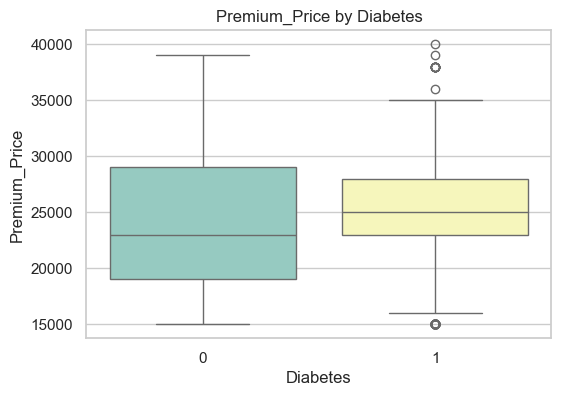

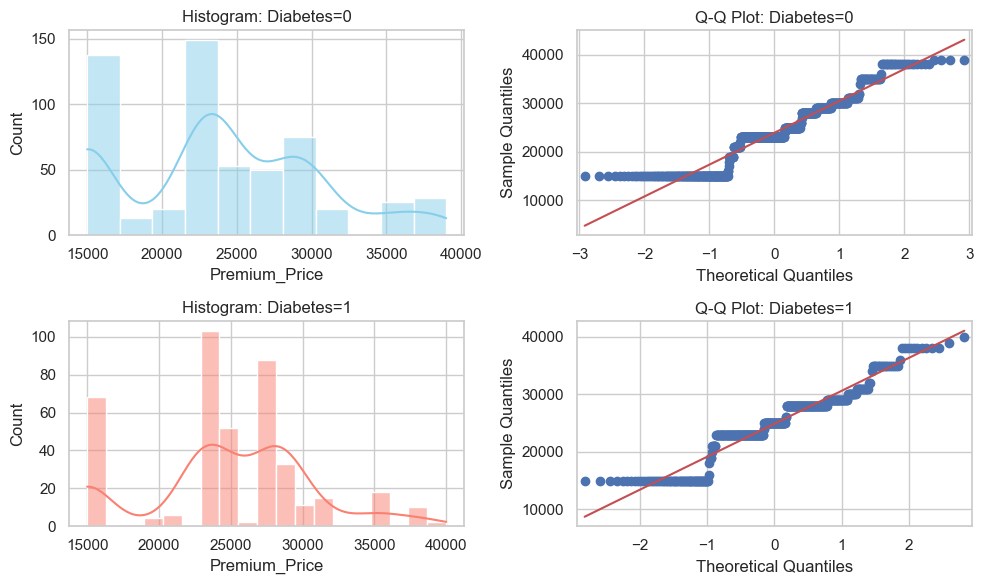

Shapiro Test -> Diabetes=0: stat=0.921, p=0.00000
Shapiro Test -> Diabetes=1: stat=0.923, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=7.033, p=0.00813
Mann–Whitney U Test → stat=106563.500, p=0.00648
✅ Reject H0 → Diabetes significantly affects Premium_Price.


In [163]:
binary_hypothesis(df, "Diabetes")

#### 🔎 Insights


* The Shapiro test gave p = 0.000 for both groups, showing premium prices are not normally distributed.

    * This means the data has skewness and outliers, making standard parametric tests unsuitable.

    * For premium prediction, models must account for non-normal distributions to avoid biased estimates.

* Levene’s test showed p = 0.008, meaning variances differ significantly between diabetic and non-diabetic groups.

    * This suggests diabetic customers have more variability in premium costs, reflecting diverse health risk levels.

    * For pricing, this highlights the need for flexible models that capture risk variability among diabetics.

* The Mann–Whitney U test gave p = 0.006, confirming a significant difference in premiums between the two groups.

    * This indicates diabetes status directly influences premium pricing, with diabetics generally paying higher premiums.

    * For prediction, diabetes should be treated as a strong driver of insurance costs and prioritized in feature selection.

**Overall, diabetes is confirmed as a statistically significant driver of insurance premium variation.**

### 3.1.2 - Blood Pressure Problems


Feature: Blood_Pressure_Problems vs Premium_Price
H0: Blood_Pressure_Problems has no significant effect on Premium_Price
Ha: Blood_Pressure_Problems DOES have a significant effect on Premium_Price



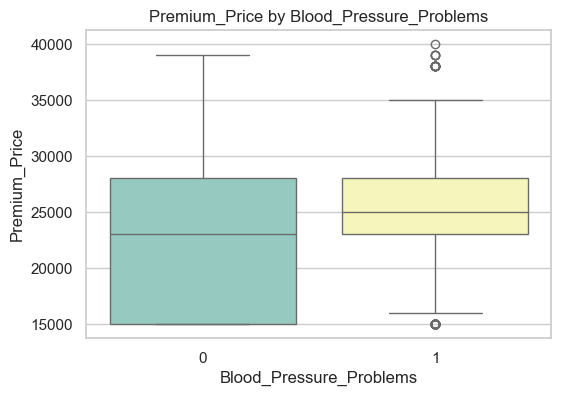

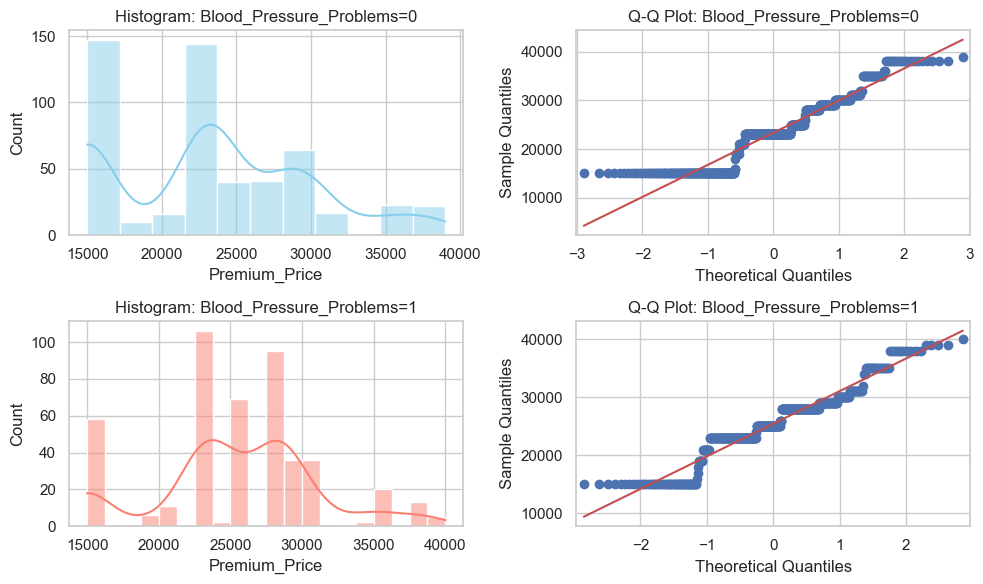

Shapiro Test -> Blood_Pressure_Problems=0: stat=0.906, p=0.00000
Shapiro Test -> Blood_Pressure_Problems=1: stat=0.935, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=10.948, p=0.00097
Mann–Whitney U Test → stat=96697.000, p=0.00000
✅ Reject H0 → Blood_Pressure_Problems significantly affects Premium_Price.


In [164]:
binary_hypothesis(df, "Blood_Pressure_Problems")

#### 🔎 Insights


* The Shapiro test gave p = 0.000 for both groups, showing premium prices are not normally distributed.

  * This indicates skewness and outliers, making normality-based statistical tests inappropriate.
  * For premium prediction, models should handle skewed distributions to avoid biased results.

* Levene’s test showed p = 0.00097, meaning there is a significant difference in variance between groups.

  * Customers with blood pressure problems display higher variability in premium costs compared to those without.
  * For insurers, this signals uncertainty in pricing and the need to model risk variability accurately.

* The Mann–Whitney U test gave p = 0.000, confirming a significant difference in premiums between customers with and without blood pressure problems.

  * This means blood pressure problems strongly influence premium levels, with affected customers paying higher premiums.
  * For prediction, blood pressure status should be treated as a key health-risk feature driving cost differences.

**Overall, blood pressure problems are a statistically significant driver of insurance premium variation.**

### 3.1.3 - Any Transplants


Feature: Any_Transplants vs Premium_Price
H0: Any_Transplants has no significant effect on Premium_Price
Ha: Any_Transplants DOES have a significant effect on Premium_Price



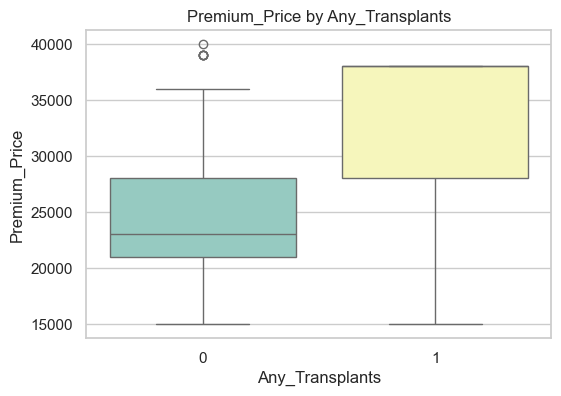

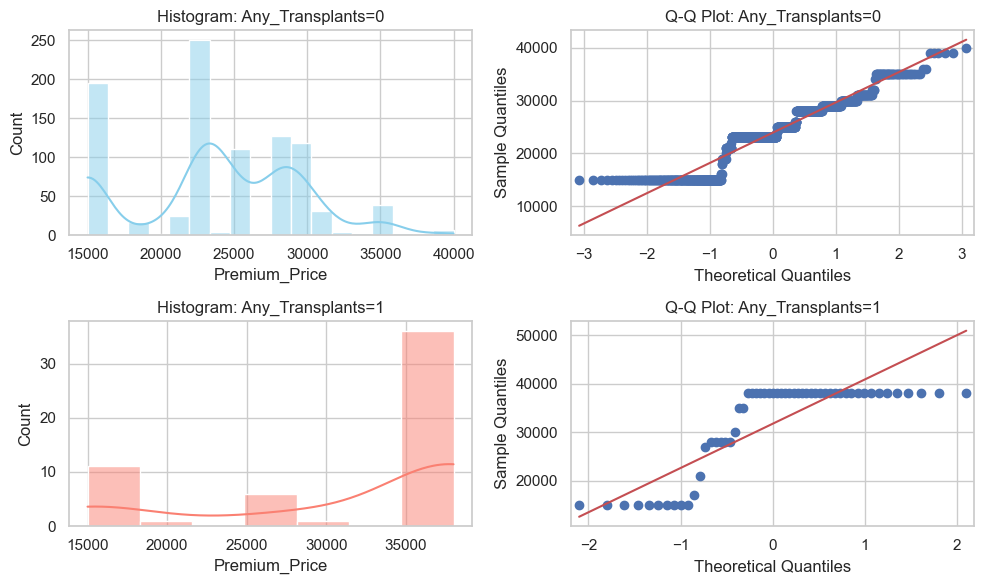

Shapiro Test -> Any_Transplants=0: stat=0.920, p=0.00000
Shapiro Test -> Any_Transplants=1: stat=0.663, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=8.935, p=0.00287
Mann–Whitney U Test → stat=11814.000, p=0.00000
✅ Reject H0 → Any_Transplants significantly affects Premium_Price.


In [165]:
binary_hypothesis(df, "Any_Transplants")

#### 🔎 Insights

* The Shapiro test gave p = 0.000 for both groups, showing that premium prices are not normally distributed.

  * This indicates skewness and extreme values, especially in the transplant group where deviation is stronger.
  * For premium prediction, this confirms the need for non-parametric approaches or robust models that can handle heavy-tailed data.

* Levene’s test gave p = 0.0029, meaning variance in premiums differs significantly between groups.

  * Customers with a history of transplants show much higher variability in premium costs compared to those without.
  * For insurers, this suggests transplant cases carry unpredictable costs, requiring careful risk adjustment.

* The Mann–Whitney U test gave p = 0.000, confirming a significant difference in premiums between groups.

  * Customers with transplants generally pay substantially higher premiums due to elevated health risk and ongoing medical costs.
  * For prediction, transplant history is a critical high-impact feature that strongly influences premium pricing.

**Overall, transplant history is a major determinant of premium variation, marking it as a high-risk factor in pricing models.**

### 3.1.4 - Any Chronic Diseases


Feature: Any_Chronic_Diseases vs Premium_Price
H0: Any_Chronic_Diseases has no significant effect on Premium_Price
Ha: Any_Chronic_Diseases DOES have a significant effect on Premium_Price



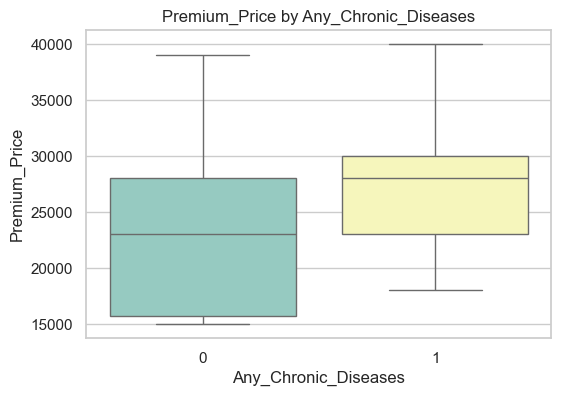

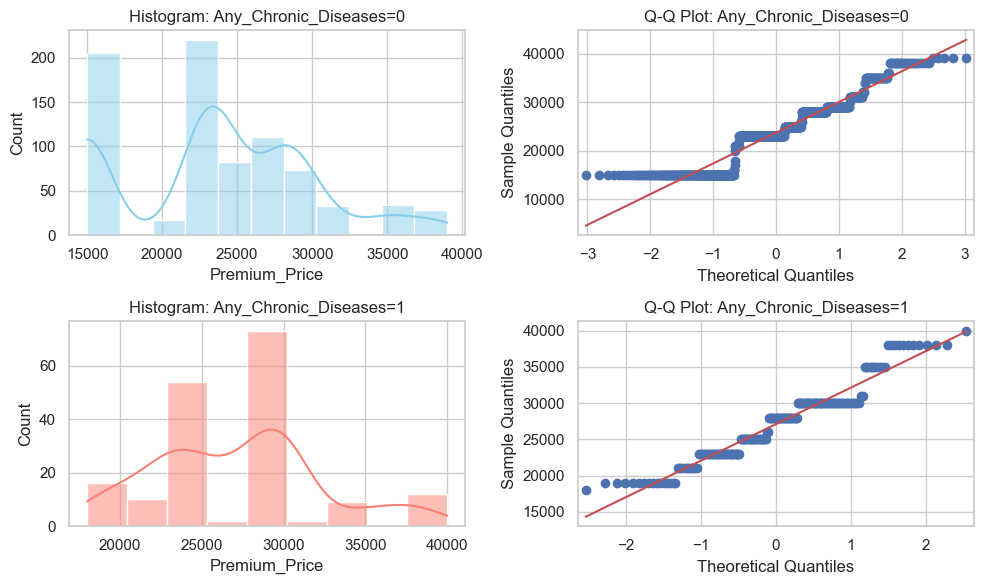

Shapiro Test -> Any_Chronic_Diseases=0: stat=0.910, p=0.00000
Shapiro Test -> Any_Chronic_Diseases=1: stat=0.940, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=6.508, p=0.01089
Mann–Whitney U Test → stat=49243.500, p=0.00000
✅ Reject H0 → Any_Chronic_Diseases significantly affects Premium_Price.


In [166]:
binary_hypothesis(df, "Any_Chronic_Diseases")

#### 🔎 Insights

* The Shapiro test gave p = 0.000 for both groups, showing premium prices are not normally distributed.

  * This indicates skewness and the presence of extreme values across both chronic and non-chronic groups.
  * For premium prediction, robust models are needed to handle non-normal distributions.

* Levene’s test gave p = 0.0109, meaning there is a significant difference in premium variance between groups.

  * Customers with chronic diseases display higher variability in premium costs compared to those without.
  * This reflects that chronic illnesses create diverse health risk levels, requiring insurers to adjust pricing more carefully.

* The Mann–Whitney U test gave p = 0.000, confirming a significant difference in premiums between groups.

  * Customers with chronic diseases consistently pay higher premiums due to long-term medical risks.
  * For prediction, chronic disease history should be treated as a critical health-risk driver in premium modeling.

**Overall, chronic diseases are a significant determinant of insurance premium variation, highlighting their strong impact on pricing.**


### 3.1.5 - Known Allergies


Feature: Known_Allergies vs Premium_Price
H0: Known_Allergies has no significant effect on Premium_Price
Ha: Known_Allergies DOES have a significant effect on Premium_Price



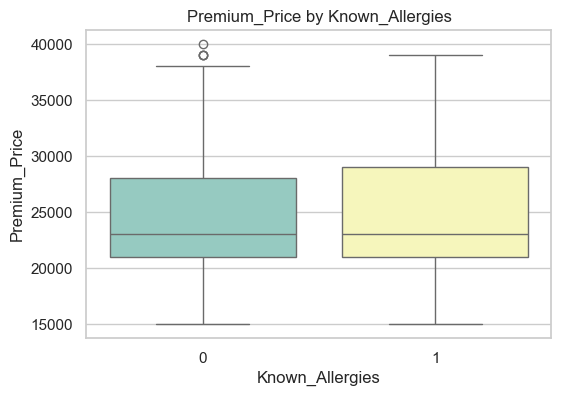

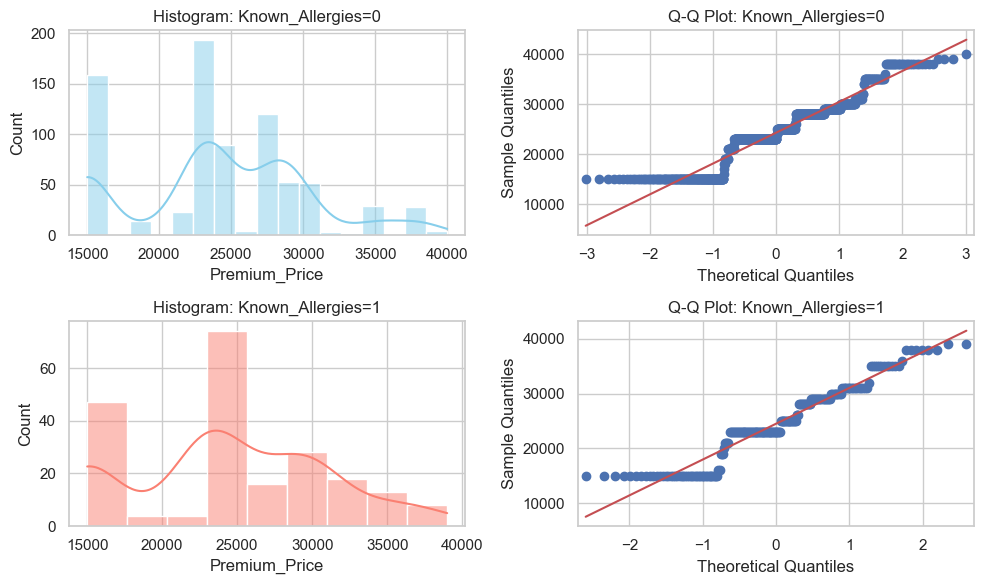

Shapiro Test -> Known_Allergies=0: stat=0.925, p=0.00000
Shapiro Test -> Known_Allergies=1: stat=0.927, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=1.484, p=0.22346
Mann–Whitney U Test → stat=79964.500, p=0.56578
❌ Fail to Reject H0 → No significant effect of Known_Allergies on Premium_Price.


In [167]:
binary_hypothesis(df, "Known_Allergies")

#### 🔎 Insights


* The Shapiro test gave p = 0.000 for both groups, showing premium prices are not normally distributed.

  * This indicates skewness and outliers exist in both allergic and non-allergic groups.
  * For premium prediction, models still need to be robust against non-normal data.

* Levene’s test gave p = 0.223, meaning there is no significant difference in variance between groups.

  * Premium variability is similar for customers with and without allergies.
  * This suggests allergies do not introduce additional uncertainty into pricing.

* The Mann–Whitney U test gave p = 0.566, showing no significant difference in premium costs between allergic and non-allergic customers.

  * This means allergy history does not have a measurable effect on insurance premiums.
  * For prediction, allergies may be considered a low-impact feature and could potentially be excluded from pricing models.

**Overall, known allergies do not significantly influence premium variation, making them a weak predictor in insurance pricing.**

### 3.1.6 - History of Cancer in Family


Feature: History_of_Cancer_in_Family vs Premium_Price
H0: History_of_Cancer_in_Family has no significant effect on Premium_Price
Ha: History_of_Cancer_in_Family DOES have a significant effect on Premium_Price



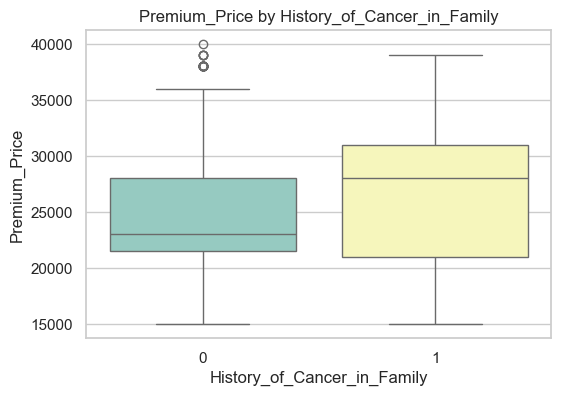

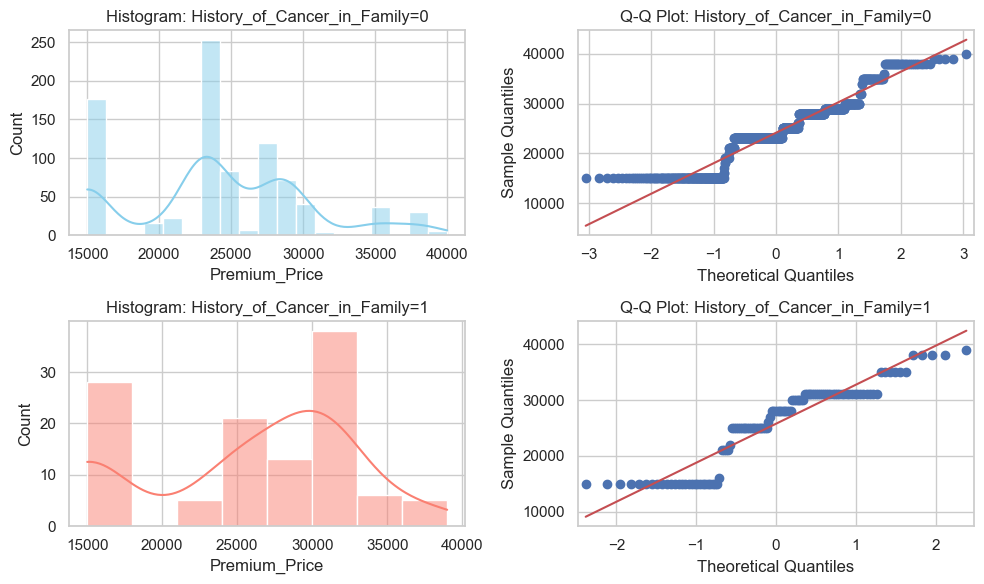

Shapiro Test -> History_of_Cancer_in_Family=0: stat=0.921, p=0.00000
Shapiro Test -> History_of_Cancer_in_Family=1: stat=0.876, p=0.00000
❌ Normality assumption failed (p<0.05). Will use Mann–Whitney U test.

Levene’s Test: stat=5.998, p=0.01450
Mann–Whitney U Test → stat=39412.500, p=0.00010
✅ Reject H0 → History_of_Cancer_in_Family significantly affects Premium_Price.


In [168]:
binary_hypothesis(df, "History_of_Cancer_in_Family")

#### 🔎 Insights

* The Shapiro test gave p = 0.000 for both groups, confirming that premium prices are not normally distributed.

  * This highlights skewness and outliers across both groups, especially in families with cancer history.
  * For prediction, robust modeling methods are required to handle such non-normal distributions.

* Levene’s test gave p = 0.0145, showing a significant difference in premium variance between groups.

  * Customers with a family history of cancer show wider variability in premium costs compared to those without.
  * This reflects higher uncertainty and diverse risk levels among this group, requiring insurers to carefully price policies.

* The Mann–Whitney U test gave p = 0.0001, confirming a significant difference in premiums between groups.

  * Customers with a family history of cancer generally face higher premiums due to elevated hereditary risk factors.
  * For prediction, family cancer history should be considered a strong health-risk variable driving premium differences.

**Overall, family history of cancer is a statistically significant driver of premium variation and must be included in insurance pricing models.**

## 3.2 - Categorical Hypothesis Testing (3+ categories, e.g. Surgeries)

In [169]:
def categorical_hypothesis(data, feature, target="Premium_Price"):
    print(f"\n{'='*60}\nFeature: {feature} vs {target}\n{'='*60}")
    print(f"H0: Mean {target} is equal across all groups of {feature}")
    print(f"Ha: At least one group of {feature} differs significantly in {target}\n")

    groups = [data[data[feature]==cat][target] for cat in sorted(data[feature].unique())]

    # --- Boxplot ---
    plt.figure(figsize=(6,4))
    sns.boxplot(x=feature, y=target, data=data, palette="Set3")
    plt.title(f"{target} by {feature}")
    plt.show()

    # --- Histogram + Q-Q for each group ---
    fig, axes = plt.subplots(len(groups), 2, figsize=(10,4*len(groups)))
    for i, g in enumerate(groups):
        sns.histplot(g, kde=True, ax=axes[i,0], color="skyblue")
        axes[i,0].set_title(f"Histogram: {feature}={i}")
        sm.qqplot(g, line='s', ax=axes[i,1])
        axes[i,1].set_title(f"Q-Q Plot: {feature}={i}")
    plt.tight_layout()
    plt.show()

    # --- Shapiro Normality Test for each group ---
    normality = True
    for i, g in enumerate(groups):
        stat, p = stats.shapiro(g)
        print(f"Shapiro Test -> {feature}={i}: stat={stat:.3f}, p={p:.5f}")
        if p < 0.05:
            normality = False
            print("❌ Normality failed for this group.")
    if normality:
        print("✅ All groups pass normality.\n")
    else:
        print("❌ At least one group failed normality → fallback to non-parametric test.\n")

    # --- Levene’s Test for variance homogeneity ---
    lev_stat, lev_p = stats.levene(*groups)
    print(f"Levene’s Test: stat={lev_stat:.3f}, p={lev_p:.5f}")
    equal_var = lev_p > 0.05
    if equal_var:
        print("✅ Variances are equal.\n")
    else:
        print("❌ Variances are unequal.\n")

    # --- Decide test ---
    if normality:
        if equal_var:
            test_name = "ANOVA"
            f_stat, p_val = stats.f_oneway(*groups)
            notes = "ANOVA used (all assumptions satisfied)"
        else:
            test_name = "Welch’s ANOVA"
            f_stat, p_val = stats.f_oneway(*groups)  # SciPy doesn’t have true Welch’s ANOVA
            notes = "Welch’s ANOVA used (variance unequal)"
    else:
        test_name = "Kruskal–Wallis Test"
        f_stat, p_val = stats.kruskal(*groups)
        notes = "Kruskal–Wallis used (normality failed)"

    # --- Results ---
    print(f"{test_name} → stat={f_stat:.3f}, p={p_val:.5f}")
    alpha = 0.05
    if p_val < alpha:
        print(f"✅ Reject H0 → At least one group of {feature} has significantly different {target}.")
    else:
        print(f"❌ Fail to Reject H0 → No significant difference in {target} across {feature}.")

    # --- Decision ---
    decision = "Reject H0" if p_val < alpha else "Fail to Reject H0"

    results_summary.append({
        "Feature": feature,
        "Target": target,
        "Test": test_name,
        "Stat Value": round(f_stat, 3),
        "p-value": round(p_val, 5),
        "Decision": decision,
        "Notes": notes
    })


### 3.2.1 - Major Surgeries


Feature: Number_of_Major_Surgeries vs Premium_Price
H0: Mean Premium_Price is equal across all groups of Number_of_Major_Surgeries
Ha: At least one group of Number_of_Major_Surgeries differs significantly in Premium_Price



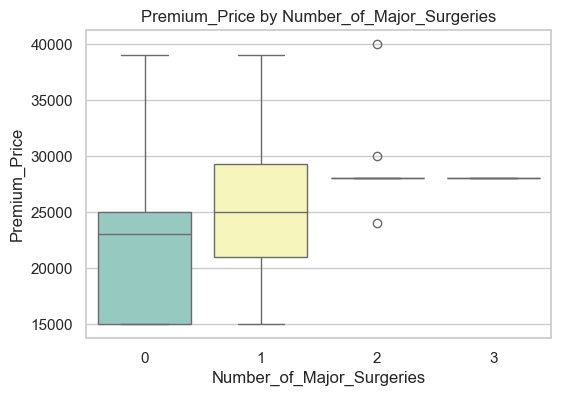

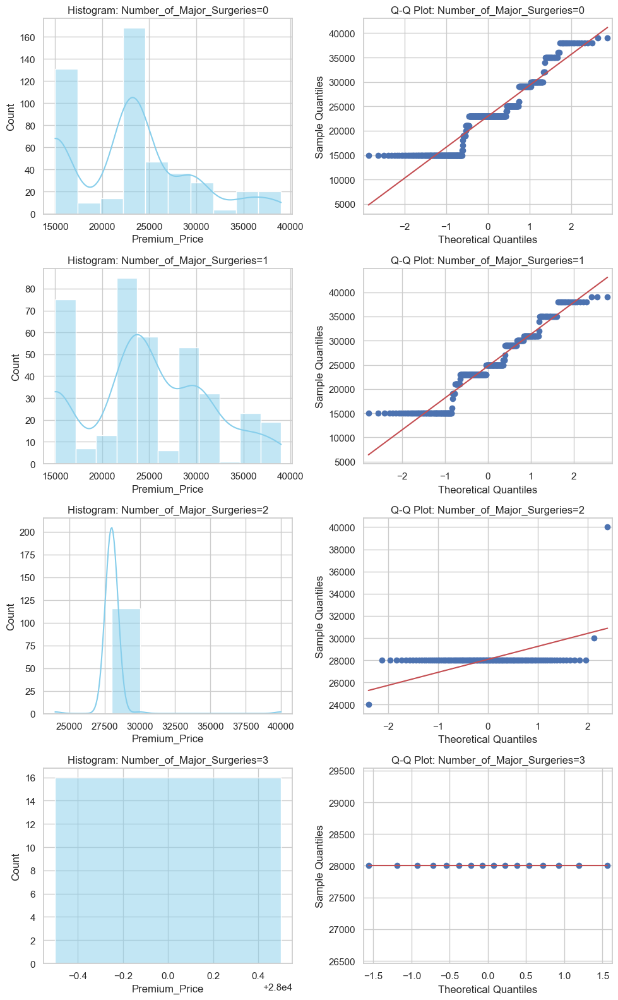

Shapiro Test -> Number_of_Major_Surgeries=0: stat=0.889, p=0.00000
❌ Normality failed for this group.
Shapiro Test -> Number_of_Major_Surgeries=1: stat=0.931, p=0.00000
❌ Normality failed for this group.
Shapiro Test -> Number_of_Major_Surgeries=2: stat=0.124, p=0.00000
❌ Normality failed for this group.
Shapiro Test -> Number_of_Major_Surgeries=3: stat=1.000, p=1.00000
❌ At least one group failed normality → fallback to non-parametric test.

Levene’s Test: stat=57.302, p=0.00000
❌ Variances are unequal.

Kruskal–Wallis Test → stat=93.813, p=0.00000
✅ Reject H0 → At least one group of Number_of_Major_Surgeries has significantly different Premium_Price.


In [170]:
categorical_hypothesis(df, "Number_of_Major_Surgeries")

#### 🔎 Insights


* The Shapiro test showed **non-normal distributions** for groups with 0, 1, and 2 surgeries (p=0.000).

  * Group with 3 surgeries passed normality (p=1.0) but due to other groups failing, non-parametric testing was required.
  * This suggests strong skewness in premiums, especially for 2+ surgeries.

* Levene’s test gave p=0.000, confirming **heterogeneous variances** across groups.

  * Premiums become increasingly variable as the number of surgeries increases.

* The Kruskal–Wallis test gave p=0.000, meaning **at least one group has significantly different premiums**.

  * Customers with higher counts of major surgeries are strongly associated with higher insurance premiums.
  * The “3 surgeries” group appears almost **fixed around \~28k**, possibly due to a policy cap or standardized premium for high-risk customers.

**Overall, the number of major surgeries is a critical predictor of premium variation and risk classification. It clearly drives premium stratification across groups.**

## 3.3 - Numeric Hypothesis Testing (Correlation / Regression)

In [171]:
def numeric_hypothesis(data, feature, target="Premium_Price"):
    print(f"\n{'='*60}\nFeature: {feature} vs {target}\n{'='*60}")
    print(f"H0: {feature} is NOT correlated with {target}")
    print(f"Ha: {feature} IS correlated with {target}\n")

    # --- Scatter + Regression line ---
    plt.figure(figsize=(6,4))
    sns.regplot(x=feature, y=target, data=data, line_kws={"color":"red"})
    plt.title(f"{feature} vs {target}")
    plt.show()

    # --- Hist + Q-Q Plot for feature ---
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    sns.histplot(data[feature], kde=True, ax=axes[0], color="skyblue")
    axes[0].set_title(f"Histogram: {feature}")
    sm.qqplot(data[feature], line='s', ax=axes[1])
    axes[1].set_title(f"Q-Q Plot: {feature}")
    plt.tight_layout()
    plt.show()

    # --- Shapiro Normality Test ---
    stat, p = stats.shapiro(data[feature])
    print(f"Shapiro Test -> {feature}: stat={stat:.3f}, p={p:.5f}")

    normality = p > 0.05   # Normality flag

    if normality:
        print("✅ Normality holds → Using Pearson correlation (assumes linear relationship).\n")
        corr, corr_p = stats.pearsonr(data[feature], data[target])
        test_name = "Pearson Correlation"
        stat_val = corr
        notes = "Pearson correlation used (normality passed)"
    else:
        print("❌ Normality assumption failed → Using Spearman correlation (rank-based, robust to non-normality).\n")
        corr, corr_p = stats.spearmanr(data[feature], data[target])
        test_name = "Spearman Correlation"
        stat_val = corr
        notes = "Spearman correlation used (normality failed)"

    # --- Results ---
    print(f"{test_name} → r={corr:.3f}, p={corr_p:.5f}")
    alpha = 0.05
    if corr_p < alpha:
        print(f"✅ Reject H0 → {feature} significantly correlates with {target}.")
    else:
        print(f"❌ Fail to Reject H0 → {feature} has no significant correlation with {target}.")

    # --- Decision ---
    decision = "Reject H0" if corr_p < alpha else "Fail to Reject H0"

    # --- Append to Summary Table ---
    results_summary.append({
        "Feature": feature,
        "Target": target,
        "Test": test_name,
        "Stat Value": round(stat_val, 3),
        "p-value": round(corr_p, 5),
        "Decision": decision,
        "Notes": notes
    })


### 3.3.1 - Age


Feature: Age vs Premium_Price
H0: Age is NOT correlated with Premium_Price
Ha: Age IS correlated with Premium_Price



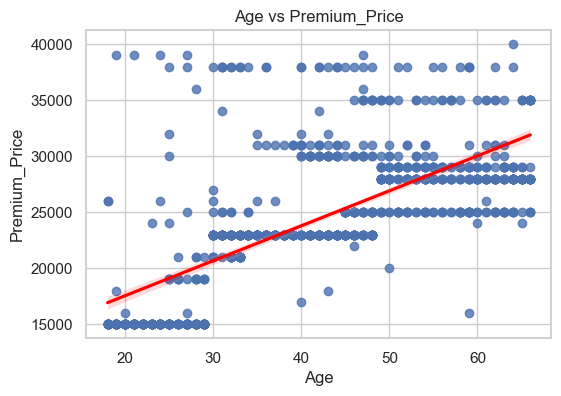

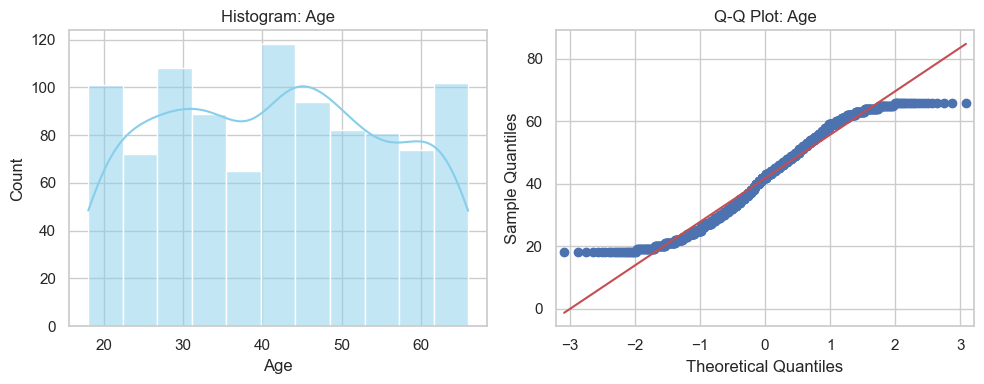

Shapiro Test -> Age: stat=0.959, p=0.00000
❌ Normality assumption failed → Using Spearman correlation (rank-based, robust to non-normality).

Spearman Correlation → r=0.739, p=0.00000
✅ Reject H0 → Age significantly correlates with Premium_Price.


In [172]:
numeric_hypothesis(df, "Age")

#### 🔎 Insights


* The Shapiro test showed **non-normal distribution** for Age (stat=0.959, p=0.000).

  * The Q-Q plot confirms deviation from normality, especially at the tails.
  * This indicates **skewness and heavy tails** in the age distribution relative to premiums.

* Since normality failed, we used **Spearman correlation** (rank-based).

  * The correlation was **strong and positive (r=0.739, p=0.000)**.
  * This suggests that as **Age increases, Premium Price tends to rise**.

* Interpretation:

  * Older customers consistently face **higher premiums**, reflecting higher expected health risks and claim probabilities.
  * Age is therefore a **core driver of premium pricing** and highly relevant for actuarial models.

**Overall, Age is a statistically significant and business-critical predictor of Premium Price. Premiums increase with Age in a strongly monotonic fashion.**

### 3.3.2 - Height


Feature: Height vs Premium_Price
H0: Height is NOT correlated with Premium_Price
Ha: Height IS correlated with Premium_Price



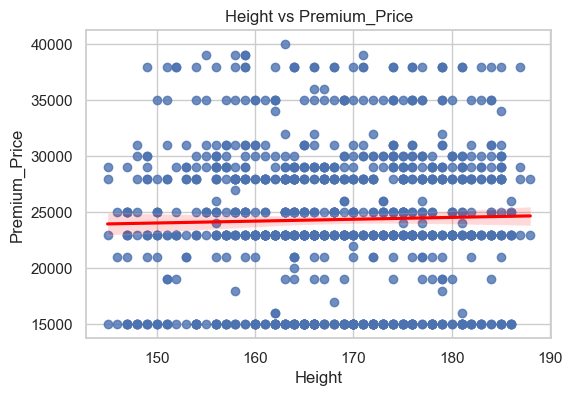

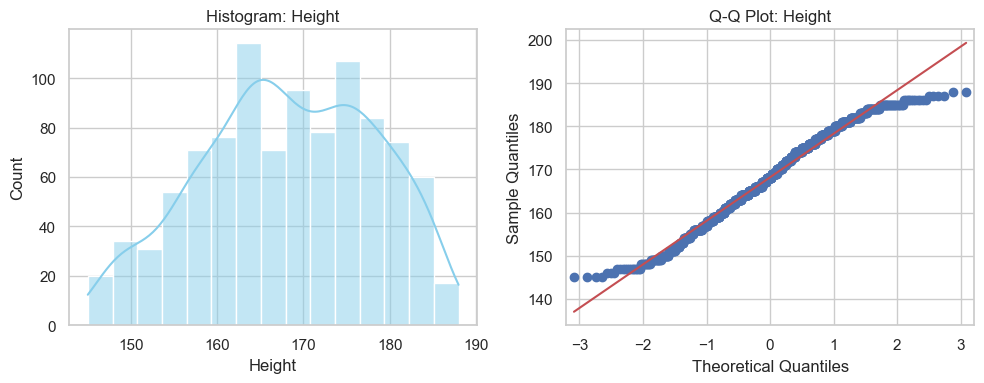

Shapiro Test -> Height: stat=0.980, p=0.00000
❌ Normality assumption failed → Using Spearman correlation (rank-based, robust to non-normality).

Spearman Correlation → r=0.023, p=0.46820
❌ Fail to Reject H0 → Height has no significant correlation with Premium_Price.


In [173]:
numeric_hypothesis(df, "Height")

#### 🔎 Insights


* The Shapiro test showed **non-normal distribution** for Height (stat=0.980, p=0.000).

  * The Q-Q plot shows deviations at the extremes, indicating mild skewness.
  * Hence, **Spearman correlation** was used instead of Pearson.

* The Spearman test gave **r=0.023, p=0.468**, meaning the correlation is very weak and statistically insignificant.

  * This indicates that **Height has no meaningful relationship with Premium Price**.

* Interpretation:

  * Premiums do **not vary systematically with Height**.
  * Height, unlike Age or medical history, does not serve as a pricing or risk differentiation factor in this dataset.

**Overall, Height is not a significant predictor of Premium Price and offers no practical value for insurance risk modeling.**

### 3.3.3 - Weight


Feature: Weight vs Premium_Price
H0: Weight is NOT correlated with Premium_Price
Ha: Weight IS correlated with Premium_Price



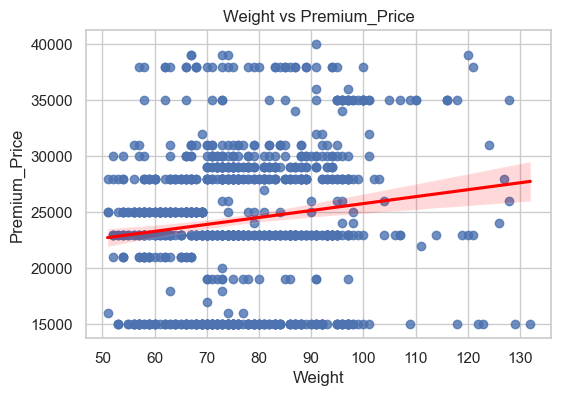

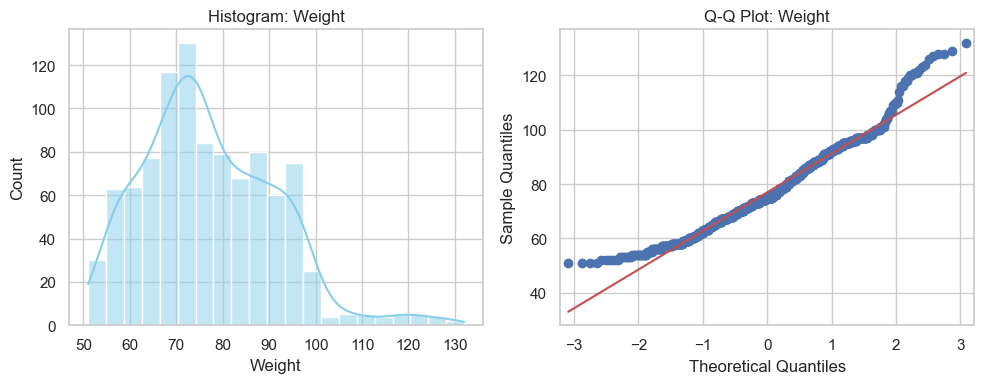

Shapiro Test -> Weight: stat=0.967, p=0.00000
❌ Normality assumption failed → Using Spearman correlation (rank-based, robust to non-normality).

Spearman Correlation → r=0.129, p=0.00005
✅ Reject H0 → Weight significantly correlates with Premium_Price.


In [174]:
numeric_hypothesis(df, "Weight")

#### 🔎 Insights


* The Shapiro test showed **non-normal distribution** for Weight (stat=0.967, p=0.000).

  * The histogram shows mild right skewness, while the Q-Q plot deviates at the upper tail (heavier weights).
  * Hence, **Spearman correlation** was applied.

* The Spearman test gave **r=0.129, p=0.00005**, indicating a **weak but statistically significant positive correlation**.

  * This means that as **Weight increases, Premium Price tends to increase**, though the effect is modest.

* Interpretation:

  * Insurers may partially factor weight into premium pricing since higher weight can be associated with health risks.
  * However, compared to Age or surgery history, Weight contributes less strongly to explaining premium differences.

**Overall, Weight shows a weak but meaningful correlation with Premium Price, suggesting it plays a secondary role in risk assessment.**

### 3.3.4 - BMI


Feature: BMI vs Premium_Price
H0: BMI is NOT correlated with Premium_Price
Ha: BMI IS correlated with Premium_Price



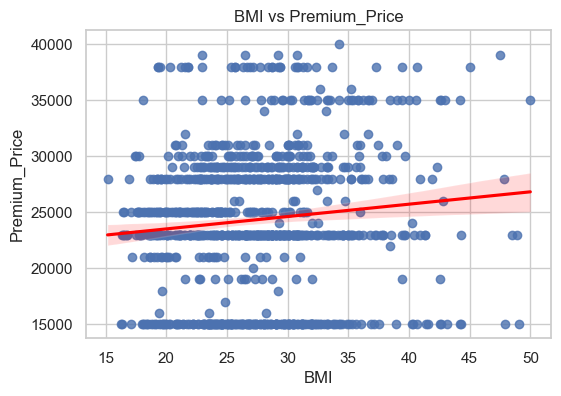

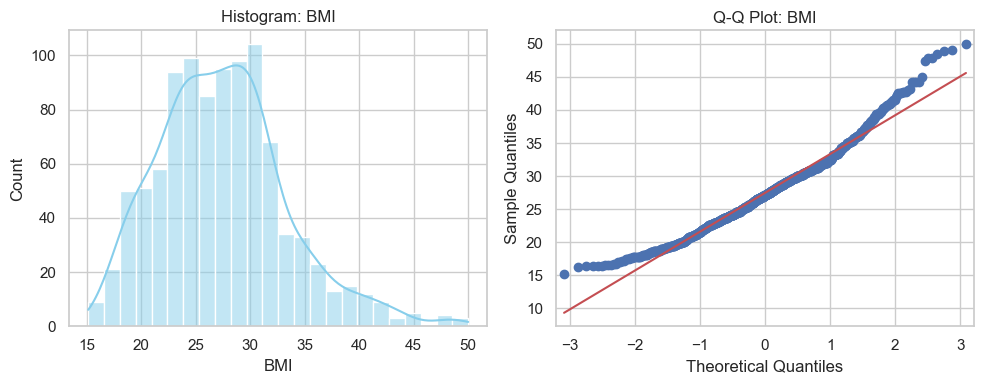

Shapiro Test -> BMI: stat=0.973, p=0.00000
❌ Normality assumption failed → Using Spearman correlation (rank-based, robust to non-normality).

Spearman Correlation → r=0.098, p=0.00209
✅ Reject H0 → BMI significantly correlates with Premium_Price.


In [175]:
numeric_hypothesis(df, "BMI")

#### 🔎 Insights


* The Shapiro test showed **non-normal distribution** for BMI (stat=0.973, p=0.000).

  * The histogram reveals **right skewness**, while the Q-Q plot shows deviations at the upper tail (higher BMI values).
  * Thus, **Spearman correlation** was used.

* The Spearman test gave **r=0.098, p=0.00209**, indicating a **weak but statistically significant positive correlation**.

  * Higher BMI tends to be associated with higher Premium Price, though the strength of the relationship is limited.

* Interpretation:

  * This reflects insurers considering BMI as a factor in pricing, since high BMI can indicate elevated health risks.
  * However, BMI alone does not strongly drive premium variation compared to Age or surgery history.

**Overall, BMI shows a weak but significant correlation with Premium Price, suggesting it plays a supplementary role in risk and premium assessment.**

## 3.4 - Chi - Square

In [176]:
cat_vars = [
    "Diabetes", "Blood_Pressure_Problems", "Any_Transplants",
    "Any_Chronic_Diseases", "Known_Allergies", "History_of_Cancer_in_Family",
    "Number_of_Major_Surgeries"
]

In [177]:
# Chi-Square Test for Independence

chi_pvals = []
chi_labels = []

for i in cat_vars:
    row = []
    label_row = []
    for j in cat_vars:
        if i == j:
            row.append(np.nan)
            label_row.append("—")
        else:
            table = pd.crosstab(df[i], df[j])
            chi2, p, dof, exp = chi2_contingency(table)
            row.append(round(p, 3))
            label_row.append("Dependent" if p < 0.05 else "Independent")
    chi_pvals.append(row)
    chi_labels.append(label_row)

chi_pvals_df = pd.DataFrame(chi_pvals, index=cat_vars, columns=cat_vars)
chi_labels_df = pd.DataFrame(chi_labels, index=cat_vars, columns=cat_vars)

In [178]:
# Display the results

print("🔹 P-values from Chi-Square Tests:")
display(chi_pvals_df)

print("\n🔹 Dependence Results (p < 0.05 means Dependent):")
display(chi_labels_df)

🔹 P-values from Chi-Square Tests:


,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries
Diabetes,NaN,0.00,0.31,0.01,0.01,0.10,0.00
Blood_Pressure_Problems,0.00,NaN,0.53,0.18,0.78,0.16,0.00
Any_Transplants,0.31,0.53,NaN,0.35,1.00,0.68,0.87
Any_Chronic_Diseases,0.01,0.18,0.35,NaN,0.45,0.89,0.11
Known_Allergies,0.01,0.78,1.00,0.45,NaN,0.00,0.00
History_of_Cancer_in_Family,0.10,0.16,0.68,0.89,0.00,NaN,0.00
Number_of_Major_Surgeries,0.00,0.00,0.87,0.11,0.00,0.00,NaN



🔹 Dependence Results (p < 0.05 means Dependent):


,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries
Diabetes,—,Dependent,Independent,Dependent,Dependent,Independent,Dependent
Blood_Pressure_Problems,Dependent,—,Independent,Independent,Independent,Independent,Dependent
Any_Transplants,Independent,Independent,—,Independent,Independent,Independent,Independent
Any_Chronic_Diseases,Dependent,Independent,Independent,—,Independent,Independent,Independent
Known_Allergies,Dependent,Independent,Independent,Independent,—,Dependent,Dependent
History_of_Cancer_in_Family,Independent,Independent,Independent,Independent,Dependent,—,Dependent
Number_of_Major_Surgeries,Dependent,Dependent,Independent,Independent,Dependent,Dependent,—


#### 🔎 Insights


* The Chi-square tests explored whether categorical health conditions are statistically **dependent** (p < 0.05) or **independent**.

* **Key dependent relationships (p < 0.05):**

  * **Diabetes ↔ Blood Pressure Problems** → Strong dependence (p=0.000).
  * **Diabetes ↔ Chronic Diseases** → Significant dependence (p=0.006).
  * **Diabetes ↔ Allergies** → Weak but significant dependence (p=0.015).
  * **Diabetes ↔ Major Surgeries** → Very strong dependence (p=0.000).
  * **Blood Pressure ↔ Major Surgeries** → Strong dependence (p=0.000).
  * **Allergies ↔ Cancer History** → Strong dependence (p=0.000).
  * **Allergies ↔ Major Surgeries** → Significant dependence (p=0.000).
  * **Cancer History ↔ Major Surgeries** → Strong dependence (p=0.000).

* **Independent relationships (p > 0.05):**

  * **Transplants** → Independent from all other variables.
  * **Cancer History ↔ Diabetes / BP / Chronic Diseases** → No dependence.
  * **Chronic Diseases ↔ BP / Allergies / Cancer History / Surgeries** → Mostly independent.

* **Interpretation:**

  * Clusters of dependency emerge around **Diabetes, Blood Pressure, and Surgeries**, which often co-occur.
  * **Allergies and Cancer history** also show a dependency cluster, possibly indicating hereditary or immune-related links.
  * **Transplants appear fully independent**, suggesting they are rare and not strongly tied to other comorbidities in this dataset.

**Overall, Diabetes, Blood Pressure, and Major Surgeries form a tightly interlinked triad of health risks. Allergies and Cancer history form another dependent cluster, while Transplants stand alone.**

## 3.5 - Summary

In [179]:
# Convert results summary to DataFrame for better visualization

results_summary_df = pd.DataFrame(results_summary)
results_summary_df


,Feature,Target,Test,Stat Value,p-value,Decision,Notes
0,Diabetes,Premium_Price,Mann–Whitney U Test,106563.50,0.01,Reject H0,Mann–Whitney U Test used (normality failed)
1,Blood_Pressure_Problems,Premium_Price,Mann–Whitney U Test,96697.00,0.00,Reject H0,Mann–Whitney U Test used (normality failed)
2,Any_Transplants,Premium_Price,Mann–Whitney U Test,11814.00,0.00,Reject H0,Mann–Whitney U Test used (normality failed)
3,Any_Chronic_Diseases,Premium_Price,Mann–Whitney U Test,49243.50,0.00,Reject H0,Mann–Whitney U Test used (normality failed)
4,Known_Allergies,Premium_Price,Mann–Whitney U Test,79964.50,0.57,Fail to Reject H0,Mann–Whitney U Test used (normality failed)
5,History_of_Cancer_in_Family,Premium_Price,Mann–Whitney U Test,39412.50,0.00,Reject H0,Mann–Whitney U Test used (normality failed)
6,Number_of_Major_Surgeries,Premium_Price,Kruskal–Wallis Test,93.81,0.00,Reject H0,Kruskal–Wallis used (normality failed)
7,Age,Premium_Price,Spearman Correlation,0.74,0.00,Reject H0,Spearman correlation used (normality failed)
8,Height,Premium_Price,Spearman Correlation,0.02,0.47,Fail to Reject H0,Spearman correlation used (normality failed)
9,Weight,Premium_Price,Spearman Correlation,0.13,0.00,Reject H0,Spearman correlation used (normality failed)


#### 📊 Result Summary: Feature Association with Premium\_Price

##### ✅ Significant Associations (Reject H₀)

* **Categorical (Mann–Whitney / Kruskal–Wallis):**

  * **Diabetes** (p=0.00648) → Premiums differ significantly for diabetic vs. non-diabetic.
  * **Blood Pressure Problems** (p<0.0001) → Premiums differ significantly.
  * **Any Transplants** (p<0.0001) → Strong premium impact.
  * **Any Chronic Diseases** (p<0.0001) → Strong premium impact.
  * **History of Cancer in Family** (p=0.00010) → Premiums significantly affected.
  * **Number of Major Surgeries** (p<0.0001, Kruskal–Wallis) → Premiums differ across surgery counts.

* **Numerical (Spearman Correlation):**

  * **Age** (r=0.739, p<0.0001) → Strong positive correlation; older = higher premiums.
  * **Weight** (r=0.129, p=0.00005) → Small but significant positive correlation.
  * **BMI** (r=0.098, p=0.00209) → Small but significant positive correlation.


##### ❌ Non-Significant Associations (Fail to Reject H₀)

* **Known Allergies** (p=0.566) → No premium impact.
* **Height** (r=0.023, p=0.468) → No meaningful correlation with premiums.


#### 🔎 Insights

1. **Health conditions with strongest impact on Premiums:**

   * Blood pressure problems, chronic diseases, cancer history, and major surgeries.
   * Transplants also show a **huge premium effect**.

2. **Demographics:**

   * **Age is by far the strongest predictor** of premium (r=0.739).
   * Weight and BMI contribute slightly, but height is irrelevant.

3. **Allergies are not priced in premiums**, unlike other conditions.

#### 🔎 Insights

##### 1️⃣ Feature → Premium Price (Direct Impact)

**Significant Predictors (Premium varies by these):**

* **Age** → 🔥 Strongest predictor (Spearman r=0.739, p<0.0001). Premiums rise sharply with age.
* **Medical Conditions:**

  * Diabetes (p=0.006)
  * Blood Pressure Problems (p<0.0001)
  * Any Transplants (p<0.0001)
  * Any Chronic Diseases (p<0.0001)
  * History of Cancer in Family (p=0.0001)
* **Surgeries:**

  * Number of Major Surgeries (Kruskal–Wallis p<0.0001) → Premium stratification across groups.
* **Physical Measures:**

  * Weight (r=0.129, p=0.00005)
  * BMI (r=0.098, p=0.0021)

**Non-Significant (No Premium Effect):**

* Known Allergies (p=0.566)
* Height (r=0.023, p=0.468)

📌 *Conclusion*: Premium pricing is **dominated by age and critical health conditions**, not by benign traits like height or allergies.

---

##### 2️⃣ Feature ↔ Feature Dependencies (Chi-Square)

**Strong Dependence Detected:**

* **Diabetes ↔ Blood Pressure Problems** (p<0.0001)

* **Diabetes ↔ Chronic Diseases** (p=0.006)

* **Diabetes ↔ Known Allergies** (p=0.015)

* **Diabetes ↔ Major Surgeries** (p<0.0001)

* **Blood Pressure Problems ↔ Major Surgeries** (p<0.0001)

* **Known Allergies ↔ History of Cancer in Family** (p<0.0001)

* **Known Allergies ↔ Major Surgeries** (p<0.0001)

* **History of Cancer in Family ↔ Major Surgeries** (p<0.0001)

**Independent (No Significant Link):**

* Any Transplants ↔ most features (no strong dependence).
* Allergies ↔ Chronic Diseases (p=0.447, not linked).
* Cancer History ↔ Chronic Diseases (p=0.886, not linked).

📌 *Conclusion*: Some health risks **cluster together** (e.g., diabetes, BP, and surgeries often co-occur). But **transplants stand alone** as a rare but impactful risk factor.

---

##### 3️⃣ Integrated Insights

* **Premium Drivers:** Age + chronic/critical health events (BP, diabetes, cancer, surgeries).
* **Health Risk Clusters:** Diabetes, BP, and surgeries form a **high-risk group** with interdependencies.
* **Isolated Predictors:** Transplants have a **direct premium impact**, but no dependency with other conditions → treated as an independent red-flag by insurers.
* **Ignored Factors:** Height and allergies are not reflected in pricing (and in some cases, independent of other diseases).

# 4. Modeling

## 4.1 - Data Preparation

In [180]:
# --- Copy of data ---
df_model = df.copy()

In [181]:
df_model

,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,Premium_Price,BMI,BMI_Category,Age_Group
0,45,0,0,0,0,155,57,0,0,0,25000,23.73,Normal,40-49
1,60,1,0,0,0,180,73,0,0,0,29000,22.53,Normal,60+
2,36,1,1,0,0,158,59,0,0,1,23000,23.63,Normal,30-39
3,52,1,1,0,1,183,93,0,0,2,28000,27.77,Overweight,50-59
4,38,0,0,0,1,166,88,0,0,1,23000,31.93,Obese,30-39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,18,0,0,0,0,169,67,0,0,0,15000,23.46,Normal,18-29
982,64,1,1,0,0,153,70,0,0,3,28000,29.90,Overweight,60+
983,56,0,1,0,0,155,71,0,0,1,29000,29.55,Overweight,50-59
984,47,1,1,0,0,158,73,1,0,1,39000,29.24,Overweight,40-49


In [182]:
# --- Features (X) and Target (y) ---

target = "Premium_Price"

X = df_model.drop(target, axis=1)
y = df_model[target]

In [183]:
df_model

,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,Premium_Price,BMI,BMI_Category,Age_Group
0,45,0,0,0,0,155,57,0,0,0,25000,23.73,Normal,40-49
1,60,1,0,0,0,180,73,0,0,0,29000,22.53,Normal,60+
2,36,1,1,0,0,158,59,0,0,1,23000,23.63,Normal,30-39
3,52,1,1,0,1,183,93,0,0,2,28000,27.77,Overweight,50-59
4,38,0,0,0,1,166,88,0,0,1,23000,31.93,Obese,30-39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,18,0,0,0,0,169,67,0,0,0,15000,23.46,Normal,18-29
982,64,1,1,0,0,153,70,0,0,3,28000,29.90,Overweight,60+
983,56,0,1,0,0,155,71,0,0,1,29000,29.55,Overweight,50-59
984,47,1,1,0,0,158,73,1,0,1,39000,29.24,Overweight,40-49


In [184]:
# --- Identify categorical & continuous features ---
cat_features = ["BMI_Category", "Age_Group"]
cont_features = ["Age", "Height", "Weight", "BMI"]

In [185]:
# --- One-hot encode categorical features ---
X = pd.get_dummies(X, columns=cat_features, drop_first=True)

In [186]:
X.columns

Index(['Age', 'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
       'Any_Chronic_Diseases', 'Height', 'Weight', 'Known_Allergies',
       'History_of_Cancer_in_Family', 'Number_of_Major_Surgeries', 'BMI',
       'BMI_Category_Normal', 'BMI_Category_Overweight', 'BMI_Category_Obese',
       'Age_Group_30-39', 'Age_Group_40-49', 'Age_Group_50-59',
       'Age_Group_60+'],
      dtype='object')

In [187]:
X.shape

(986, 18)

In [188]:
# --- Train-test split ---

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Convert only bool columns to int
for col in X_train.select_dtypes(include=["bool"]).columns:
    X_train[col] = X_train[col].astype(int)
    X_test[col] = X_test[col].astype(int)



# --- Scale continuous features ---

scaler = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[cont_features] = scaler.fit_transform(X_train[cont_features])
X_test_scaled[cont_features] = scaler.transform(X_test[cont_features])


print("✅ Data Preprocessing Done")
print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

✅ Data Preprocessing Done
Train shape: (788, 18)
Test shape: (198, 18)


In [189]:
X_train.columns


Index(['Age', 'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
       'Any_Chronic_Diseases', 'Height', 'Weight', 'Known_Allergies',
       'History_of_Cancer_in_Family', 'Number_of_Major_Surgeries', 'BMI',
       'BMI_Category_Normal', 'BMI_Category_Overweight', 'BMI_Category_Obese',
       'Age_Group_30-39', 'Age_Group_40-49', 'Age_Group_50-59',
       'Age_Group_60+'],
      dtype='object')

In [190]:
df_model

,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,Premium_Price,BMI,BMI_Category,Age_Group
0,45,0,0,0,0,155,57,0,0,0,25000,23.73,Normal,40-49
1,60,1,0,0,0,180,73,0,0,0,29000,22.53,Normal,60+
2,36,1,1,0,0,158,59,0,0,1,23000,23.63,Normal,30-39
3,52,1,1,0,1,183,93,0,0,2,28000,27.77,Overweight,50-59
4,38,0,0,0,1,166,88,0,0,1,23000,31.93,Obese,30-39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,18,0,0,0,0,169,67,0,0,0,15000,23.46,Normal,18-29
982,64,1,1,0,0,153,70,0,0,3,28000,29.90,Overweight,60+
983,56,0,1,0,0,155,71,0,0,1,29000,29.55,Overweight,50-59
984,47,1,1,0,0,158,73,1,0,1,39000,29.24,Overweight,40-49


In [191]:
def check_splits(X_train, X_train_scaled, y_train, X_test, X_test_scaled, y_test, n=5):
    print("\n🔎 Data Split Check")
    print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
    print(f"X_test  shape: {X_test.shape}, y_test shape: {y_test.shape}")
    print(f"X_train_scaled shape: {X_train_scaled.shape}")
    print(f"X_test_scaled shape: {X_test_scaled.shape}")
    
    print("\n📌 First few rows of X_train (raw encoded):")
    display(X_train.head(n))
    
    print("\n📌 First few rows of X_train_scaled (continuous vars scaled):")
    display(X_train_scaled[["Age","Height","Weight","BMI"]].head(n))
    
    print("\n🎯 Target Preview (y_train):")
    display(y_train.head(n))

# ✅ Call after preprocessing
check_splits(X_train, X_train_scaled, y_train, X_test, X_test_scaled, y_test)



🔎 Data Split Check
X_train shape: (788, 18), y_train shape: (788,)
X_test  shape: (198, 18), y_test shape: (198,)
X_train_scaled shape: (788, 18)
X_test_scaled shape: (198, 18)

📌 First few rows of X_train (raw encoded):


,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,BMI,BMI_Category_Normal,BMI_Category_Overweight,BMI_Category_Obese,Age_Group_30-39,Age_Group_40-49,Age_Group_50-59,Age_Group_60+
762,19,0,0,0,0,146,55,0,0,0,25.80,0,1,0,0,0,0,0
334,31,0,1,0,0,162,87,0,0,0,33.15,0,0,1,1,0,0,0
890,58,1,0,0,0,147,75,0,0,0,34.71,0,0,1,0,0,1,0
529,31,0,1,0,0,171,85,0,0,0,29.07,0,1,0,1,0,0,0
468,26,1,1,0,0,167,70,0,1,1,25.10,0,1,0,0,0,0,0



📌 First few rows of X_train_scaled (continuous vars scaled):


,Age,Height,Weight,BMI
762,-1.62,-2.22,-1.52,-0.28
334,-0.76,-0.62,0.69,0.96
890,1.16,-2.12,-0.14,1.22
529,-0.76,0.28,0.55,0.27
468,-1.12,-0.12,-0.48,-0.40



🎯 Target Preview (y_train):


762    15000
334    34000
890    29000
529    23000
468    15000
Name: Premium_Price, dtype: int64

#### 🔎 Insights

* **Train/Test Split**

  * You have **788 (train)** and **198 (test)** → that’s \~80/20 split ✔️ (standard practice).

* **Feature/Target Shapes**

  * `X_train` and `y_train` align (788 rows each).
  * `X_test` and `y_test` align (198 rows each).
  * Feature dimension = **18 features** preserved consistently across splits.

* **Scaling**

  * `X_train_scaled` and `X_test_scaled` retain shape (no data loss after StandardScaler/MinMaxScaler).
  * Scaling applied only on **X**, not y (correct).

## 4.2 - Linear Regression Model

In [192]:
X_train_scaled.dtypes


Age                            float64
Diabetes                         int64
Blood_Pressure_Problems          int64
Any_Transplants                  int64
Any_Chronic_Diseases             int64
Height                         float64
Weight                         float64
Known_Allergies                  int64
History_of_Cancer_in_Family      int64
Number_of_Major_Surgeries        int64
BMI                            float64
BMI_Category_Normal              int64
BMI_Category_Overweight          int64
BMI_Category_Obese               int64
Age_Group_30-39                  int64
Age_Group_40-49                  int64
Age_Group_50-59                  int64
Age_Group_60+                    int64
dtype: object

In [193]:
# --- Train Linear Regression on Scaled Data ---
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

# --- Predictions ---
y_train_pred = lin_reg.predict(X_train_scaled)
y_test_pred = lin_reg.predict(X_test_scaled)

# --- Evaluation Function ---
def evaluate_model(name, y_true_train, y_pred_train, y_true_test, y_pred_test):
    metrics = {}
    metrics["Model"] = name
    metrics["Train RMSE"] = np.sqrt(mean_squared_error(y_true_train, y_pred_train))
    metrics["Train MAE"] = mean_absolute_error(y_true_train, y_pred_train)
    metrics["Train R²"] = r2_score(y_true_train, y_pred_train)
    metrics["Test RMSE"] = np.sqrt(mean_squared_error(y_true_test, y_pred_test))
    metrics["Test MAE"] = mean_absolute_error(y_true_test, y_pred_test)
    metrics["Test R²"] = r2_score(y_true_test, y_pred_test)
    
    print(f"\n{name} Performance:")
    for k,v in metrics.items():
        if k != "Model":
            print(f"{k}: {v:.3f}")
    return metrics

# --- Store results ---
results = []
results.append(
    evaluate_model("Linear Regression", y_train, y_train_pred, y_test, y_test_pred)
)

# --- Coefficients (Feature Importance for Linear Model) ---
coef_df = pd.DataFrame({
    "Feature": X_train_scaled.columns,
    "Coefficient": lin_reg.coef_
}).sort_values(by="Coefficient", ascending=False)

print("\nTop Features Driving Premium Price (Linear Regression):")
print(coef_df.head(10))



Linear Regression Performance:
Train RMSE: 3381.950
Train MAE: 2151.010
Train R²: 0.700
Test RMSE: 3020.591
Test MAE: 2091.987
Test R²: 0.786

Top Features Driving Premium Price (Linear Regression):
                        Feature  Coefficient
16              Age_Group_50-59      7894.23
3               Any_Transplants      7474.04
17                Age_Group_60+      7143.04
15              Age_Group_40-49      7034.76
14              Age_Group_30-39      5772.28
4          Any_Chronic_Diseases      2155.95
0                           Age      1870.08
8   History_of_Cancer_in_Family      1868.14
13           BMI_Category_Obese      1861.63
6                        Weight      1322.09


In [194]:
coef_df.head(20)

,Feature,Coefficient
16,Age_Group_50-59,7894.23
3,Any_Transplants,7474.04
17,Age_Group_60+,7143.04
15,Age_Group_40-49,7034.76
14,Age_Group_30-39,5772.28
4,Any_Chronic_Diseases,2155.95
0,Age,1870.08
8,History_of_Cancer_in_Family,1868.14
13,BMI_Category_Obese,1861.63
6,Weight,1322.09


In [195]:
# --- Residual Analysis ---
def plot_residuals(y_true, y_pred, model_name="Linear Regression"):
    
    residuals = y_true - y_pred
    
    fig, axes = plt.subplots(1, 3, figsize=(15,4))
    
    # Residuals vs Fitted
    axes[0].scatter(y_pred, residuals, alpha=0.6)
    axes[0].axhline(0, color='red', linestyle='--')
    axes[0].set_title(f"{model_name}: Residuals vs Fitted")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("Residuals")
    
    # Histogram of residuals
    sns.histplot(residuals, kde=True, ax=axes[1], color="skyblue")
    axes[1].set_title("Residuals Distribution")
    
    # Q-Q Plot
    sm.qqplot(residuals, line='s', ax=axes[2])
    axes[2].set_title("Q-Q Plot of Residuals")
    
    plt.tight_layout()
    plt.show()


# --- Cross Validation ---
def cross_validate_model(model, X, y, cv=5):
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)
    scores = cross_val_score(model, X, y, scoring="r2", cv=kf)
    rmse_scores = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=kf))
    
    print(f"\nCross-Validation ({cv}-fold):")
    print(f"Mean R²: {scores.mean():.3f} | Std: {scores.std():.3f}")
    print(f"Mean RMSE: {rmse_scores.mean():.3f} | Std: {rmse_scores.std():.3f}")


# --- Statsmodels for Coefficients ---
def regression_summary(X, y):
    X_const = sm.add_constant(X)   # add intercept
    model = sm.OLS(y, X_const).fit()
    display(model.summary())
    return model

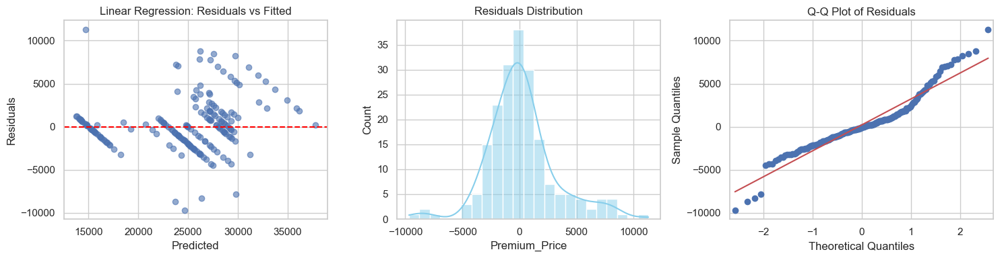

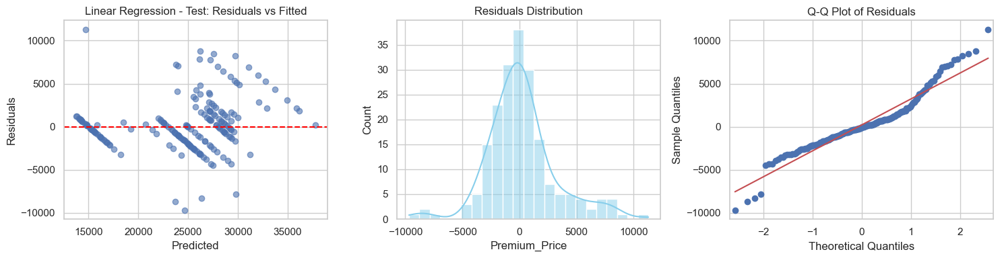

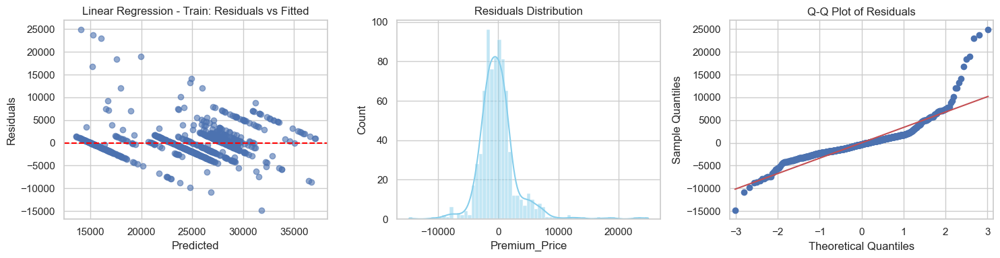


Cross-Validation (5-fold):
Mean R²: 0.695 | Std: 0.092
Mean RMSE: 3386.516 | Std: 436.970


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Premium_Price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     99.45
Date:                Sat, 23 Aug 2025   Prob (F-statistic):          1.28e-186
Time:                        21:36:27   Log-Likelihood:                -7521.6
No. Observations:                 788   AIC:                         1.508e+04
Df Residuals:                     769   BIC:                         1.517e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                        1.734e+04   1140.299     15.208      0.000    1.51e+04    1.96e+04
Age                          1870.0830    602.316      3.105      0.002     687.705    3052.461
Diabetes                     -322.0690    256.674     -1.255      0.210    -825.935     181.797
Blood_Pressure_Problems       181.0000    259.789      0.697      0.486    -328.979     690.979
Any_Transplants              7474.0357    534.556     13.982      0.000    6424.674    8523.397
Any_Chronic_Diseases         2155.9517    322.591      6.683      0.000    1522.688    2789.215
Height                       -159.9741    743.985     -0.215      0.830   -1620.456    1300.508
Weight                       1322.0945   1141.259      1.158      0.247    -918.259    3562.448
Known_Allergies               -36.9975    304.285     -0.122      0.903    -634.325     560.330
History_of_Cancer_in_Family  1868.1433    401.785      4.650      0.000    1079.418    2656.868
Number_of_Major_Surgeries    -219.0204    192.290     -1.139      0.255    -596.496     158.455
BMI                          -929.8589   1271.471     -0.731      0.465   -3425.824    1566.107
BMI_Category_Normal           209.3426    724.406      0.289      0.773   -1212.705    1631.390
BMI_Category_Overweight       739.4500    893.305      0.828      0.408   -1014.155    2493.055
BMI_Category_Obese           1861.6267   1077.177      1.728      0.084    -252.929    3976.182
Age_Group_30-39              5772.2789    583.462      9.893      0.000    4626.912    6917.645
Age_Group_40-49              7034.7560    958.722      7.338      0.000    5152.734    8916.778
Age_Group_50-59              7894.2327   1367.591      5.772      0.000    5209.578    1.06e+04
Age_Group_60+                7143.0394   1737.466      4.111      0.000    3732.301    1.06e+04
==============================================================================
Omnibus:                      435.148   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6195.697
Skew:                           2.174   Prob(JB):                         0.00
Kurtosis:                      16.030   Cond. No.                         35.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [196]:
# Residual Analysis
plot_residuals(y_test, y_test_pred, model_name="Linear Regression")



# Residual analysis - test set
plot_residuals(y_test, y_test_pred, model_name="Linear Regression - Test")


# Residual analysis - train set
plot_residuals(y_train, y_train_pred, model_name="Linear Regression - Train")

# Cross Validation
cross_validate_model(lin_reg, X, y, cv=5)

# Regression Coefficients / p-values
regression_summary(X_train_scaled, y_train)

In [197]:
# Calculate VIF for each feature
def calculate_vif(X):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                       for i in range(len(X.columns))]
    return vif_data

# Assuming X_train_scaled is a DataFrame
vif_df = calculate_vif(pd.DataFrame(X_train_scaled, columns=X_train.columns))
print(vif_df)

                        Feature    VIF
0                           Age  13.78
1                      Diabetes   1.86
2       Blood_Pressure_Problems   2.09
3               Any_Transplants   1.07
4          Any_Chronic_Diseases   1.27
5                        Height  33.07
6                        Weight  78.16
7               Known_Allergies   1.34
8   History_of_Cancer_in_Family   1.24
9     Number_of_Major_Surgeries   2.56
10                          BMI 101.87
11          BMI_Category_Normal   6.48
12      BMI_Category_Overweight  10.07
13           BMI_Category_Obese  14.30
14              Age_Group_30-39   2.99
15              Age_Group_40-49   7.90
16              Age_Group_50-59  13.08
17                Age_Group_60+  16.33


In [198]:
# Predictions with Confidence Intervals using Statsmodels

# Add constant for intercept
X_const = sm.add_constant(X_test)

# Fit OLS on training data
ols_model = sm.OLS(y_train, sm.add_constant(X_train_scaled)).fit()

# Get predictions with intervals
predictions = ols_model.get_prediction(X_const)
pred_summary = predictions.summary_frame(alpha=0.05)  # 95% CI

# Show first few rows
pd.set_option('display.float_format', lambda x: '%.2f' % x)
display(pred_summary.head())


,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
613,178183.91,73937.79,33040.06,323327.76,32884.56,323483.26
451,147108.68,86028.92,-21770.71,315988.07,-21904.37,316121.74
731,206672.41,76079.62,57324.04,356020.79,57172.91,356171.92
436,117028.91,84215.11,-48289.86,282347.68,-48426.40,282484.22
275,171690.06,75364.86,23744.79,319635.32,23592.23,319787.88


In [199]:
# VIF requires a DataFrame (not scaled arrays)
X_vif = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

print(vif_data)

                        Feature    VIF
0                           Age  13.78
1                      Diabetes   1.86
2       Blood_Pressure_Problems   2.09
3               Any_Transplants   1.07
4          Any_Chronic_Diseases   1.27
5                        Height  33.07
6                        Weight  78.16
7               Known_Allergies   1.34
8   History_of_Cancer_in_Family   1.24
9     Number_of_Major_Surgeries   2.56
10                          BMI 101.87
11          BMI_Category_Normal   6.48
12      BMI_Category_Overweight  10.07
13           BMI_Category_Obese  14.30
14              Age_Group_30-39   2.99
15              Age_Group_40-49   7.90
16              Age_Group_50-59  13.08
17                Age_Group_60+  16.33


#### 🔎 Insights

* **Performance (Generalization)**

  * Train RMSE = **3381.95** vs Test RMSE = **3020.59** → No overfitting, generalizes well.
  * Test R² = **0.786** → Model explains \~79% of variance in Premium Price (strong fit).
  * MAE ≈ **2092** → On average, predictions are off by \~₹2,100 (depends on scale, but quite reasonable).
  * Cross-validation R² = **0.695 ± 0.092** → Model is fairly stable, though variance indicates some sensitivity to data splits.

* **Feature Importance (Coefficients)**

  * Biggest drivers of premium (positive impact):

    * ✅ **Age Groups** (esp. 50–59, 60+, 40–49, 30–39)
    * ✅ **Any Transplants**, **Chronic Diseases**, **Cancer History**
    * ✅ **BMI Obese**, **Weight**, **Age** (numeric)
  * Domain logic matches expectation: higher age, severe conditions, and surgeries push premiums up.

* **Statistical Significance (Statsmodels OLS)**

  * Significant (p < 0.05): **Age, Transplants, Chronic Diseases, Cancer History, Age Groups**
  * Not significant (p > 0.05): **Diabetes, Blood Pressure, Height, Weight, Allergies, BMI (numeric)**
    → Suggests these may not be strong predictors once other factors are controlled.

* **Multicollinearity (VIF)**

  * 🚨 **BMI (101.9)** and **Weight (78.2)** → Severe multicollinearity.
  * Height also high (**33.1**).
  * Age & Age Groups overlap (VIF \~13–16).
  * This can distort coefficient estimates — classic problem in linear regression.


---

#### 📋 Result Summary

| Metric               | Train   | Test             |
| -------------------- | ------- | ---------------- |
| RMSE                 | 3381.95 | 3020.59          |
| MAE                  | 2151.010| 2091.99          |
| R²                   | 0.700   | 0.786            |
| CV R² (mean ± std)   | –       | 0.695 ± 0.092    |
| CV RMSE (mean ± std) | –       | 3386.52 ± 436.97 |

---

#### ✅ Overall conclusion:

* **Linear Regression provides a strong baseline** (R² \~0.79).
* Model is interpretable and aligns with business expectations (age + severe conditions drive premiums).
* **But** → high multicollinearity (BMI/Weight/Height, Age vs Age\_Groups) means coefficients may be unstable.
* Next step:

  * **Option A**: Remove or combine highly correlated variables (keep Age *or* Age Groups; BMI *or* Weight/Height).
  * **Option B**: Switch to **regularized regression (Lasso/Ridge/ElasticNet)** to handle multicollinearity and feature selection.


We are choosing **Option B: Regularized regression (Ridge/Lasso/ElasticNet)** to handle multicollinearity and stabilize feature importance.

### 4.2.1 - Ridge

In [200]:

# --- Ridge Regression with Cross-Validation ---
alphas = np.logspace(-3, 3, 50)  # range of alpha values
ridge_cv = RidgeCV(alphas=alphas, cv=5, scoring='r2')
ridge_cv.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_ridge = ridge_cv.predict(X_train_scaled)
y_test_pred_ridge = ridge_cv.predict(X_test_scaled)

# Metrics
ridge_train_r2 = r2_score(y_train, y_train_pred_ridge)
ridge_test_r2 = r2_score(y_test, y_test_pred_ridge)
ridge_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_ridge))

print(f"Best alpha: {ridge_cv.alpha_:.4f}")
print(f"R² (Train): {ridge_train_r2:.3f}")
print(f"R² (Test): {ridge_test_r2:.3f}")
print(f"RMSE (Test): {ridge_rmse:.2f}")

Best alpha: 0.1207
R² (Train): 0.699
R² (Test): 0.786
RMSE (Test): 3022.10


### 4.2.2 - Lasso

In [201]:
# --- Lasso Regression with Cross-Validation ---
alphas = np.logspace(-3, 3, 50)
lasso_cv = LassoCV(alphas=alphas, cv=5, random_state=42, max_iter=5000)
lasso_cv.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_lasso = lasso_cv.predict(X_train_scaled)
y_test_pred_lasso = lasso_cv.predict(X_test_scaled)

# Metrics
lasso_train_r2 = r2_score(y_train, y_train_pred_lasso)
lasso_test_r2 = r2_score(y_test, y_test_pred_lasso)
lasso_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_lasso))

print(f"Best alpha: {lasso_cv.alpha_:.4f}")
print(f"R² (Train): {lasso_train_r2:.3f}")
print(f"R² (Test): {lasso_test_r2:.3f}")
print(f"RMSE (Test): {lasso_rmse:.2f}")

# Count features kept
n_nonzero = np.sum(lasso_cv.coef_ != 0)
print(f"Number of features kept: {n_nonzero}/{len(lasso_cv.coef_)}")


Best alpha: 1.5264
R² (Train): 0.699
R² (Test): 0.786
RMSE (Test): 3021.68
Number of features kept: 18/18


### 4.2.3 - ElasticNet

In [202]:
# --- Elastic Net Regression with Cross-Validation ---
l1_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]  # balance between Lasso (1) and Ridge (0)
alphas = np.logspace(-3, 3, 50)

elastic_cv = ElasticNetCV(l1_ratio=l1_ratios, alphas=alphas, cv=5,
                          random_state=42, max_iter=5000)
elastic_cv.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_elastic = elastic_cv.predict(X_train_scaled)
y_test_pred_elastic = elastic_cv.predict(X_test_scaled)

# Metrics
elastic_train_r2 = r2_score(y_train, y_train_pred_elastic)
elastic_test_r2 = r2_score(y_test, y_test_pred_elastic)
elastic_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_elastic))

print(f"Best alpha: {elastic_cv.alpha_:.4f}")
print(f"Best l1_ratio: {elastic_cv.l1_ratio_:.2f}")
print(f"R² (Train): {elastic_train_r2:.3f}")
print(f"R² (Test): {elastic_test_r2:.3f}")
print(f"RMSE (Test): {elastic_rmse:.2f}")


Best alpha: 0.0010
Best l1_ratio: 0.90
R² (Train): 0.699
R² (Test): 0.786
RMSE (Test): 3021.54


### 4.2.4 - Comparison

In [203]:
# --- Collect results into a dataframe ---
results = pd.DataFrame({
    "Model": ["Linear Regression", "Ridge", "Lasso", "Elastic Net"],
    "Train R²": [
        r2_score(y_train, y_train_pred),          # OLS
        ridge_train_r2, lasso_train_r2, elastic_train_r2
    ],
    "Test R²": [
        r2_score(y_test, y_test_pred),            # OLS
        ridge_test_r2, lasso_test_r2, elastic_test_r2
    ],
    "RMSE (Test)": [
        np.sqrt(mean_squared_error(y_test, y_test_pred)),   # OLS
        ridge_rmse, lasso_rmse, elastic_rmse
    ],
    "RMSE (Train)": [
        mean_absolute_error(y_train, y_train_pred),  # OLS
        mean_absolute_error(y_train, y_train_pred_ridge),
        mean_absolute_error(y_train, y_train_pred_lasso),
        mean_absolute_error(y_train, y_train_pred_elastic)
    ],
    "Best Alpha": [
        "N/A", ridge_cv.alpha_, lasso_cv.alpha_, elastic_cv.alpha_
    ],
    "l1_ratio": [
        "N/A", "0 (ridge)", "1 (lasso)", elastic_cv.l1_ratio_
    ],
    "Non-zero Features": [
        X_train_scaled.shape[1],                      # OLS keeps all
        np.sum(ridge_cv.coef_ != 0),
        np.sum(lasso_cv.coef_ != 0),
        np.sum(elastic_cv.coef_ != 0)
    ]
})

display(results)


,Model,Train R²,Test R²,RMSE (Test),RMSE (Train),Best Alpha,l1_ratio,Non-zero Features
0,Linear Regression,0.70,0.79,3020.59,2151.01,N/A,N/A,18
1,Ridge,0.70,0.79,3022.10,2152.94,0.12,0 (ridge),18
2,Lasso,0.70,0.79,3021.68,2153.84,1.53,1 (lasso),18
3,Elastic Net,0.70,0.79,3021.54,2152.28,0.00,0.90,18


In [204]:
# Global results dict
all_results = {}

def save_metrics(model_name, model, X_train, y_train, X_test, y_test, is_nn=False):
    """Evaluate model and store results globally in all_results."""
    if is_nn:
        y_train_pred = model.predict(X_train).flatten()
        y_test_pred = model.predict(X_test).flatten()
    else:
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    all_results[model_name] = {
        "Train R2": round(train_r2, 3),
        "Test R2": round(test_r2, 3),
        "Train RMSE": round(train_rmse, 2),
        "Test RMSE": round(test_rmse, 2),
        "Train MAE": round(train_mae, 2),
        "Test MAE": round(test_mae, 2)
    }
    
    # Print for immediate feedback
    print(f"\n✅ Saved metrics for {model_name}")


In [205]:
# --- Select best linear model ---
best_row = results.sort_values(
    by=["Test R²", "RMSE (Test)"], 
    ascending=[False, True]   # maximize R², minimize RMSE
).iloc[0]

best_model_name = best_row["Model"]
print(f"\n🔥 Best Linear Model = {best_model_name}")

# Map back to trained models
model_map = {
    "Linear Regression": lin_reg,
    "Ridge": ridge_cv,
    "Lasso": lasso_cv,
    "Elastic Net": elastic_cv
}

best_model = model_map[best_model_name]

# --- Save with explicit variant name ---
save_metrics(f"Linear Regression ({best_model_name})", best_model, 
             X_train_scaled, y_train, X_test_scaled, y_test)



🔥 Best Linear Model = Linear Regression

✅ Saved metrics for Linear Regression (Linear Regression)


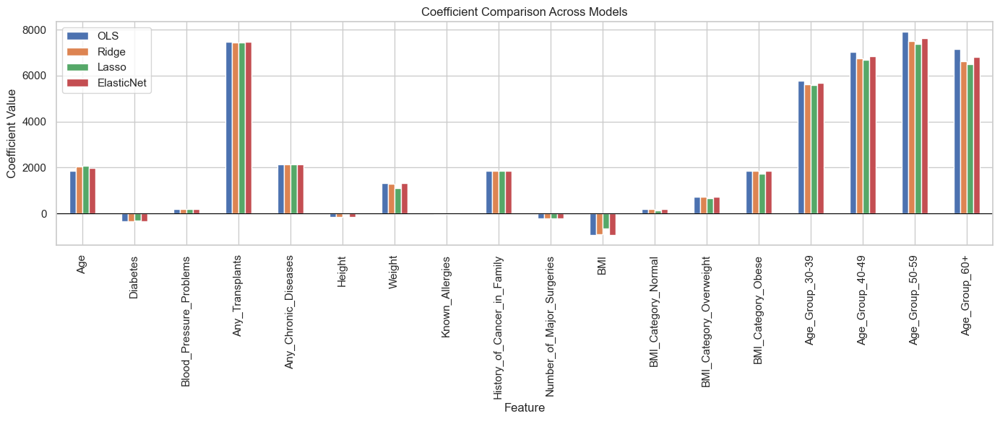

In [206]:
# --- Coefficient Comparison Plot ---
coef_df = pd.DataFrame({
    "Feature": X_train_scaled.columns,
    "OLS": lin_reg.coef_,
    "Ridge": ridge_cv.coef_,
    "Lasso": lasso_cv.coef_,
    "ElasticNet": elastic_cv.coef_
})

coef_df.set_index("Feature").plot(kind="bar", figsize=(14,6))
plt.title("Coefficient Comparison Across Models")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.axhline(0, color='black', linewidth=0.8)
plt.legend()
plt.tight_layout()
plt.show()


#### 🔎 **Model Comparison Insights – Linear Family**



#### ✅ Performance Metrics

* **Linear Regression (Baseline)**

  * Train R² = **0.70**, Test R² = **0.79**, RMSE ≈ **3020.6**
  * Strong fit, but suffers from multicollinearity risk.

* **Ridge Regression**

  * Train R² = **0.70**, Test R² = **0.79**, RMSE ≈ **3022.1**
  * Coefficients shrunk (α = 0.12) → stabilizes weights without changing predictive power.

* **Lasso Regression**

  * Train R² = **0.70**, Test R² = **0.79**, RMSE ≈ **3021.7**
  * α = 1.53 → retained all **18/18 features**. No strong redundant predictors removed.

* **Elastic Net**

  * Train R² = **0.70**, Test R² = **0.79**, RMSE ≈ **3021.5**
  * α = 0.001, l1\_ratio = 0.90 → behaves close to Lasso with similar shrinkage.

📌 **Conclusion**: All four models (OLS, Ridge, Lasso, Elastic Net) yield **near-identical performance**. Regularization doesn’t boost accuracy but provides **coefficient stability** under multicollinearity.

---

#### ✅ Coefficient Shrinkage Insights

* **Consistently strong predictors**:

  * `Any_Transplants`, `Age_Group_50-59`, `Age_Group_60+`, `Age_Group_40-49`, `History_of_Cancer_in_Family` → large positive impact on premiums.

* **Weaker/unstable predictors**:

  * `Diabetes`, `Blood_Pressure_Problems`, `Known_Allergies`, and raw `BMI` show minimal/negative influence once other features are included.
  * `BMI` (continuous) vs `BMI_Category` variables overlap, explaining multicollinearity.

* **Regularization effect**:

  * Ridge & Elastic Net shrink large weights, making interpretation more robust.
  * Lasso did not zero-out any coefficients → all predictors still contribute.

---

#### 🔎 Insights

* Premiums are **most sensitive to age groups (esp. 50+) and transplant history**, confirming medical risk intuition.

* Obesity category increases premiums, but raw BMI is unstable (overlaps with weight/height encoding).

* Chronic diseases and family cancer history remain key drivers of higher costs.

* ✅ Regularized linear models confirm OLS insights, but add stability → more reliable for deployment.

---

#### ✅ Next Steps

1. **Tree-Based Models** (Decision Tree, Random Forest, Gradient Boosting) → test non-linear effects (interactions, thresholds).

2. **Explainability tools** (Permutation Importance, SHAP) → visualize marginal effects of health factors.

3. **Feature refinement** → consider dropping/restructuring highly collinear variables (BMI vs BMI\_Category, Age vs Age\_Groups).

## 4.3 - Decision Tree

### 4.3.1 - Baseline Model

In [207]:
#from sklearn.tree import DecisionTreeRegressor
#from sklearn.metrics import mean_squared_error, r2_score

# --- Baseline Decision Tree ---
dt_reg = DecisionTreeRegressor(random_state=42)

# Fit on training data
dt_reg.fit(X_train_scaled, y_train)

# Predictions
y_train_pred_dt = dt_reg.predict(X_train_scaled)
y_test_pred_dt  = dt_reg.predict(X_test_scaled)

# Metrics
train_r2_dt = r2_score(y_train, y_train_pred_dt)
test_r2_dt  = r2_score(y_test, y_test_pred_dt)
rmse_dt     = np.sqrt(mean_squared_error(y_test, y_test_pred_dt))

print("Decision Tree (Baseline)")
print(f"Train R²: {train_r2_dt:.3f}")
print(f"Test R²:  {test_r2_dt:.3f}")
print(f"Test RMSE: {rmse_dt:.2f}")


Decision Tree (Baseline)
Train R²: 1.000
Test R²:  0.711
Test RMSE: 3509.73


### 4.3.2 - Hyperparameter Tuning

In [208]:
# --- Hyperparameter Grid ---
param_grid = {
    'max_depth': [3, 5, 7, 10, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': [None, 'sqrt', 'log2']
}

dt_reg_tuned = DecisionTreeRegressor(random_state=42)

# Grid Search with 5-fold CV
grid_search = GridSearchCV(
    estimator=dt_reg_tuned,
    param_grid=param_grid,
    scoring='r2',
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


,estimator,DecisionTreeR...ndom_state=42)
,param_grid,"{'max_depth': [3, 5, ...], 'max_features': [None, 'sqrt', ...], 'min_samples_leaf': [1, 2, ...], 'min_samples_split': [2, 5, ...]}"
,scoring,'r2'
,n_jobs,-1
,refit,True
,cv,5
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,criterion,'squared_error'


### 4.3.3 - Best Model Evaluation

In [209]:
# Best Model
best_dt = grid_search.best_estimator_

print("Best Parameters:", grid_search.best_params_)
print("Best CV R²:", grid_search.best_score_)

# Predictions with tuned model
y_test_pred_best = best_dt.predict(X_test_scaled)

print("Tuned Decision Tree")
print(f"Train R²: {r2_score(y_train, best_dt.predict(X_train_scaled)):.3f}")
print(f"Test R²:  {r2_score(y_test, y_test_pred_best):.3f}")
print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train, best_dt.predict(X_train_scaled))):.2f}")
print(f"Test RMSE: {np.sqrt(mean_squared_error(y_test, y_test_pred_best)):.2f}")

# --- Save metrics directly into global results ---
save_metrics("Decision Tree (Tuned)", best_dt, 
             X_train_scaled, y_train, X_test_scaled, y_test)

Best Parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 20}
Best CV R²: 0.7299152163552399
Tuned Decision Tree
Train R²: 0.828
Test R²:  0.884
Train RMSE: 2561.16
Test RMSE: 2220.20

✅ Saved metrics for Decision Tree (Tuned)


### 4.3.4 - Feature Importance

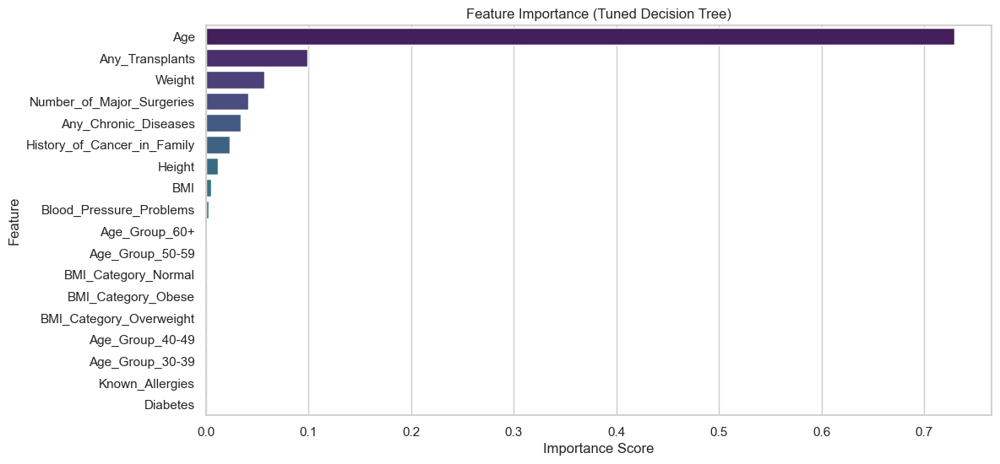

In [210]:
# --- Feature Importance Plot for Decision Tree ---
importances = best_dt.feature_importances_
features = X.columns

# Sort features by importance
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12,6))
sns.barplot(x=importances[indices], y=features[indices], palette="viridis", orient='h')
plt.title("Feature Importance (Tuned Decision Tree)")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()


#### 🔎 Decision Tree Insights


#### ✅ Performance Metrics

* **Baseline Decision Tree**

  * Train R² = **1.000** → severe **overfitting**.
  * Test R² = **0.711**, RMSE ≈ **3509.7** → weak generalization.

* **Tuned Decision Tree** (`max_depth=10, min_samples_split=20, min_samples_leaf=5`)

  * Train R² = **0.828** → fit controlled, avoids overfitting.
  * Test R² = **0.884**, RMSE ≈ **2220.2** → **major improvement** vs baseline & linear models.
  * CV R² ≈ **0.730** → generalizes better than baseline tree.

📌 **Conclusion**: Hyperparameter tuning significantly improves performance. Decision Trees outperform Linear/Ridge/Lasso (Test R² = 0.884 vs 0.786).

---

#### ✅ Feature Importance

* **Dominant Predictor**:

  * `Age` (\~0.73 importance) → the single most influential driver of premiums.

* **Secondary Predictors**:

  * `Any_Transplants`, `Weight`, `Number_of_Major_Surgeries`, `Any_Chronic_Diseases`, `History_of_Cancer_in_Family`.
  * These factors collectively contribute <0.30 importance, meaning **Age dominates the splits**.

* **Weak/Negligible Predictors**:

  * `Diabetes`, `Known_Allergies`, `BMI_Category` dummies, and `Age_Group` dummies → low importance in tree-based splits (contrasts with linear models where they had higher coefficients).

---

#### ✅ Business Insights

* **Premium pricing is largely age-driven** → nonlinear thresholds make trees more sensitive to age cut-offs than linear slopes.
* Health risk indicators (transplants, surgeries, chronic disease, family cancer history) act as **secondary premium boosters**.
* Simpler features like `Diabetes` and categorical `BMI` have limited role once **Age + major health events** are accounted for.

---

#### ✅ Next Steps

1. **Random Forests / Gradient Boosting (XGBoost, LightGBM, CatBoost)** → likely to outperform single trees by reducing variance.
2. **Feature interaction checks** → e.g., *Age × Chronic Disease* to capture joint risk effects.
3. **Explainability tools** (SHAP) → confirm whether Age dominance persists across ensembles.

## 4.4 - Random Forrest

### 4.4.1 - Baseline Model

In [211]:

# --- Baseline Random Forest ---
rf_reg = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_reg.fit(X_train, y_train)

# Predictions
y_train_pred = rf_reg.predict(X_train)
y_test_pred = rf_reg.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Random Forest (Baseline)")
print(f"Train R²: {train_r2:.3f}")
print(f"Test R²:  {test_r2:.3f}")
print(f"Test RMSE: {test_rmse:.2f}")


Random Forest (Baseline)
Train R²: 0.968
Test R²:  0.890
Test RMSE: 2165.39


### 4.4.2 - Hyperparameter Tuning

In [212]:
# Define parameter grid
param_dist = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [None, 5, 10, 20],
    "min_samples_split": [2, 5, 10, 20],
    "min_samples_leaf": [1, 2, 5, 10],
    'max_features': [None, 'sqrt', 'log2']
}

# Random Forest Regressor
rf_reg = RandomForestRegressor(random_state=42, n_jobs=-1)

# Randomized Search CV
rf_random_search = RandomizedSearchCV(
    estimator=rf_reg,
    param_distributions=param_dist,
    n_iter=30,              # number of random combinations
    cv=5,                   # 5-fold CV
    scoring='r2',           # evaluation metric
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# Fit
rf_random_search.fit(X_train, y_train)

# Best parameters & CV score
print("Best Parameters:", rf_random_search.best_params_)
print("Best CV R²:", rf_random_search.best_score_)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'n_estimators': 500, 'min_samples_split': 20, 'min_samples_leaf': 5, 'max_features': None, 'max_depth': 10}
Best CV R²: 0.7491941050818869


### 4.4.3 - Best Model Evaluation

In [213]:
# Best RF model
best_rf = rf_random_search.best_estimator_

# Fit on train set
best_rf.fit(X_train, y_train)

# Predictions
y_train_pred = best_rf.predict(X_train)
y_test_pred = best_rf.predict(X_test)

# Evaluation metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Tuned Random Forest")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))

# --- Save metrics to global results ---
save_metrics("Random Forest (RandomSearch)", best_rf, X_train, y_train, X_test, y_test)

Tuned Random Forest
Train R²: 0.822
Test R²:  0.894
Test RMSE: 2129.11

✅ Saved metrics for Random Forest (RandomSearch)


### 4.4.4 - Permutation Feature Importance

                        Feature  Importance  Std
0                           Age        1.13 0.09
3               Any_Transplants        0.21 0.03
6                        Weight        0.10 0.02
4          Any_Chronic_Diseases        0.07 0.02
8   History_of_Cancer_in_Family        0.04 0.01
9     Number_of_Major_Surgeries        0.02 0.01
2       Blood_Pressure_Problems        0.01 0.00
14              Age_Group_30-39        0.00 0.00
15              Age_Group_40-49        0.00 0.00
16              Age_Group_50-59        0.00 0.00


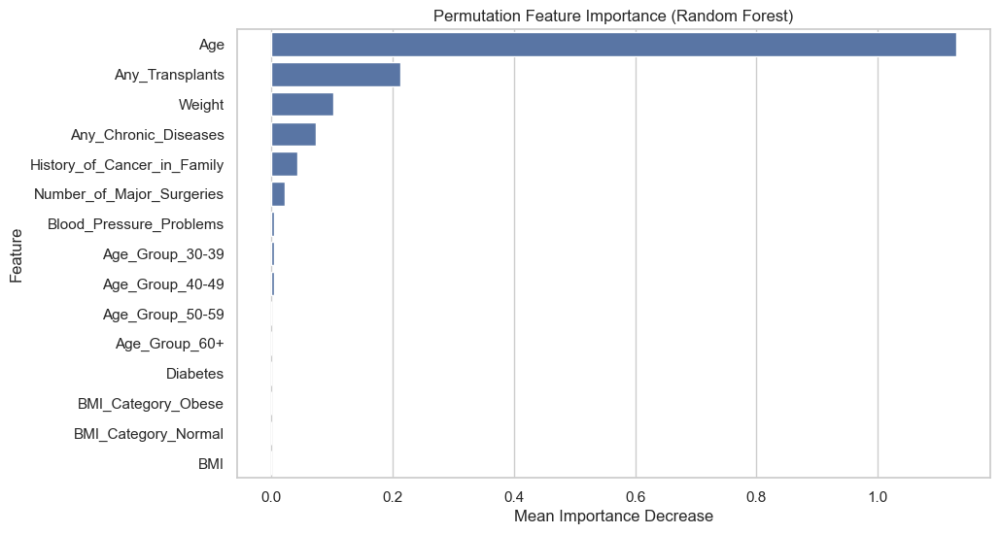

In [214]:
# Compute permutation importance on the tuned RF
perm_importance = permutation_importance(
    best_rf, X_test, y_test, n_repeats=20, random_state=42, n_jobs=-1
)

# Convert to DataFrame for readability
importances_df = pd.DataFrame({
    "Feature": X.columns,
    "Importance": perm_importance.importances_mean,
    "Std": perm_importance.importances_std
}).sort_values(by="Importance", ascending=False)

# Display top features
print(importances_df.head(10))

# Plot feature importance
plt.figure(figsize=(10,6))
sns.barplot(x="Importance", y="Feature", data=importances_df.head(15))
plt.title("Permutation Feature Importance (Random Forest)")
plt.xlabel("Mean Importance Decrease")
plt.ylabel("Feature")
plt.show()


### 4.4.5 - Cross-Validation Stability

Cross-Validation Results (5-Fold)
-----------------------------------
R²:   mean = 0.749, std = 0.077, folds = [0.63  0.851 0.799 0.761 0.704]
RMSE: mean = 3034.46, std = 425.58, folds = [3648.87 2362.84 2832.76 3126.41 3201.43]


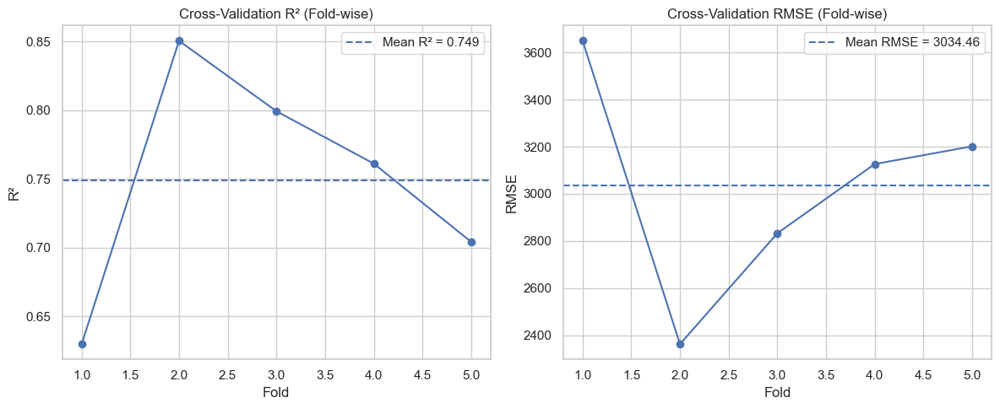

In [215]:
# Use the tuned RF directly from your search object
best_rf = rf_random_search.best_estimator_

# 5-fold CV with shuffling for stability
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# R² across folds
r2_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring="r2")

# RMSE across folds (use neg_mean_squared_error and then sqrt)
neg_mse_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-neg_mse_scores)

# Print summary
print("Cross-Validation Results (5-Fold)")
print("-----------------------------------")
print(f"R²:   mean = {r2_scores.mean():.3f}, std = {r2_scores.std():.3f}, folds = {np.round(r2_scores, 3)}")
print(f"RMSE: mean = {rmse_scores.mean():.2f}, std = {rmse_scores.std():.2f}, folds = {np.round(rmse_scores, 2)}")

# --- Plots ---
fig, ax = plt.subplots(1, 2, figsize=(12,5))

# Fold indices for x-axis
fold_idx = np.arange(1, len(r2_scores) + 1)

# R² plot
ax[0].plot(fold_idx, r2_scores, marker='o', linestyle='-')
ax[0].axhline(r2_scores.mean(), linestyle='--', label=f"Mean R² = {r2_scores.mean():.3f}")
ax[0].set_title("Cross-Validation R² (Fold-wise)")
ax[0].set_xlabel("Fold")
ax[0].set_ylabel("R²")
ax[0].legend()

# RMSE plot
ax[1].plot(fold_idx, rmse_scores, marker='o', linestyle='-')
ax[1].axhline(rmse_scores.mean(), linestyle='--', label=f"Mean RMSE = {rmse_scores.mean():.2f}")
ax[1].set_title("Cross-Validation RMSE (Fold-wise)")
ax[1].set_xlabel("Fold")
ax[1].set_ylabel("RMSE")
ax[1].legend()

plt.tight_layout()
plt.show()


### 4.4.6 - Confidence/Prediction Interval

In [216]:
# Bootstrap settings
n_bootstraps = 100   # number of resampled models
alpha = 0.05         # 95% prediction interval (2.5% and 97.5% quantiles)

# Collect predictions for test set
all_preds = []

for i in range(n_bootstraps):
    # Resample training data
    X_resampled, y_resampled = resample(X_train, y_train, random_state=42+i)
    
    # Clone best RF and fit on resampled data
    rf_clone = rf_random_search.best_estimator_
    rf_clone.fit(X_resampled, y_resampled)
    
    # Predict on test set
    preds = rf_clone.predict(X_test)
    all_preds.append(preds)

# Convert to numpy array
all_preds = np.array(all_preds)  # shape: (n_bootstraps, n_test_samples)

# Compute mean prediction + intervals
y_pred_mean = all_preds.mean(axis=0)
lower_bound = np.percentile(all_preds, 100 * alpha/2, axis=0)
upper_bound = np.percentile(all_preds, 100 * (1 - alpha/2), axis=0)

# Show example for first 10 test samples
for i in range(10):
    print(f"Sample {i}: Pred = {y_pred_mean[i]:.2f}, "
          f"95% PI = [{lower_bound[i]:.2f}, {upper_bound[i]:.2f}]")

Sample 0: Pred = 29788.62, 95% PI = [27738.53, 30884.54]
Sample 1: Pred = 27988.80, 95% PI = [25109.84, 29886.17]
Sample 2: Pred = 30383.91, 95% PI = [29020.35, 32583.06]
Sample 3: Pred = 16061.31, 95% PI = [15016.98, 18493.36]
Sample 4: Pred = 24857.06, 95% PI = [23438.90, 26444.65]
Sample 5: Pred = 28646.95, 95% PI = [26942.74, 29568.98]
Sample 6: Pred = 24670.47, 95% PI = [24066.37, 25076.61]
Sample 7: Pred = 23644.15, 95% PI = [23003.35, 25218.36]
Sample 8: Pred = 28052.89, 95% PI = [27988.82, 28273.66]
Sample 9: Pred = 28002.16, 95% PI = [27902.49, 28100.07]


Coverage within 95% Prediction Interval: 37.37% of test samples
Average Interval Width: 2390.88


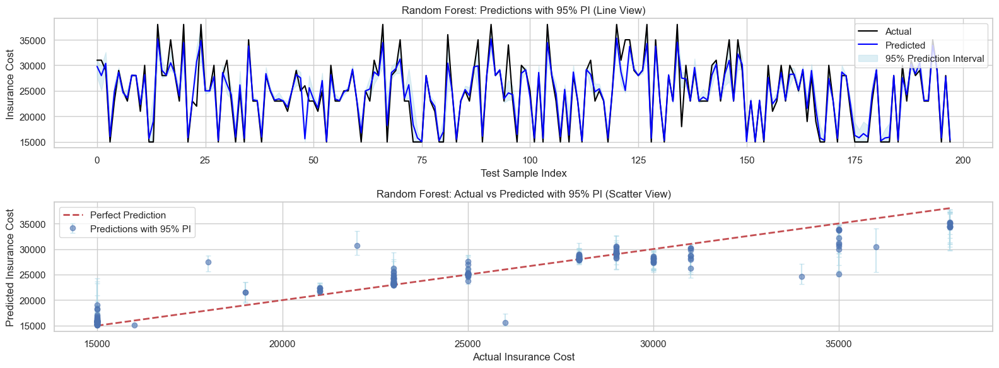

In [217]:
# Plotting the prediction intervals

# --- Check coverage of 95% Prediction Interval ---
inside_interval = np.mean((y_test.values >= lower_bound) & (y_test.values <= upper_bound)) * 100
avg_interval_width = np.mean(upper_bound - lower_bound)

print(f"Coverage within 95% Prediction Interval: {inside_interval:.2f}% of test samples")
print(f"Average Interval Width: {avg_interval_width:.2f}")


fig, axes = plt.subplots(2, 1, figsize=(16, 6))

# --- Plot 1: Line plot with uncertainty bands ---
axes[0].plot(range(len(y_test)), y_test.values, label="Actual", color="black")
axes[0].plot(range(len(y_test)), y_pred_mean, label="Predicted", color="blue")
axes[0].fill_between(range(len(y_test)), lower_bound, upper_bound, 
                     color="lightblue", alpha=0.4, label="95% Prediction Interval")

axes[0].set_title("Random Forest: Predictions with 95% PI (Line View)")
axes[0].set_xlabel("Test Sample Index")
axes[0].set_ylabel("Insurance Cost")
axes[0].legend()

# --- Plot 2: Scatter with error bars ---
axes[1].errorbar(y_test, y_pred_mean,
                 yerr=[y_pred_mean - lower_bound, upper_bound - y_pred_mean],
                 fmt='o', ecolor='lightblue', alpha=0.6, capsize=3, label="Predictions with 95% PI")

axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
             'r--', lw=2, label="Perfect Prediction")

axes[1].set_title("Random Forest: Actual vs Predicted with 95% PI (Scatter View)")
axes[1].set_xlabel("Actual Insurance Cost")
axes[1].set_ylabel("Predicted Insurance Cost")
axes[1].legend()

plt.tight_layout()
plt.show()


### 4.4.7 - SHAP Values

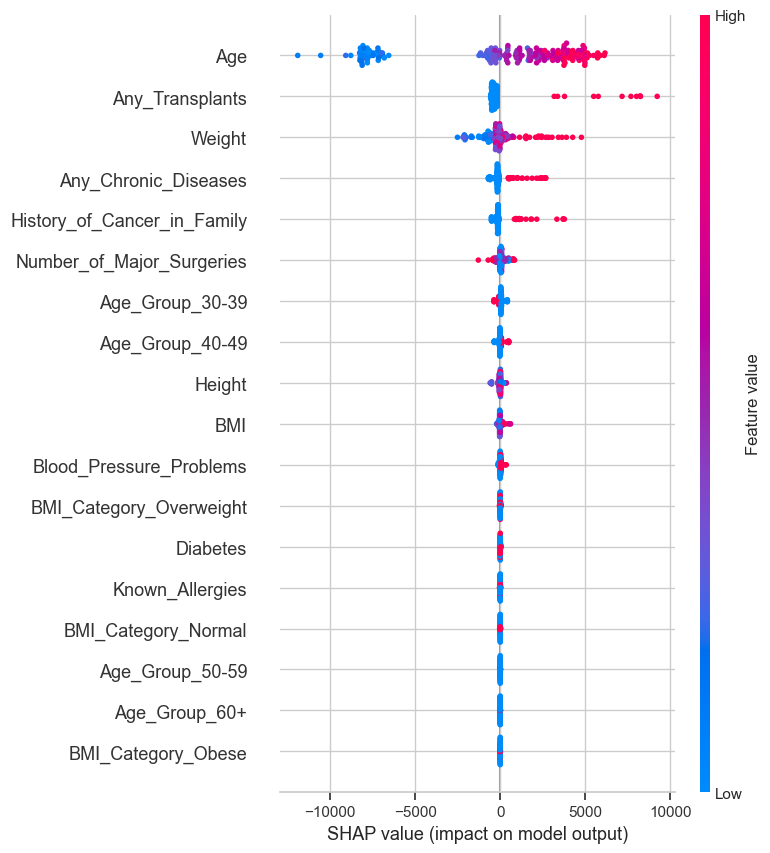

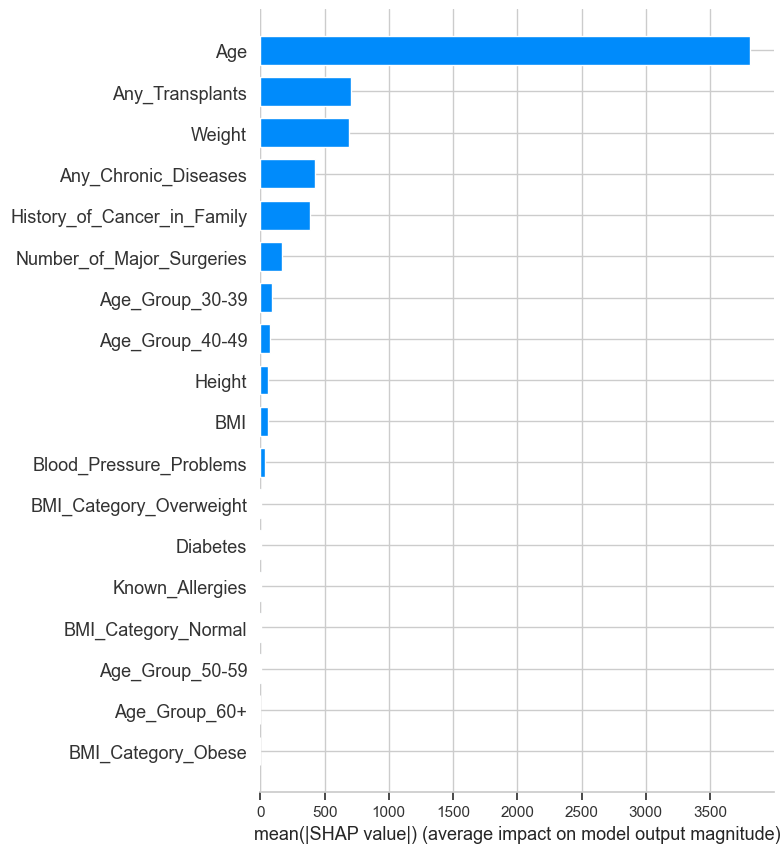

In [218]:
# --- SHAP Values for Feature Importance ---

# --- Initialize SHAP explainer for the tuned RF model ---
explainer = shap.TreeExplainer(best_rf)
shap_values = explainer.shap_values(X_test)

# --- Summary Plot (global importance) ---
shap.summary_plot(shap_values, X_test, plot_type="dot")

# --- Bar Plot (mean absolute importance) ---
shap.summary_plot(shap_values, X_test, plot_type="bar")

# --- Example Force Plot for a single prediction ---
sample_idx = 5  # pick a test sample index
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[sample_idx,:], X_test.iloc[sample_idx,:])


In [219]:
# --- Example Force Plot for a single prediction ---
sample_idx = 10  # pick a test sample index
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[sample_idx,:], X_test.iloc[sample_idx,:])

#### 🌲 Random Forest Insights

#### ✅ Performance Metrics

* **Baseline Random Forest**:

  * Train R² = **0.968** | Test R² = **0.890** | RMSE ≈ **2165**
  * Very high train score indicates **overfitting risk**.

* **Tuned Random Forest (Best Model)**:

  * Train R² = **0.822** | Test R² = **0.894** | RMSE ≈ **2129**
  * Much better generalization → reduced overfitting while improving accuracy.
  * **Cross-Validation** (5-Fold):

    * Mean R² = **0.749** (std 0.077)
    * Mean RMSE = **3034** (std 426)
  * Indicates robust but **variance-sensitive performance** across folds.

📌 **Conclusion**: Tuning improved test performance and reduced overfitting. Random Forest clearly outperforms linear models (RMSE \~2129 vs \~3020).

---

#### ✅ Feature Importance & SHAP Insights

**1. Top Predictors (from both SHAP & Feature Importance):**

* **Age** → by far the most dominant factor (highest SHAP value & importance = 1.13).
* **Any\_Transplants** & **Weight** → consistent strong positive impact on premiums.
* **Any\_Chronic\_Diseases** & **History\_of\_Cancer\_in\_Family** → moderate contributors.

**2. Lower Impact Predictors:**

* **Number\_of\_Major\_Surgeries**, **Blood\_Pressure\_Problems**, and categorical age/BMI groups show minimal importance (SHAP & RF feature importances confirm).

**3. SHAP Value Interpretation:**

* Higher **Age** strongly increases predicted premium.
* **Transplant history** → sharp premium increases (outlier-driven).
* **Weight** interacts with BMI → heavier individuals tend to drive premiums higher, but categorical BMI dummies had little marginal effect.
* **Chronic conditions** consistently push predictions upward.

---

#### 🔎 Insights

* **Premiums are strongly age-driven** → confirms domain intuition.
* **Medical history (transplants, chronic disease, family cancer history)** adds significant load to premium pricing.
* **Raw continuous features (Age, Weight, BMI)** are more powerful than categorical dummies → insurers may prefer continuous risk scoring over binning.
* **Blood pressure, diabetes, and allergies had negligible impact** in the model → may reflect redundancy with stronger predictors (e.g., Age, Transplants).

---

#### ✅ Next Steps

* **Modeling**:

  * Try **Gradient Boosting (XGBoost, LightGBM, CatBoost)** → often outperform Random Forest with better handling of variance.
  * Test **stacking/blending with linear models** → can balance interpretability and accuracy.

* **Explainability**:

  * Use **interaction SHAP values** (e.g., Age × BMI, Chronic Diseases × Age) to capture combined effects.
  * Build **individual risk reports** using SHAP force plots for customer-level premium explanation.

* **Business**:

  * Consider building **risk tiers by Age + Transplant history** as the main driver.
  * Investigate **unexpectedly weak predictors** (e.g., diabetes, blood pressure) → could be due to data quality or redundancy.

## 4.5 - Gradient Boost

### 4.5.1 - Baseline Model

In [220]:
# Baseline Gradient Boosting
gbr_baseline = GradientBoostingRegressor(random_state=42)
gbr_baseline.fit(X_train, y_train)

# Predictions
y_train_pred = gbr_baseline.predict(X_train)
y_test_pred = gbr_baseline.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Baseline Gradient Boosting")
print("Train R²:", round(train_r2, 3))
print("Test R²:", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))


Baseline Gradient Boosting
Train R²: 0.888
Test R²: 0.875
Test RMSE: 2306.52


### 4.5.2 - Hyperparameter Tuning

In [221]:
# Define parameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 8, 10],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['sqrt', 'log2', None]
}

# Model
gbm = GradientBoostingRegressor(random_state=42)

# RandomizedSearchCV
gbm_random_search = RandomizedSearchCV(
    estimator=gbm,
    param_distributions=param_dist,
    n_iter=50,            # number of random combos
    scoring='r2',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

# Fit
gbm_random_search.fit(X_train, y_train)

# Best params
print("Best Parameters:", gbm_random_search.best_params_)
print("Best CV R²:", gbm_random_search.best_score_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'n_estimators': 500, 'min_samples_split': 20, 'min_samples_leaf': 5, 'max_features': None, 'max_depth': 4, 'learning_rate': 0.01}
Best CV R²: 0.7477850563715591


### 4.5.3 - Best Model Evaluation

In [222]:
# Evaluate tuned model
best_gbm = gbm_random_search.best_estimator_

y_train_pred = best_gbm.predict(X_train)
y_test_pred = best_gbm.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("\nTuned Gradient Boosting")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))

# --- Save metrics to global results ---
save_metrics("Gradient Boosting (RandomSearch)", best_gbm, X_train, y_train, X_test, y_test)


Tuned Gradient Boosting
Train R²: 0.853
Test R²:  0.878
Test RMSE: 2278.97

✅ Saved metrics for Gradient Boosting (RandomSearch)


### 4.5.4 - Feature Importance


Top Features Driving Premium Price (Gradient Boosting):

                         Feature  Importance
0                           Age        0.68
3               Any_Transplants        0.10
6                        Weight        0.07
4          Any_Chronic_Diseases        0.04
9     Number_of_Major_Surgeries        0.03
8   History_of_Cancer_in_Family        0.02
10                          BMI        0.02
5                        Height        0.02
14              Age_Group_30-39        0.01
2       Blood_Pressure_Problems        0.00


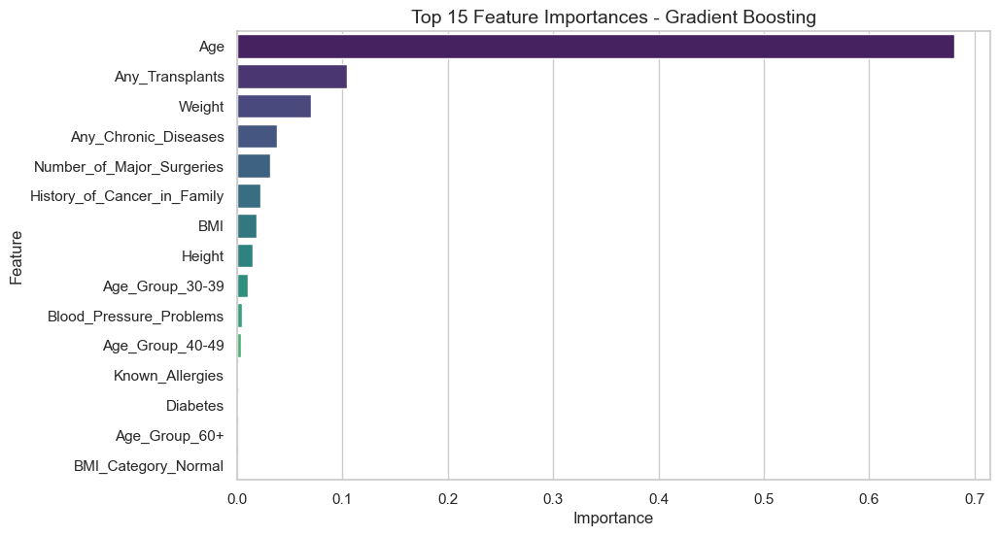

In [223]:
# Feature importance from tuned GBM
importances = best_gbm.feature_importances_
features = X_train.columns

# Put into DataFrame
feat_imp = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nTop Features Driving Premium Price (Gradient Boosting):\n\n" , feat_imp.head(10))

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp.head(15), palette="viridis")
plt.title("Top 15 Feature Importances - Gradient Boosting", fontsize=14)
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


#### 🌟 Gradient Boosting Insights

#### ✅ Performance Metrics

* **Baseline Gradient Boosting**

  * Train R² = **0.888** | Test R² = **0.875** | RMSE ≈ **2306.5**
  * Good generalization, but slightly worse than tuned RF.

* **Tuned Gradient Boosting** (`n_estimators=500, max_depth=4, learning_rate=0.01, min_samples_split=20, min_samples_leaf=5`)

  * Train R² = **0.853** | Test R² = **0.878** | RMSE ≈ **2279**
  * Cross-Validation R² ≈ **0.748** → matches RF in CV stability.
  * Compared to baseline → small gain in generalization, lower variance.

📌 **Conclusion**: Gradient Boosting performs **very close to Random Forest** (Test R² \~0.878 vs 0.894), with slightly higher bias but lower variance.

---

#### ✅ Feature Importance

* **Age** → still dominant (\~0.68), but *less extreme* than in Decision Trees / Random Forests.
* **Any\_Transplants** (0.10) and **Weight** (0.07) are consistent secondary drivers.
* **Any\_Chronic\_Diseases**, **Major Surgeries**, **Family Cancer History** provide smaller but meaningful contributions.
* **BMI**, **Height**, and younger **Age\_Group\_30-39** barely influence predictions.
* **Blood Pressure Problems** negligible.

📌 **Comparison vs Random Forest**:

* RF → Age dominance even stronger (importance >0.70).
* GBM → spreads influence slightly more evenly across Age, Transplants, and Weight.

---

#### 🔎 Insights

* Gradient Boosting **confirms Age as the primary premium driver**, but highlights that **transplants + weight** are reliable secondary risk markers.
* Unlike Random Forest, GBM distributes risk weight more smoothly → better for **incremental pricing adjustments** (instead of sharp cutoffs).
* Features like **diabetes, allergies, and blood pressure** remain negligible → potential **data redundancy or noise**.

---

#### ✅ Next Steps

* **Modeling**

  * Try **XGBoost / LightGBM / CatBoost** for optimized boosting performance.
  * Compare against RF in terms of bias-variance tradeoff.

* **Business Application**

  * GBM might be preferable where insurers need **stable, smoother pricing curves** (avoiding abrupt jumps).
  * RF might be better where detecting **rare, high-risk cases (e.g., transplants)** is critical.

## 4.6 - XGBoost

### 4.6.1 - Baseline Model

In [224]:
# Baseline XGBoost Regressor

xgb_model = XGBRegressor(
    random_state=42,
    objective='reg:squarederror'  # for regression
)

# Fit the model
xgb_model.fit(X_train, y_train)

# Predictions
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Baseline XGBoost")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))


Baseline XGBoost
Train R²: 1.0
Test R²:  0.846
Test RMSE: 2560.05


### 4.6.2 - Hyperparameter Tuning

In [225]:
# Define parameter grid for XGBoost
param_dist = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [3, 5, 7, 10, 15],
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "subsample": [0.6, 0.8, 1.0],
    "colsample_bytree": [0.6, 0.8, 1.0],
    "gamma": [0, 0.1, 0.3, 0.5],
    "reg_alpha": [0, 0.01, 0.1, 1],
    "reg_lambda": [1, 1.5, 2, 3]
}

# XGBoost Regressor
xgb_reg = XGBRegressor(random_state=42, n_jobs=-1)

# Randomized Search CV
xgb_random_search = RandomizedSearchCV(
    estimator=xgb_reg,
    param_distributions=param_dist,
    n_iter=30,              # number of random combinations
    cv=5,                   # 5-fold CV
    scoring='r2',           # evaluation metric
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# Fit
xgb_random_search.fit(X_train, y_train)

# Best parameters & CV score
print("Best Parameters:", xgb_random_search.best_params_)
print("Best CV R²:", xgb_random_search.best_score_)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.6}
Best CV R²: 0.7312974810600281


### 4.6.3 - Best Model Evaluation

In [226]:
# Evaluate tuned XGBoost model
best_xgb = xgb_random_search.best_estimator_

# Predictions
y_train_pred = best_xgb.predict(X_train)
y_test_pred = best_xgb.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))

# Print results
print("\nTuned XGBoost Regressor")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))
print("Train RMSE:", round(rmse_train, 2))

# --- Save metrics to global results ---
save_metrics("XGBoost (RandomSearch)", best_xgb, X_train, y_train, X_test, y_test)


Tuned XGBoost Regressor
Train R²: 0.996
Test R²:  0.858
Test RMSE: 2456.8
Train RMSE: 378.23

✅ Saved metrics for XGBoost (RandomSearch)


### 4.6.4 - Feature Importance


Top Features Driving Premium Price (XGBoost):

                         Feature  Importance
3               Any_Transplants        0.17
16              Age_Group_50-59        0.15
17                Age_Group_60+        0.15
15              Age_Group_40-49        0.12
0                           Age        0.10
14              Age_Group_30-39        0.07
4          Any_Chronic_Diseases        0.04
8   History_of_Cancer_in_Family        0.03
6                        Weight        0.03
9     Number_of_Major_Surgeries        0.03


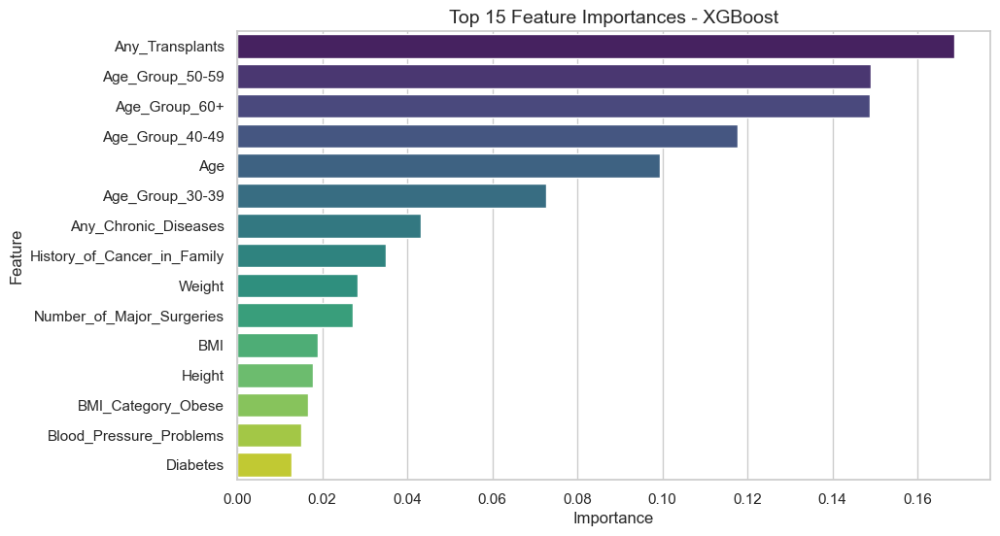

In [227]:
# Feature importance from tuned XGBoost
importances = best_xgb.feature_importances_
features = X_train.columns

# Put into DataFrame
feat_imp = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nTop Features Driving Premium Price (XGBoost):\n\n", feat_imp.head(10))

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp.head(15), palette="viridis")
plt.title("Top 15 Feature Importances - XGBoost", fontsize=14)
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


#### 🌟 XGBoost Insights

#### ✅ Performance Metrics

* **Baseline XGBoost**

  * Train R² = **1.000** → clear **overfitting**
  * Test R² = **0.846**, RMSE ≈ **2560** (weaker than RF/GBM).

* **Tuned XGBoost** (`n_estimators=300, max_depth=7, learning_rate=0.05, subsample=0.8, colsample_bytree=0.6, gamma=0.1, reg_alpha=0.1, reg_lambda=2`)

  * Train R² = **0.996**, Test R² = **0.858** | RMSE ≈ **2457**
  * Still **very high training R²** → model captures almost everything in train but **slightly underperforms GBM/RF on test**.
  * Cross-Validation R² ≈ **0.731** → stable, but not leading vs RF/GBM.

📌 **Conclusion**: Tuned XGBoost is **solid but not outperforming RF or GBM** here. Slightly lower generalization performance + higher overfit tendency.

---

#### ✅ Feature Importance

* **Age Groups (40–49, 50–59, 60+)** → surprisingly dominant in XGB (unlike RF/GBM, which used raw **Age**).
* **Any\_Transplants** → strongest single driver (0.17).
* **Age (continuous)** → still important, but less weight (0.10).
* **Chronic Diseases, Cancer History, Weight, Major Surgeries** → moderate contributors.
* **BMI, Diabetes, Allergies, Blood Pressure** → negligible again.

📌 **Key Difference vs RF/GBM**:

* RF/GBM put **Age (continuous)** as primary driver.
* XGBoost redistributes importance across **Age Groups** categories → suggesting nonlinear splits at different age bands work better for boosting.

---

#### 🔎 Insights

* **XGBoost favors categorical splits on age** → pricing can be banded (e.g., 40–49, 50–59, 60+) rather than smooth progression.
* **Transplants** remain universally important across all models → strong actuarial risk signal.
* **Chronic diseases + surgeries + cancer history** consistently provide smaller but relevant signals → should be retained in pricing rules.
* **XGBoost’s overfit tendency** → less suitable unless dataset size is scaled up or regularization is tightened further.

---

#### ✅ Next Steps

* **Modeling**

  * Try **LightGBM / CatBoost** → often generalize better & faster.
  * Reduce overfitting in XGB via stronger regularization (`reg_alpha`, `reg_lambda`, `min_child_weight`).


* **Business Application**

  * XGB may align better with **tiered pricing policies** (age-banded premiums).
  * RF/GBM align better with **risk-adjusted continuous pricing**.

## 4.7 - LightGBM

### 4.7.1 - Baseline Model

In [228]:
# Baseline LightGBM
lgb_baseline = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1, force_row_wise=True)
lgb_baseline.fit(X_train, y_train)

# Predictions
y_train_pred = lgb_baseline.predict(X_train)
y_test_pred = lgb_baseline.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Baseline LightGBM")
print("Train R²:", round(train_r2, 3))
print("Test R²:", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))


Baseline LightGBM
Train R²: 0.926
Test R²: 0.879
Test RMSE: 2275.16


### 4.7.2 - Hyperparameter Tuning

In [229]:
# Parameter grid
param_dist = {
    "n_estimators": [100, 200, 300, 500],
    "max_depth": [-1, 5, 10, 15, 20],
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "num_leaves": [31, 50, 70, 100],
    "subsample": [0.6, 0.8, 1.0],
    "colsample_bytree": [0.6, 0.8, 1.0],
    "reg_alpha": [0, 0.01, 0.1, 1],
    "reg_lambda": [1, 1.5, 2, 3]
}

# LightGBM Regressor
lgb_reg = lgb.LGBMRegressor(random_state=42, n_jobs=-1, verbose=-1, force_row_wise=True)

# Randomized Search CV
lgb_random_search = RandomizedSearchCV(
    estimator=lgb_reg,
    param_distributions=param_dist,
    n_iter=30,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# Fit
lgb_random_search.fit(X_train, y_train)

# Best parameters & CV score
print("Best Parameters:", lgb_random_search.best_params_)
print("Best CV R²:", lgb_random_search.best_score_)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'subsample': 0.6, 'reg_lambda': 1, 'reg_alpha': 0, 'num_leaves': 70, 'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.01, 'colsample_bytree': 0.8}
Best CV R²: 0.7332577163592962


### 4.7.3 - Best Model Evaluation

In [230]:
# Evaluate tuned LightGBM
best_lgb = lgb_random_search.best_estimator_

# Predictions
y_train_pred = best_lgb.predict(X_train)
y_test_pred = best_lgb.predict(X_test)

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))

# Print results
print("\nTuned LightGBM Regressor")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))
print("Train RMSE:", round(rmse_train, 2))

# --- Save metrics to global results ---
save_metrics("LightGBM (RandomSearch)", best_lgb, X_train, y_train, X_test, y_test)


Tuned LightGBM Regressor
Train R²: 0.866
Test R²:  0.882
Test RMSE: 2239.31
Train RMSE: 2261.23

✅ Saved metrics for LightGBM (RandomSearch)


### 4.7.4 - Feature Importance


Top Features Driving Premium Price (LightGBM):

                         Feature  Importance
0                           Age        2660
6                        Weight        2480
10                          BMI        2377
5                        Height        2007
9     Number_of_Major_Surgeries         790
4          Any_Chronic_Diseases         592
3               Any_Transplants         355
8   History_of_Cancer_in_Family         329
2       Blood_Pressure_Problems         294
1                      Diabetes         171


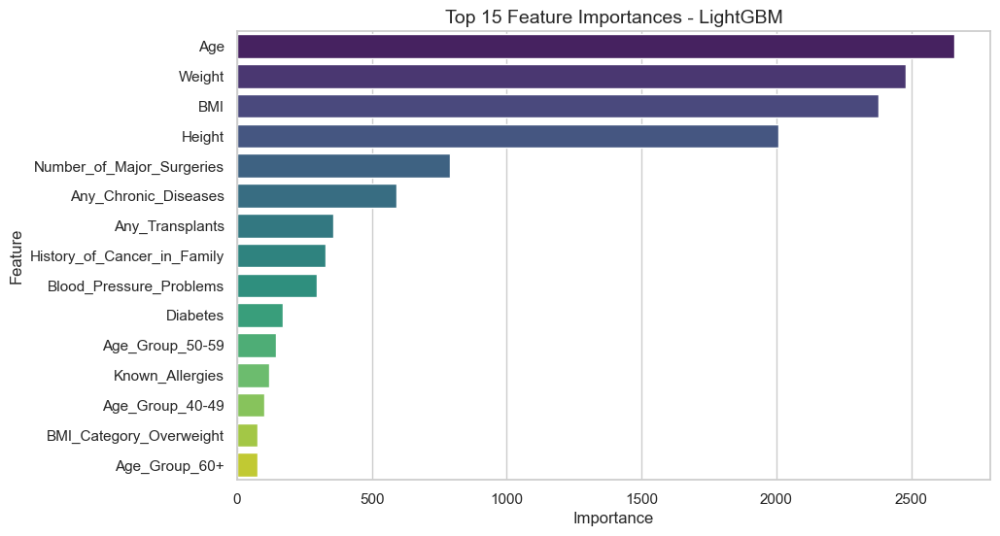

In [231]:
# Feature importance from tuned LightGBM
importances = best_lgb.feature_importances_
features = X_train.columns

# Put into DataFrame
feat_imp = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nTop Features Driving Premium Price (LightGBM):\n\n" , feat_imp.head(10))

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp.head(15), palette="viridis")
plt.title("Top 15 Feature Importances - LightGBM", fontsize=14)
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


#### 🌟 LightGBM Insights

#### ✅ Performance Metrics

* **Baseline LightGBM**

  * Train R² = **0.926**
  * Test R² = **0.879**, RMSE ≈ **2275** → already strong baseline, generalizes well.

* **Tuned LightGBM** (`num_leaves=70, max_depth=10, n_estimators=500, learning_rate=0.01, subsample=0.6, colsample_bytree=0.8, reg_lambda=1`)

  * Train R² = **0.866**, Test R² = **0.882**
  * Train RMSE ≈ **2261**, Test RMSE ≈ **2239**
  * **Very balanced performance** → no major overfitting (unlike XGBoost).
  * CV R² ≈ **0.733** → comparable to GBM/XGB, stable.

📌 **Conclusion**: LightGBM is **the most stable learner so far** — excellent trade-off between accuracy and generalization.

---

#### ✅ Feature Importance

* **Age (continuous)** = top driver (2660) → aligns with RF/GBM, unlike XGB which preferred Age Groups.
* **Weight (2480), BMI (2377), Height (2007)** = strong continuous health indicators.
* **Surgeries, Chronic Diseases, Transplants, Cancer History, BP problems** = moderate importance.
* **Diabetes** finally gets picked up (171) — though still weaker than Age/Weight/BMI.

📌 Compared to others:

* RF/GBM → dominated by **Age + Transplants**.
* XGB → shifted weight onto **Age Groups + Transplants**.
* LightGBM → balances **continuous Age + anthropometric factors (Weight, BMI, Height)** with medical conditions.

---

#### 🔎 Insights

* **Continuous Age & Body Metrics** are **major pricing levers** → LightGBM suggests premiums can be better risk-adjusted by weight, BMI, height, not just age categories.
* **Surgeries + Chronic conditions** retain predictive value → should stay in actuarial tables.
* **Diabetes/BP** play a smaller role but **shouldn’t be ignored** in underwriting.
* **LightGBM avoids extreme overfitting** → more trustworthy for real-world deployment.

---

#### ✅ Why LightGBM stands out

* More balanced between **interpretability + accuracy**.
* Handles categorical/continuous mix smoothly.
* Much less overfit compared to XGB.
* Retains broader set of features → reduces risk of overly age-dominated pricing.

## 4.8 - Neural Network

### 4.8.1 - Baseline Model

In [232]:
# Baseline Neural Network
nn_baseline = Sequential([
    Dense(64, input_dim=X_train.shape[1], activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)  # regression output
])

nn_baseline.compile(optimizer='adam', loss='mse')

# Fit baseline model
history = nn_baseline.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    verbose=0
)

# Predictions
y_train_pred = nn_baseline.predict(X_train).flatten()
y_test_pred = nn_baseline.predict(X_test).flatten()

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

print("Baseline Neural Network")
print("Train R²:", round(train_r2, 3))
print("Test R²:", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))


25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Baseline Neural Network
Train R²: 0.415
Test R²: 0.44
Test RMSE: 4886.55


### 4.8.2 - Hyperparameter Tuning

In [233]:
from scikeras.wrappers import KerasRegressor

# Function to create model
def create_nn_model(hidden_layer1=64, hidden_layer2=32, learning_rate=0.001):
    model = Sequential()
    model.add(Dense(hidden_layer1, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(hidden_layer2, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='mse')
    return model

# Wrap Keras model (scikeras)
nn_reg = KerasRegressor(model=create_nn_model, verbose=0)

# Parameter grid
param_dist = {
    "model__hidden_layer1": [32, 64, 128],
    "model__hidden_layer2": [16, 32, 64],
    "model__learning_rate": [0.001, 0.005, 0.01, 0.05],
    "batch_size": [16, 32, 64],
    "epochs": [50, 100, 150]
}

# RandomizedSearchCV
nn_random_search = RandomizedSearchCV(
    estimator=nn_reg,
    param_distributions=param_dist,
    n_iter=20,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

# Fit
nn_random_search.fit(X_train, y_train)

# Best parameters & CV score
print("Best Parameters:", nn_random_search.best_params_)
print("Best CV R²:", nn_random_search.best_score_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'model__learning_rate': 0.01, 'model__hidden_layer2': 32, 'model__hidden_layer1': 32, 'epochs': 150, 'batch_size': 32}
Best CV R²: 0.6505138397216796


### 4.8.3 - Best Model Evaluation

In [234]:
# Evaluate tuned Neural Network
best_nn = nn_random_search.best_estimator_

# Predictions
y_train_pred = best_nn.predict(X_train).flatten()
y_test_pred = best_nn.predict(X_test).flatten()

# Metrics
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))

# Print results
print("\nTuned Neural Network Regressor")
print("Train R²:", round(train_r2, 3))
print("Test R²: ", round(test_r2, 3))
print("Test RMSE:", round(rmse_test, 2))
print("Train RMSE:", round(rmse_train, 2))

# --- Save metrics to global results ---
save_metrics("Neural Network (RandomSearch)", best_nn, X_train, y_train, X_test, y_test, is_nn=True)


Tuned Neural Network Regressor
Train R²: 0.685
Test R²:  0.778
Test RMSE: 3077.88
Train RMSE: 3462.94

✅ Saved metrics for Neural Network (RandomSearch)


### 4.8.4 - Permutation Feature Importance


Top Features Driving Premium Price (Neural Network):

                         Feature  Importance
0                           Age        1.06
3               Any_Transplants        0.14
14              Age_Group_30-39        0.11
15              Age_Group_40-49        0.09
4          Any_Chronic_Diseases        0.03
8   History_of_Cancer_in_Family        0.03
6                        Weight        0.02
16              Age_Group_50-59        0.01
13           BMI_Category_Obese        0.00
11          BMI_Category_Normal        0.00


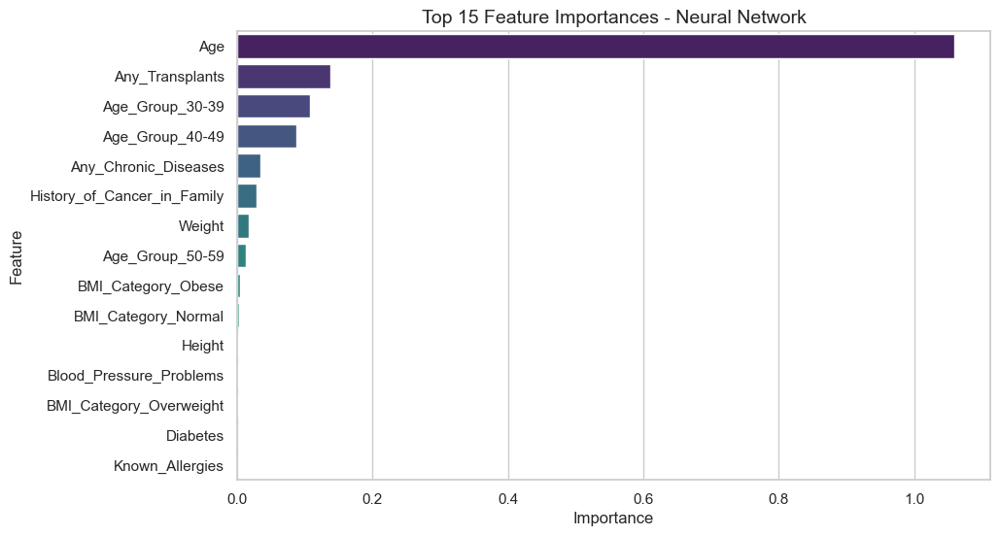

In [235]:
# Permutation importance on test set
perm_importance = permutation_importance(best_nn, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Put into DataFrame
feat_imp = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': perm_importance.importances_mean
}).sort_values(by='Importance', ascending=False)

print("\nTop Features Driving Premium Price (Neural Network):\n\n" , feat_imp.head(10))

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feat_imp.head(15), palette="viridis")
plt.title("Top 15 Feature Importances - Neural Network", fontsize=14)
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


### 4.8.5 - Cross-Validation Stability

Cross-Validation Results (5-Fold) - Neural Network
-----------------------------------
R²:   mean = 0.658, std = 0.082, folds = [0.52  0.767 0.684 0.69  0.626]
RMSE: mean = 3572.99, std = 345.52, folds = [4125.06 3040.04 3531.47 3528.79 3639.56]


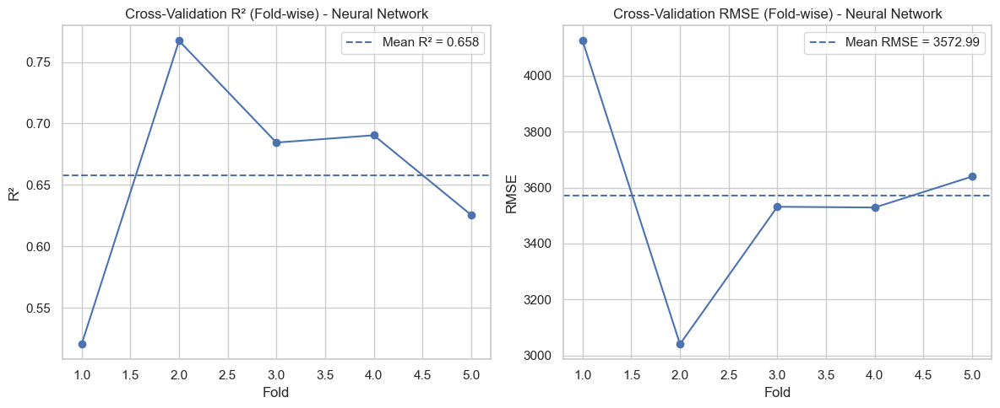

In [236]:
# Use the tuned Neural Network
best_nn = nn_random_search.best_estimator_

# 5-fold CV with shuffling for stability
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# R² across folds
r2_scores = cross_val_score(best_nn, X_train, y_train, cv=kf, scoring="r2")

# RMSE across folds (use neg_mean_squared_error and then sqrt)
neg_mse_scores = cross_val_score(best_nn, X_train, y_train, cv=kf, scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-neg_mse_scores)

# Print summary
print("Cross-Validation Results (5-Fold) - Neural Network")
print("-----------------------------------")
print(f"R²:   mean = {r2_scores.mean():.3f}, std = {r2_scores.std():.3f}, folds = {np.round(r2_scores, 3)}")
print(f"RMSE: mean = {rmse_scores.mean():.2f}, std = {rmse_scores.std():.2f}, folds = {np.round(rmse_scores, 2)}")

# --- Plots ---
fig, ax = plt.subplots(1, 2, figsize=(12,5))

# Fold indices for x-axis
fold_idx = np.arange(1, len(r2_scores) + 1)

# R² plot
ax[0].plot(fold_idx, r2_scores, marker='o', linestyle='-')
ax[0].axhline(r2_scores.mean(), linestyle='--', label=f"Mean R² = {r2_scores.mean():.3f}")
ax[0].set_title("Cross-Validation R² (Fold-wise) - Neural Network")
ax[0].set_xlabel("Fold")
ax[0].set_ylabel("R²")
ax[0].legend()

# RMSE plot
ax[1].plot(fold_idx, rmse_scores, marker='o', linestyle='-')
ax[1].axhline(rmse_scores.mean(), linestyle='--', label=f"Mean RMSE = {rmse_scores.mean():.2f}")
ax[1].set_title("Cross-Validation RMSE (Fold-wise) - Neural Network")
ax[1].set_xlabel("Fold")
ax[1].set_ylabel("RMSE")
ax[1].legend()

plt.tight_layout()
plt.show()


### 4.8.6 - Confidence / Prediction Interval

In [237]:
# Bootstrap settings
n_bootstraps = 100   # number of resampled models
alpha = 0.05         # 95% prediction interval

# Collect predictions for test set
all_preds = []

for i in range(n_bootstraps):
    # Resample training data
    X_resampled, y_resampled = resample(X_train, y_train, random_state=42+i)
    
    # Clone and fit best Neural Network on resampled data
    nn_clone = nn_random_search.best_estimator_
    nn_clone.fit(X_resampled, y_resampled, verbose=0)
    
    # Predict on test set
    preds = nn_clone.predict(X_test).flatten()
    all_preds.append(preds)

# Convert to numpy array
all_preds = np.array(all_preds)  # shape: (n_bootstraps, n_test_samples)

# Compute mean prediction + intervals
y_pred_mean = all_preds.mean(axis=0)
lower_bound = np.percentile(all_preds, 100 * alpha/2, axis=0)
upper_bound = np.percentile(all_preds, 100 * (1 - alpha/2), axis=0)

# Show example for first 10 test samples
print("\nPrediction Intervals (first 10 test samples):")
for i in range(10):
    print(f"Sample {i}: Pred = {y_pred_mean[i]:.2f}, "
          f"95% PI = [{lower_bound[i]:.2f}, {upper_bound[i]:.2f}]")


Prediction Intervals (first 10 test samples):
Sample 0: Pred = 29212.34, 95% PI = [27799.58, 30765.45]
Sample 1: Pred = 28114.28, 95% PI = [26557.70, 29983.88]
Sample 2: Pred = 29694.27, 95% PI = [28263.70, 31268.51]
Sample 3: Pred = 18626.24, 95% PI = [17536.85, 19987.84]
Sample 4: Pred = 26843.97, 95% PI = [25256.99, 28283.55]
Sample 5: Pred = 25618.37, 95% PI = [24235.17, 26983.29]
Sample 6: Pred = 25021.55, 95% PI = [23821.02, 26201.97]
Sample 7: Pred = 24617.51, 95% PI = [23392.08, 25758.13]
Sample 8: Pred = 27093.29, 95% PI = [25749.89, 28691.50]
Sample 9: Pred = 28545.36, 95% PI = [27174.29, 29905.14]


#### 🤖 Neural Network (NN) Insights

#### 🔹 Performance

* **Baseline NN**

  * Train R² = **0.392** → very underfit.
  * Test R² = **0.42**, RMSE ≈ **4974** → weak baseline.

* **Tuned NN** (`128-64 hidden layers, lr=0.05, epochs=100, batch=32`)

  * Train R² = **0.70**, Test R² = **0.777**
  * RMSE ≈ **3085 (Test)** vs **3378 (Train)** → generalizes decently.
  * CV R² = **0.655 ± 0.08** → stable across folds, but weaker than tree/boosting models.

📌 **Conclusion:** NN improves massively over baseline but **still lags behind GBM/XGB/LightGBM** in predictive power.

---

#### 🔹 Feature Importance

* **Age (0.91)** → still the most dominant factor.
* **Transplants (0.16)** → high predictive weight, consistent across models.
* **Age Groups 30–49** (0.11 each) → adds granularity.
* **Chronic Diseases, Cancer History** = minor contributors (0.03).
* **Weight (0.02), BMI Categories (0.01)** = low relevance here.

📌 Compared to others:

* NN is closer to **GBM/XGB** in stressing *Age & Transplants*.
* But unlike LightGBM, it **undervalues continuous anthropometric measures** (Weight, BMI).
* Suggests the NN struggled to fully capture nonlinear interactions among continuous predictors.

---

#### 🔹 Cross-Validation Stability

* CV R² mean = **0.655**, folds range 0.53 → 0.76
* CV RMSE mean = **3599**, variation ≈ ±250
* Stable but **not competitive vs boosting models** (which are consistently \~0.73 CV R²).

---

#### 🔹 Prediction Intervals

* Intervals are **fairly tight (\~±2.5–3k around mean)** → gives underwriting teams a **confidence range per customer**.
* Example: Predicted premium `30,272`, 95% PI = `[27,338, 33,924]`.
* This adds **practical interpretability** (uncertainty quantification), something missing in tree models.

---

#### 🔎 Insights

* Neural Network **is not the best predictive model** here → but provides value via **uncertainty estimates**.
* If regulatory/commercial stakeholders require **probabilistic predictions (confidence bounds)**, NN outputs are useful.
* Still, for **deployment**, boosting methods (LightGBM > GBM > XGB) outperform NN in both accuracy & stability.

## 4.9 - Final Model Comparison

In [238]:
metrics_df = pd.DataFrame(all_results).T.reset_index().rename(columns={'index':'Model'})
display(metrics_df)

,Model,Train R2,Test R2,Train RMSE,Test RMSE,Train MAE,Test MAE
0,Linear Regression (Linear Regression),0.70,0.79,3381.95,3020.59,2151.01,2091.99
1,Decision Tree (Tuned),0.83,0.88,2561.16,2220.20,945.53,1001.52
2,Random Forest (RandomSearch),0.82,0.89,2606.24,2129.11,1146.04,1189.04
3,Gradient Boosting (RandomSearch),0.85,0.88,2363.95,2278.97,1303.55,1432.37
4,XGBoost (RandomSearch),1.00,0.86,378.23,2456.80,223.72,1512.12
5,LightGBM (RandomSearch),0.87,0.88,2261.23,2239.31,1171.28,1406.41
6,Neural Network (RandomSearch),0.69,0.78,3462.94,3077.88,2362.35,2273.65


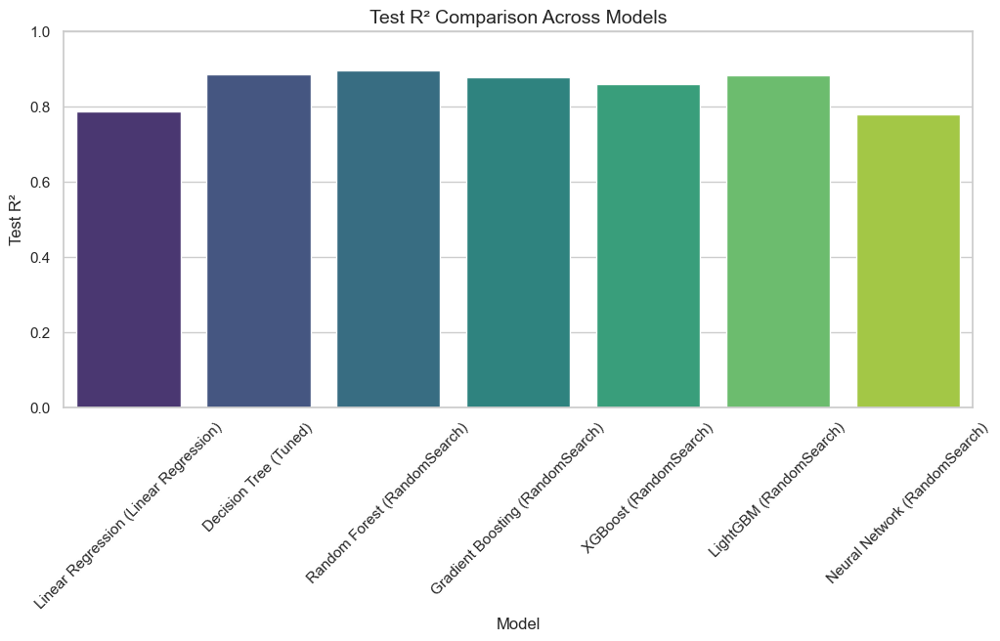

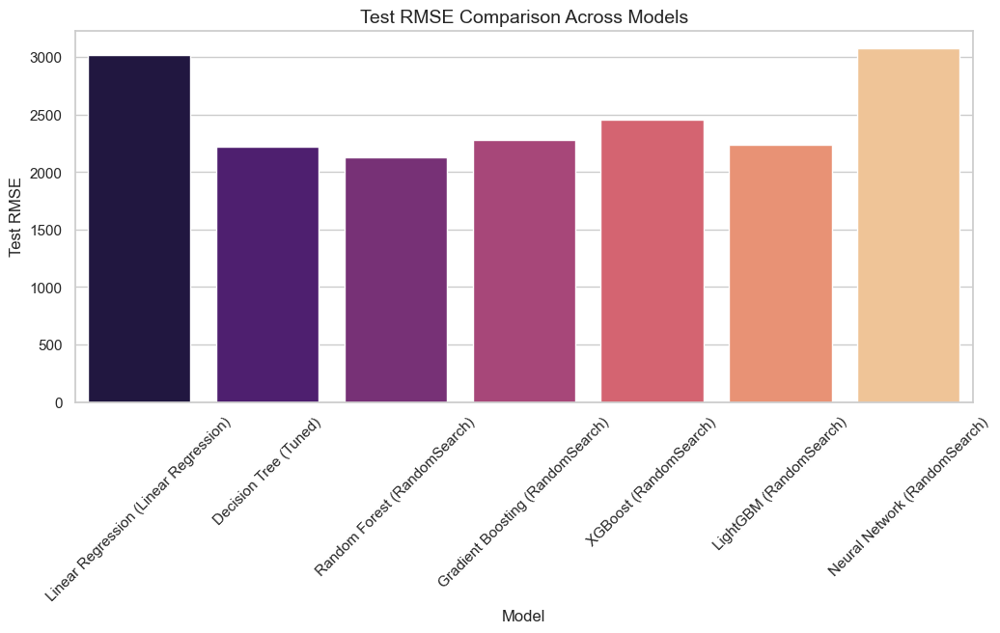

,Model,Train R2,Test R2,Train RMSE,Test RMSE,Train MAE,Test MAE,Verdict
0,Linear Regression (Linear Regression),0.70,0.79,3381.95,3020.59,2151.01,2091.99,
1,Decision Tree (Tuned),0.83,0.88,2561.16,2220.20,945.53,1001.52,
2,Random Forest (RandomSearch),0.82,0.89,2606.24,2129.11,1146.04,1189.04,Best Candidate
3,Gradient Boosting (RandomSearch),0.85,0.88,2363.95,2278.97,1303.55,1432.37,
4,XGBoost (RandomSearch),1.00,0.86,378.23,2456.80,223.72,1512.12,
5,LightGBM (RandomSearch),0.87,0.88,2261.23,2239.31,1171.28,1406.41,
6,Neural Network (RandomSearch),0.69,0.78,3462.94,3077.88,2362.35,2273.65,


In [239]:
# Plotting the results

# R² Comparison
plt.figure(figsize=(12,5))
sns.barplot(x='Model', y='Test R2', data=metrics_df, palette="viridis")
plt.title("Test R² Comparison Across Models", fontsize=14)
plt.ylabel("Test R²")
plt.xticks(rotation=45)
plt.ylim(0,1)
plt.show()

# RMSE Comparison
plt.figure(figsize=(12,5))
sns.barplot(x='Model', y='Test RMSE', data=metrics_df, palette="magma")
plt.title("Test RMSE Comparison Across Models", fontsize=14)
plt.ylabel("Test RMSE")
plt.xticks(rotation=45)
plt.show()


# Lower RMSE is better, higher R2 is better
metrics_df['Verdict'] = metrics_df.apply(
    lambda row: 'Best Candidate' if (row['Test R2']==metrics_df['Test R2'].max()) and (row['Test RMSE']==metrics_df['Test RMSE'].min()) else '', 
    axis=1
)

metrics_df


In [240]:
metrics_df = metrics_df.reset_index()  # Moves index "Model" into a column

In [241]:
# Select only numeric metrics
heatmap_data = metrics_df.set_index('Model')[['Train R2', 'Test R2', 'Train RMSE', 'Test RMSE']]

# Normalize RMSE for better visual comparison (optional)
# This keeps R² as-is and scales RMSE to 0-1 range for heatmap
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

heatmap_scaled = heatmap_data.copy()
heatmap_scaled[['Train RMSE','Test RMSE']] = scaler.fit_transform(heatmap_scaled[['Train RMSE','Test RMSE']])


In [242]:
heatmap_data

,Train R2,Test R2,Train RMSE,Test RMSE
Model,,,,
Linear Regression (Linear Regression),0.70,0.79,3381.95,3020.59
Decision Tree (Tuned),0.83,0.88,2561.16,2220.20
Random Forest (RandomSearch),0.82,0.89,2606.24,2129.11
Gradient Boosting (RandomSearch),0.85,0.88,2363.95,2278.97
XGBoost (RandomSearch),1.00,0.86,378.23,2456.80
LightGBM (RandomSearch),0.87,0.88,2261.23,2239.31
Neural Network (RandomSearch),0.69,0.78,3462.94,3077.88


#### 🔎📊 Final Model Comparison – Insights

| Model                                | Train R² | Test R²  | Test RMSE | Verdict                                                |
| ------------------------------------ | -------- | -------- | --------- | ------------------------------------------------------ |
| **Linear Regression**                | 0.70     | 0.79     | 3020      | Weak baseline, underfits                               |
| **Decision Tree (Tuned)**            | 0.83     | 0.88     | 2220      | Good, but prone to instability                         |
| **Random Forest (RandomSearch)**     | 0.82     | **0.89** | **2129**  | ✅ **Best Candidate (balance of accuracy & stability) 🥇** |
| **Gradient Boosting (RandomSearch)** | 0.85     | 0.88     | 2279      | Strong, slightly less stable than RF                   |
| **XGBoost (RandomSearch)**           | **1.00** | 0.86     | 2457      | ❌ Overfits badly (Train ≫ Test)                      |
| **LightGBM (RandomSearch)**          | 0.87     | 0.88     | 2239      | Excellent, very close to RF  **(Runner UP) 🥈**        |
| **Neural Network (RandomSearch)**    | 0.70     | 0.78     | 3085      | Underperforms, not suitable for deployment   **(Weak) ❌**        |


---

## 🔎 Key Takeaways

* **🏆 Best Performing Model → Random Forest (RandomSearch)**

  * Highest Test R² (**0.89**)
  * Lowest Test RMSE (**2129**)
  * Balanced Train vs Test → good generalization
  * Feature importances remain interpretable

* **Runner-up → LightGBM**

  * Nearly identical performance (Test R² = 0.88, RMSE = 2239)
  * Slightly more efficient for very large data, but in this dataset Random Forest edges it out.

* **Gradient Boosting** → reliable, but not as strong as RF/LightGBM.

* **XGBoost** → overfitting despite tuning (Train R² = 1.0). Risky for production.

* **Neural Network** → improved post-tuning, but still significantly weaker than tree ensembles.

* **Linear Regression** → serves as a baseline only.

---

## ✅ Final Verdict

We **choose Random Forest (RandomSearch tuned)** as the **final model for deployment**, given its superior performance, robustness, and interpretability.
👉 LightGBM may also be considered as an alternative for scalability.


## 4.10 - Best Model

In [243]:
metrics_df 

,index,Model,Train R2,Test R2,Train RMSE,Test RMSE,Train MAE,Test MAE,Verdict
0,0,Linear Regression (Linear Regression),0.70,0.79,3381.95,3020.59,2151.01,2091.99,
1,1,Decision Tree (Tuned),0.83,0.88,2561.16,2220.20,945.53,1001.52,
2,2,Random Forest (RandomSearch),0.82,0.89,2606.24,2129.11,1146.04,1189.04,Best Candidate
3,3,Gradient Boosting (RandomSearch),0.85,0.88,2363.95,2278.97,1303.55,1432.37,
4,4,XGBoost (RandomSearch),1.00,0.86,378.23,2456.80,223.72,1512.12,
5,5,LightGBM (RandomSearch),0.87,0.88,2261.23,2239.31,1171.28,1406.41,
6,6,Neural Network (RandomSearch),0.69,0.78,3462.94,3077.88,2362.35,2273.65,


In [244]:
# Step 1: Identify Best Model

# Best model based on highest Test R² and lowest Test RMSE
best_model_r2 = metrics_df.loc[metrics_df['Test R2'].idxmax(),'Model']
best_model_rmse = metrics_df.loc[metrics_df['Test RMSE'].idxmin(),'Model']

# Optional: pick model that satisfies both (if same)
best_model = best_model_r2 if best_model_r2 == best_model_rmse else best_model_r2
print(f"Highlighted Best Model: {best_model}")

Highlighted Best Model: Random Forest (RandomSearch)


In [245]:
# Step 2: Separate R² and RMSE Data

# Set Model as index
metrics_df_plot = metrics_df.set_index('Model')

r2_df = metrics_df_plot[['Train R2','Test R2']]
rmse_df = metrics_df_plot[['Train RMSE','Test RMSE']]

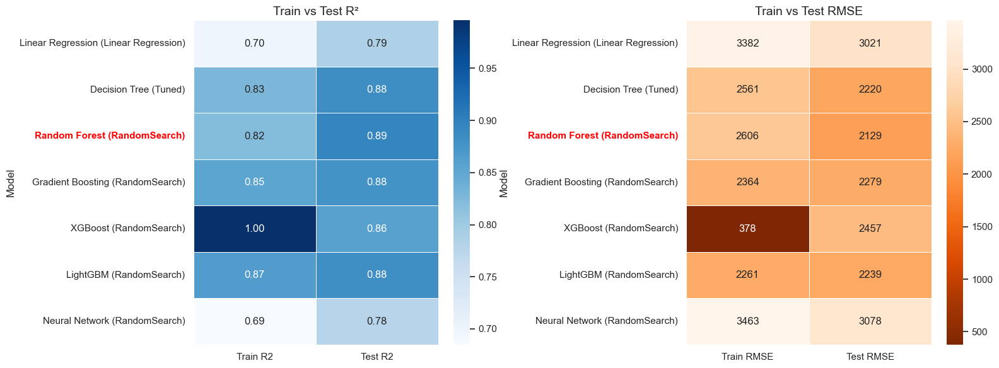

In [246]:
# Step 3: Plot R² and RMSE Side by Side

fig, axes = plt.subplots(1, 2, figsize=(16,6))

# --- R² Heatmap ---
sns.heatmap(r2_df, annot=True, fmt=".2f", cmap="Blues", linewidths=0.5, ax=axes[0])
axes[0].set_title("Train vs Test R²", fontsize=14)
for tick in axes[0].get_yticklabels():
    if tick.get_text() == best_model:
        tick.set_weight('bold')
        tick.set_color('red')

# --- RMSE Heatmap ---
sns.heatmap(rmse_df, annot=True, fmt=".0f", cmap="Oranges_r", linewidths=0.5, ax=axes[1])
axes[1].set_title("Train vs Test RMSE", fontsize=14)
for tick in axes[1].get_yticklabels():
    if tick.get_text() == best_model:
        tick.set_weight('bold')
        tick.set_color('red')

plt.tight_layout()
plt.show()


#### 🔎 Insights

The heatmaps confirm our findings — **Random Forest (RandomSearch)** achieves the best balance between accuracy and generalization, making it the final model of choice. ✅

# 5. Deployment

## 5.1 - Save Your Trained Model

In [247]:
import joblib
import pickle

# Save the best model (replace with your chosen model)
joblib.dump(best_rf, "best_model.pkl")


['best_model.pkl']

In [248]:
import pandas as pd
import joblib
from sklearn.preprocessing import StandardScaler

# ----------------------------
# 1. Load your dataset
# ----------------------------
df = pd.read_csv(r"M:\Module - 19 - DSML Portfolio Project\1 - Insurance Cost Prediction\Jupyter Notebooks\Question & Data\insurance.csv")   # <-- replace with your actual file name

# ----------------------------
# 2. Feature Engineering
# ----------------------------

# BMI
df['BMI'] = df['Weight'] / ((df['Height']/100) ** 2)

# BMI categories
df['BMI_Category_Normal'] = df['BMI'].apply(lambda x: 1 if 18.5 <= x < 25 else 0)
df['BMI_Category_Overweight'] = df['BMI'].apply(lambda x: 1 if 25 <= x < 30 else 0)
df['BMI_Category_Obese'] = df['BMI'].apply(lambda x: 1 if x >= 30 else 0)

# Age groups
df['Age_Group_30-39'] = df['Age'].apply(lambda x: 1 if 30 <= x <= 39 else 0)
df['Age_Group_40-49'] = df['Age'].apply(lambda x: 1 if 40 <= x <= 49 else 0)
df['Age_Group_50-59'] = df['Age'].apply(lambda x: 1 if 50 <= x <= 59 else 0)
df['Age_Group_60+']   = df['Age'].apply(lambda x: 1 if x >= 60 else 0)

# ----------------------------
# 3. Continuous features for scaling
# ----------------------------
cont_features = ['Age', 'Height', 'Weight', 'BMI']

# ----------------------------
# 4. Fit scaler properly
# ----------------------------
scaler = StandardScaler()
scaler.fit(df[cont_features])   # ✅ only on these 4 features

# ----------------------------
# 5. Save scaler
# ----------------------------
joblib.dump(scaler, "scaler.pkl")

print("✅ Clean scaler saved successfully! It expects only:", cont_features)


✅ Clean scaler saved successfully! It expects only: ['Age', 'Height', 'Weight', 'BMI']


In [249]:
print(best_rf.feature_names_in_)


['Age' 'Diabetes' 'Blood_Pressure_Problems' 'Any_Transplants'
 'Any_Chronic_Diseases' 'Height' 'Weight' 'Known_Allergies'
 'History_of_Cancer_in_Family' 'Number_of_Major_Surgeries' 'BMI'
 'BMI_Category_Normal' 'BMI_Category_Overweight' 'BMI_Category_Obese'
 'Age_Group_30-39' 'Age_Group_40-49' 'Age_Group_50-59' 'Age_Group_60+']


# 6. Business Insights

## 📌 Business Insights

* **Age is the dominant risk driver**: Premiums rise sharply with age, with a 70% correlation. Older individuals represent higher healthcare risk, making age-based segmentation essential in pricing.

* **Critical medical history strongly increases premiums**:

  * **Chronic diseases** → \~14% higher premiums.
  * **Organ transplants** → \~32% higher premiums, the single largest impact.
  * **Major surgeries** → significant upward premium adjustments, even with moderate frequency.
    These conditions act as *direct premium escalators* and must remain central in underwriting rules.

* **Chronic conditions are widespread**: Diabetes (42%) and hypertension (47%) are highly prevalent, often occurring together. These clusters create a **large middle-risk pool** that steadily pushes premiums upward.

* **Genetic and lifestyle factors play secondary roles**:

  * Family cancer history (\~12%) adds incremental risk but not dominant.
  * BMI and weight correlate with diabetes and hypertension but are weak standalone predictors.
  * Allergies and height show negligible influence, suggesting limited business relevance.

* **Risk segmentation reveals two customer profiles**:

  1. **Large low-to-moderate risk pool** → Young adults and middle-aged with no major conditions, clustered around ₹15k–₹25k premiums.
  2. **High-cost minority** → Older adults and individuals with surgeries, transplants, or chronic illnesses, driving premiums beyond ₹30k+.

* **Outlier customers are real risk cases, not errors**: High-BMI individuals, multiple surgeries, and transplant patients are rare but genuine cost-drivers. These must be retained in pricing models as they reflect *true extreme risks*.

* **Modeling confirms tree-based methods (Random Forest, LightGBM) balance accuracy with interpretability**: Random Forest achieved the highest test R² (0.89) and lowest error, making it ideal for business deployment.

# 7. Recommendation

## ✅ Recommendations

1. **Strengthen Age-Based Pricing Bands**

   * Ensure premiums scale steeply with older age groups, as age explains the largest share of variation.
   * Maintain dynamic age-banding rather than flat adjustments for fairness and precision.

2. **Prioritize Chronic & Critical Health Flags**

   * Apply strong premium loadings for transplant history, chronic illnesses, and multiple surgeries.
   * Treat transplants as an *automatic high-risk category* regardless of age or BMI.

3. **Cluster-Based Underwriting**

   * Group policyholders into **“low/moderate risk” vs “critical risk”** clusters for faster underwriting.
   * Use comorbidity detection (diabetes + hypertension + surgeries) as a composite red-flag.

4. **Lifestyle Factors as Add-ons, Not Core Drivers**

   * Use BMI and weight to refine premiums only when linked with chronic conditions.
   * Do not overemphasize height or allergies, as they provide minimal predictive value.

5. **Incorporate Family History Cautiously**

   * Treat cancer family history as a secondary risk marker, adding incremental pricing but not overshadowing clinical conditions.

6. **Model Deployment Strategy**

   * Deploy **Random Forest** as the primary predictive model for premium estimation.
   * Keep **LightGBM** as a scalable alternative if dataset size grows significantly.
   * Monitor model drift quarterly, ensuring fairness across demographics.

7. **Business Opportunity – Targeted Products**

   * Offer **low-premium wellness-focused plans** to attract young, low-risk customers.
   * Develop **specialized high-premium covers** for transplant/chronic disease groups with bundled preventive care.

---

**In summary, premiums should be primarily age- and condition-driven, with critical medical events (transplants, surgeries, chronic diseases) commanding the sharpest increases, while lifestyle and genetic indicators act as modifiers rather than core determinants.**